In [2]:
import coba as cb
import torch
from pathlib import Path
from collections import defaultdict, Counter
from itertools import islice, chain, count, product, repeat
from contextlib import nullcontext

data_dir = "../data"

import coba as cb

import warnings

import time
import csv
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.base import BaseEstimator
from sklearn.preprocessing import RobustScaler, QuantileTransformer, MinMaxScaler, StandardScaler
from sklearn.feature_selection import  mutual_info_classif, f_classif, GenericUnivariateSelect
from sklearn.model_selection import cross_validate, cross_val_predict, StratifiedKFold, GridSearchCV, LeaveOneGroupOut, StratifiedShuffleSplit
from sklearn.metrics import balanced_accuracy_score, mean_squared_error, mean_absolute_error
from sklearn.pipeline import Pipeline

import torch
from parameterfree import COCOB

from sklearn.dummy import DummyRegressor, DummyClassifier
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from xgboost import XGBClassifier

from concurrent.futures import ProcessPoolExecutor

import torch
import torch.utils
import torch.utils.data
import coba as cb
from typing import Tuple, Optional

try:
    torch.set_num_threads(3)
    torch.set_num_interop_threads(3)
except RuntimeError:
    pass

c0 = "#444"
c1 = "#0072B2"
c2 = "#E69F00"
c3 = "#009E73"
c4 = "#56B4E9"
c5 = "#D55E00"
c6 = "#F0E442"
c7 = "#CC79A7"
c8 = "#000000"
c9 = "#332288"

torch.set_default_device('cpu')
plt.rc('font', **{'size': 20})

def add_day_columns(df, timestamp_col, participant_df):
    return add_rel_day(add_start_day(add_day(df, timestamp_col), participant_df))

def add_day(df, timestamp_col):
    df = df.copy()
    df["Day"] = (df[timestamp_col]/(60*60*24)).apply(np.floor)
    return df

def add_start_day(df, participant_df):
    participant_df = participant_df.copy()
    participant_df["StartDay"] = (participant_df["DataStartStampUtc"]/(60*60*24)).apply(np.floor)
    return pd.merge(df, participant_df[['ParticipantId',"StartDay"]])

def add_rel_day(df):
    df = df.copy()
    df["RelDay"] = df["Day"]-df["StartDay"]
    return df

def scale(df, group_col, scale_col, scaler, postfix):
    for gid in set(df[group_col]):
        df.loc[df[group_col]==gid,[scale_col+postfix]] = scaler.fit_transform(df.loc[df[group_col]==gid,[scale_col]])

def drop_all1_ends(df):

    drop = df.copy()
    keep = df.copy()
    
    drop = drop[drop["State Anxiety"]!= 1]
    drop = drop.groupby("ParticipantId")["RelDay"].max().reset_index()
    drop = drop.rename(columns={"RelDay":"Last Day With Anxiety > 1"})
    drop = drop[drop["Last Day With Anxiety > 1"] <= 8 ]

    for pid,day in drop.itertuples(index=False):
        is_not_pid = keep["ParticipantId"] != pid
        is_lt_day  = keep["RelDay"] < day
        keep = keep[is_not_pid | is_lt_day]

    return keep

def get_trimmed_pids(df):
    df = df.copy()
    df = df[~df["ER Interest"].isna()]
    df = df.groupby(["ParticipantId","RelDay"]).size().reset_index(drop=False)
    df = df.groupby(['ParticipantId']).size().reset_index(drop=False).rename(columns={0:"Count"})
    return df.loc[df.Count < 6,'ParticipantId'].tolist()

runs_df = pd.read_csv(f'{data_dir}/Runs.csv')
states_df = pd.read_csv(f'{data_dir}/States.csv')
emotions_df = pd.read_csv(f'{data_dir}/Emotions.csv')
participant_df = pd.read_csv(f'{data_dir}/Participants.csv')

emotions_df = emotions_df[emotions_df["WatchDataQuality"] == "Good"]

emotions_df["ER Interest"] = pd.to_numeric(emotions_df["ER Interest"], errors='coerce')
emotions_df["Phone ER Interest"] = pd.to_numeric(emotions_df["Phone ER Interest"], errors='coerce')
emotions_df["Response Time (min)"] = (emotions_df["SubmissionTimestampUtc"] - emotions_df["DeliveredTimestampUtc"])/60

runs_df = add_day_columns(runs_df, "DeliveredTimestampUtc", participant_df)
states_df = add_day_columns(states_df, "TimestampUtc", participant_df)
emotions_df = add_day_columns(emotions_df, "OpenedTimestampUtc", participant_df)

to_trim = get_trimmed_pids(emotions_df)

runs_df = runs_df[~runs_df["ParticipantId"].isin(to_trim)]
states_df = states_df[~states_df["ParticipantId"].isin(to_trim)]
emotions_df = emotions_df[~emotions_df["ParticipantId"].isin(to_trim)]

runs_df = runs_df[runs_df["RelDay"] < 11]
states_df = states_df[states_df["RelDay"] < 11]
emotions_df = emotions_df[emotions_df["RelDay"] < 11]

emotions_df = drop_all1_ends(emotions_df)

def _cal_freq_list(freq_init, frequency_num, max_radius, min_radius):
    if freq_init == "random":
        # the frequence we use for each block, alpha in ICLR paper
        # freq_list shape: (frequency_num)
        freq_list = np.random.random(size=[frequency_num]) * max_radius
    elif freq_init == "geometric":
        # freq_list = []
        # for cur_freq in range(frequency_num):
        #     base = 1.0/(np.power(max_radius, cur_freq*1.0/(frequency_num-1)))
        #     freq_list.append(base)

        # freq_list = np.asarray(freq_list)

        log_timescale_increment = (np.log(float(max_radius) / float(min_radius)) /
          (frequency_num*1.0 - 1))

        timescales = min_radius * np.exp(
            np.arange(frequency_num).astype(float) * log_timescale_increment)

        freq_list = 1.0/timescales

    return freq_list

class TheoryGridCellSpatialRelationEncoder(torch.nn.Module):
    """
    Given a list of (deltaX,deltaY), encode them using the position encoding function

    """
    def __init__(self, spa_embed_dim, coord_dim = 2, frequency_num = 16, 
        max_radius = 10000,  min_radius = 1000, freq_init = "geometric", ffn = None):
        """
        Args:
            spa_embed_dim: the output spatial relation embedding dimention
            coord_dim: the dimention of space, 2D, 3D, or other
            frequency_num: the number of different sinusoidal with different frequencies/wavelengths
            max_radius: the largest context radius this model can handle
        """
        super(TheoryGridCellSpatialRelationEncoder, self).__init__()
        self.frequency_num = frequency_num
        self.coord_dim = coord_dim 
        self.max_radius = max_radius
        self.min_radius = min_radius
        self.spa_embed_dim = spa_embed_dim
        self.freq_init = freq_init

        # the frequence we use for each block, alpha in ICLR paper
        self.cal_freq_list()
        self.cal_freq_mat()

        # there unit vectors which is 120 degree apart from each other
        self.unit_vec1 = np.asarray([1.0, 0.0])                        # 0
        self.unit_vec2 = np.asarray([-1.0/2.0, np.sqrt(3)/2.0])      # 120 degree
        self.unit_vec3 = np.asarray([-1.0/2.0, -np.sqrt(3)/2.0])     # 240 degree

        self.input_embed_dim = self.cal_input_dim()

        self.ffn = ffn
        
    def cal_freq_list(self):
        self.freq_list = _cal_freq_list(self.freq_init, self.frequency_num, self.max_radius, self.min_radius)

    def cal_freq_mat(self):
        # freq_mat shape: (frequency_num, 1)
        freq_mat = np.expand_dims(self.freq_list, axis = 1)
        # self.freq_mat shape: (frequency_num, 6)
        self.freq_mat = np.repeat(freq_mat, 6, axis = 1)

    def cal_input_dim(self):
        # compute the dimention of the encoded spatial relation embedding
        return int(6 * self.frequency_num)


    def make_input_embeds(self, coords):
        if type(coords) == np.ndarray:
            assert self.coord_dim == np.shape(coords)[2]
            coords = list(coords)
        elif type(coords) == list:
            coords = [[c] for c in coords]
            assert self.coord_dim == len(coords[0][0])
        else:
            raise Exception("Unknown coords data type for GridCellSpatialRelationEncoder")

        
        # (batch_size, num_context_pt, coord_dim)
        coords_mat = np.asarray(coords).astype(float)
        batch_size = coords_mat.shape[0]
        num_context_pt = coords_mat.shape[1]

        # compute the dot product between [deltaX, deltaY] and each unit_vec 
        # (batch_size, num_context_pt, 1)
        angle_mat1 = np.expand_dims(np.matmul(coords_mat, self.unit_vec1), axis = -1)
        # (batch_size, num_context_pt, 1)
        angle_mat2 = np.expand_dims(np.matmul(coords_mat, self.unit_vec2), axis = -1)
        # (batch_size, num_context_pt, 1)
        angle_mat3 = np.expand_dims(np.matmul(coords_mat, self.unit_vec3), axis = -1)

        # (batch_size, num_context_pt, 6)
        angle_mat = np.concatenate([angle_mat1, angle_mat1, angle_mat2, angle_mat2, angle_mat3, angle_mat3], axis = -1)
        # (batch_size, num_context_pt, 1, 6)
        angle_mat = np.expand_dims(angle_mat, axis = -2)
        # (batch_size, num_context_pt, frequency_num, 6)
        angle_mat = np.repeat(angle_mat, self.frequency_num, axis = -2)
        # (batch_size, num_context_pt, frequency_num, 6)
        angle_mat = angle_mat * self.freq_mat
        # (batch_size, num_context_pt, frequency_num*6)
        spr_embeds = np.reshape(angle_mat, (batch_size, num_context_pt, -1))

        # make sinuniod function
        # sin for 2i, cos for 2i+1
        # spr_embeds: (batch_size, num_context_pt, frequency_num*6=input_embed_dim)
        spr_embeds[:, :, 0::2] = np.sin(spr_embeds[:, :, 0::2])  # dim 2i
        spr_embeds[:, :, 1::2] = np.cos(spr_embeds[:, :, 1::2])  # dim 2i+1
        
        return spr_embeds.squeeze().tolist()
        
    def forward(self, coords):
        """
        Given a list of coords (deltaX, deltaY), give their spatial relation embedding
        Args:
            coords: a python list with shape (batch_size, num_context_pt, coord_dim)
        Return:
            sprenc: Tensor shape (batch_size, num_context_pt, spa_embed_dim)
        """
        spr_embeds = self.make_input_embeds(coords)

        # spr_embeds: (batch_size, num_context_pt, input_embed_dim)
        spr_embeds = torch.FloatTensor(spr_embeds) 

        if self.ffn is not None:
            return self.ffn(spr_embeds)
        else:
            return spr_embeds

def wins(file_path, timestamps, window_len):
    file = open(file_path) if Path(file_path).exists() else nullcontext()
    rows = islice(csv.reader(file),1,None) if Path(file_path).exists() else [] #type: ignore

    with file:
        for timestamp in timestamps:
            window = []
            for row in rows:
                if float(row[0]) < timestamp-window_len: continue
                if float(row[0]) > timestamp: break
                data = map(float,row[1:])
                window.append(next(data) if len(row) == 2 else tuple(data))
            yield window

def miss(miss, not_miss, n_feat):
    features = []
    for m in miss:
        if m: features.append([0]*n_feat+[1])
        else: features.append(not_miss.pop()+[0])
    return features

def hrs(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"{data_dir}/phone/{pid}/HeartRate.csv", timestamps, window_len or 100):
        w = list(filter(None,w))
        missings.append(not w)
        if not w: continue
        features.append([np.mean(w),np.std(w)])
    if features: features = StandardScaler().fit_transform(features).tolist()
    return miss(missings,features,6) 

def scs(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"{data_dir}/phone/{pid}/StepCount.csv", timestamps, window_len or 100):
        missings.append(not w)
        if not w: continue
        features.append([np.mean(w),np.std(w)])
    if features: features = StandardScaler().fit_transform(features).tolist()
    return miss(missings,features,6) 

def lins1(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"{data_dir}/phone/{pid}/LinearAcceleration.csv", timestamps, window_len or 100):
        missings.append(not w)
        if not w: continue
        vars = np.var(w,axis=0)
        pcts = np.percentile([np.linalg.norm(w,axis=1)],q=[10,50,90])
        features.append([*vars,*pcts])
    if features: features = StandardScaler().fit_transform(features).tolist()
    return miss(missings,features,6)

def lins2(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"{data_dir}/watch/{pid}/LinearAcceleration.csv", timestamps, window_len or 100):
        missings.append(not w)
        if not w: continue
        vars = np.var(w,axis=0)
        pcts = np.percentile([np.linalg.norm(w,axis=1)],q=[10,50,90])
        features.append([*vars,*pcts])
    if features: features = StandardScaler().fit_transform(features).tolist()
    return miss(missings,features,6)

def bats(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"{data_dir}/phone/{pid}/Battery.csv", timestamps, window_len or 600):
        missings.append(not w)
        if not w: continue
        w = [float(w)/100 for w in w]
        features.append([np.mean(w),np.std(w)])
    return miss(missings,features,2)

def peds(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"{data_dir}/phone/{pid}/Pedometer.csv", timestamps, window_len or 100):
        missings.append(not w)
        if not w: continue
        features.append([np.mean(w),np.std(w)])
    if features: features = StandardScaler().fit_transform(features).tolist()
    return miss(missings,features,2)

def locs1(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"{data_dir}/phone/{pid}/Location.csv", timestamps, window_len or 600):
        missings.append(not w)
        if not w: continue
        features.append([*np.mean(w,axis=0)[1:]])
    
    if features: features = TheoryGridCellSpatialRelationEncoder(2,frequency_num=n_freq,max_radius=lmax,min_radius=lmin).make_input_embeds(features)
    return miss(missings,features,n_freq*6)

def locs2(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"{data_dir}/phone/{pid}/Location.csv", timestamps, window_len):
        missings.append(not w)
        if not w: continue
        features.append([*np.mean(w,axis=0)[1:]])
    
    return miss(missings,features,2)

def tims(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    features = []
    hour = 60*60
    day = 24*hour
    for timestamp,tz in zip(timestamps,tzs):

        if tz == "-04:00":
            timestamp -= 4*hour
        elif tz == "-05:00":
            timestamp -= 5*hour

        time_of_day = (timestamp/day) % 1
        day_of_week = (int(timestamp/day)+4) % 7
        is_weekend = day_of_week in [0,6]
        is_weekday = day_of_week in [1,2,3,4,5]
        features.append([time_of_day,int(is_weekend),int(is_weekday)])
    return features

def nulls(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    return [[0]*4 for t in timestamps]

def calc_feats1(work_item_and_len):
    features = []
    #for feats in zip(*[f(*work_item_and_len) for f in [tims,peds,bats,lins]]):
    #for feats in zip(*[f(*work_item_and_len) for f in [tims,lins]]):
    for feats in zip(*[f(*work_item_and_len) for f in [locs1,lins1,tims,bats,peds]]):
        features.append(list(chain.from_iterable(feats)))
    return features

def calc_feats2(work_item_and_len):
    features = []
    #for feats in zip(*[f(*work_item_and_len) for f in [tims,peds,bats,lins]]):
    #for feats in zip(*[f(*work_item_and_len) for f in [tims,lins]]):
    for feats in zip(*[f(*work_item_and_len) for f in [locs1,lins1,lins2,scs,hrs,tims,bats,peds]]):
        features.append(list(chain.from_iterable(feats)))
    return features

can_predict = emotions_df[(emotions_df["WatchDataQuality"] == "Good") & ~emotions_df["ER Interest"].isna()].copy()
can_predict = can_predict.sort_values(["ParticipantId","SubmissionTimestampUtc"])

d1 = dict(map(tuple,can_predict.groupby("ParticipantId")["SubmissionTimestampUtc"].apply(list).reset_index().itertuples(index=False)))
d2 = dict(map(tuple,can_predict.groupby("ParticipantId")["LocalTimeZone"].apply(list).reset_index().itertuples(index=False)))

work_items = []
for key in d1.keys():
    work_items.append((key, d1[key], d2[key]))

n_freq = 2
lmin = 10
lmax = 100
wlen = None

#wlen = 100 is best for lins
#wlen = 600 is best for locs1
T = (can_predict["ER Interest"]-1).astype(float).to_numpy()
Y = (T<2).astype(float)
G = can_predict["ParticipantId"].to_numpy()
X = []
with ProcessPoolExecutor(max_workers=20) as executor:
    X.extend(chain.from_iterable(executor.map(calc_feats1, zip(work_items,repeat(wlen)))))

X2 = []
with ProcessPoolExecutor(max_workers=20) as executor:
    X2.extend(chain.from_iterable(executor.map(calc_feats2, zip(work_items,repeat(wlen)))))

In [3]:
def add_day_columns(df, timestamp_col, participant_df):
    return add_rel_day(add_start_day(add_day(df, timestamp_col), participant_df))

def add_day(df, timestamp_col):
    df = df.copy()
    df["Day"] = (df[timestamp_col]/(60*60*24)).apply(np.floor)
    return df

def add_start_day(df, participant_df):
    participant_df = participant_df.copy()
    participant_df["StartDay"] = (participant_df["DataStartStampUtc"]/(60*60*24)).apply(np.floor)
    return pd.merge(df, participant_df[['ParticipantId',"StartDay"]])

def add_rel_day(df):
    df = df.copy()
    df["RelDay"] = df["Day"]-df["StartDay"]
    return df

def scale(df, group_col, scale_col, scaler, postfix):
    for gid in set(df[group_col]):
        df.loc[df[group_col]==gid,[scale_col+postfix]] = scaler.fit_transform(df.loc[df[group_col]==gid,[scale_col]])

def drop_all1_ends(df):

    drop = df.copy()
    keep = df.copy()
    
    drop = drop[drop["State Anxiety"]!= 1]
    drop = drop.groupby("ParticipantId")["RelDay"].max().reset_index()
    drop = drop.rename(columns={"RelDay":"Last Day With Anxiety > 1"})
    drop = drop[drop["Last Day With Anxiety > 1"] <= 8 ]

    for pid,day in drop.itertuples(index=False):
        is_not_pid = keep["ParticipantId"] != pid
        is_lt_day  = keep["RelDay"] < day
        keep = keep[is_not_pid | is_lt_day]

    return keep

def get_trimmed_pids(df):
    df = df.copy()
    df = df[~df["ER Interest"].isna()]
    df = df.groupby(["ParticipantId","RelDay"]).size().reset_index(drop=False)
    df = df.groupby(['ParticipantId']).size().reset_index(drop=False).rename(columns={0:"Count"})
    return df.loc[df.Count < 6,'ParticipantId'].tolist()

def make_data():
    participant_df = pd.read_csv('../data/Participants.csv')
    emotions_df = pd.read_csv('../data/Emotions.csv')
    emotions_df = emotions_df[emotions_df["WatchDataQuality"] == "Good"]
    emotions_df["ER Interest"] = pd.to_numeric(emotions_df["ER Interest"], errors='coerce')
    emotions_df = add_day_columns(emotions_df, "OpenedTimestampUtc", participant_df)
    emotions_df = emotions_df[emotions_df["RelDay"] < 11]
    emotions_df = drop_all1_ends(emotions_df)
    emotions_df = emotions_df[~emotions_df["ParticipantId"].isin(get_trimmed_pids(emotions_df))]
    return emotions_df

In [ ]:
def make_data():
    participant_df = pd.read_csv('../data/Participants.csv')
    emotions_df = pd.read_csv('../data/Emotions.csv')
    emotions_df = emotions_df[emotions_df["WatchDataQuality"] == "Good"]
    emotions_df["ER Interest"] = pd.to_numeric(emotions_df["ER Interest"], errors='coerce')
    emotions_df = add_day_columns(emotions_df, "OpenedTimestampUtc", participant_df)
    emotions_df = emotions_df[emotions_df["RelDay"] < 11]
    emotions_df = drop_all1_ends(emotions_df)
    emotions_df = emotions_df[~emotions_df["ParticipantId"].isin(get_trimmed_pids(emotions_df))]
    return emotions_df

In [4]:
runs_df = pd.read_csv('../data/Runs.csv')
states_df = pd.read_csv('../data/States.csv')
emotions_df = pd.read_csv('../data/Emotions.csv')
participant_df = pd.read_csv('../data/Participants.csv')

emotions_df = emotions_df[emotions_df["WatchDataQuality"] == "Good"]

emotions_df["ER Interest"] = pd.to_numeric(emotions_df["ER Interest"], errors='coerce')
emotions_df["Phone ER Interest"] = pd.to_numeric(emotions_df["Phone ER Interest"], errors='coerce')
emotions_df["Response Time (min)"] = (emotions_df["SubmissionTimestampUtc"] - emotions_df["DeliveredTimestampUtc"])/60

runs_df = add_day_columns(runs_df, "DeliveredTimestampUtc", participant_df)
states_df = add_day_columns(states_df, "TimestampUtc", participant_df)
emotions_df = add_day_columns(emotions_df, "OpenedTimestampUtc", participant_df)

to_trim = get_trimmed_pids(emotions_df)

runs_df = runs_df[~runs_df["ParticipantId"].isin(to_trim)]
states_df = states_df[~states_df["ParticipantId"].isin(to_trim)]
emotions_df = emotions_df[~emotions_df["ParticipantId"].isin(to_trim)]

runs_df = runs_df[runs_df["RelDay"] < 11]
states_df = states_df[states_df["RelDay"] < 11]
emotions_df = emotions_df[emotions_df["RelDay"] < 11]

emotions_df = drop_all1_ends(emotions_df)

warnings.filterwarnings("ignore", category=UserWarning)
scale(emotions_df, "ParticipantId", "Phone ER Interest", QuantileTransformer(n_quantiles=40), " (quant)")
scale(emotions_df, "ParticipantId", "Phone ER Interest", RobustScaler(), " (robust)")
scale(emotions_df, "ParticipantId", "Phone ER Interest", MinMaxScaler(), " (minmax)")
warnings.resetwarnings()

d = defaultdict(set)
for p in Path("../data/phone").glob("**/*.csv"): d[p.parent.stem].add(p.stem)
sensor_cols = sorted(set.union(*d.values()))
sensor_rows = [[k,*[c in d[k] for c in sensor_cols]] for k in sorted(d.keys())]
sensors_df = pd.DataFrame(sensor_rows,columns=["pid",*sensor_cols])

emotions_df.shape

(3213, 27)

In [4]:
def _cal_freq_list(freq_init, frequency_num, max_radius, min_radius):
    if freq_init == "random":
        # the frequence we use for each block, alpha in ICLR paper
        # freq_list shape: (frequency_num)
        freq_list = np.random.random(size=[frequency_num]) * max_radius
    elif freq_init == "geometric":
        # freq_list = []
        # for cur_freq in range(frequency_num):
        #     base = 1.0/(np.power(max_radius, cur_freq*1.0/(frequency_num-1)))
        #     freq_list.append(base)

        # freq_list = np.asarray(freq_list)

        log_timescale_increment = (np.log(float(max_radius) / float(min_radius)) /
          (frequency_num*1.0 - 1))

        timescales = min_radius * np.exp(
            np.arange(frequency_num).astype(float) * log_timescale_increment)

        freq_list = 1.0/timescales

    return freq_list

class TheoryGridCellSpatialRelationEncoder(torch.nn.Module):
    """
    Given a list of (deltaX,deltaY), encode them using the position encoding function

    """
    def __init__(self, spa_embed_dim, coord_dim = 2, frequency_num = 16, 
        max_radius = 10000,  min_radius = 1000, freq_init = "geometric", ffn = None):
        """
        Args:
            spa_embed_dim: the output spatial relation embedding dimention
            coord_dim: the dimention of space, 2D, 3D, or other
            frequency_num: the number of different sinusoidal with different frequencies/wavelengths
            max_radius: the largest context radius this model can handle
        """
        super(TheoryGridCellSpatialRelationEncoder, self).__init__()
        self.frequency_num = frequency_num
        self.coord_dim = coord_dim 
        self.max_radius = max_radius
        self.min_radius = min_radius
        self.spa_embed_dim = spa_embed_dim
        self.freq_init = freq_init

        # the frequence we use for each block, alpha in ICLR paper
        self.cal_freq_list()
        self.cal_freq_mat()

        # there unit vectors which is 120 degree apart from each other
        self.unit_vec1 = np.asarray([1.0, 0.0])                        # 0
        self.unit_vec2 = np.asarray([-1.0/2.0, np.sqrt(3)/2.0])      # 120 degree
        self.unit_vec3 = np.asarray([-1.0/2.0, -np.sqrt(3)/2.0])     # 240 degree

        self.input_embed_dim = self.cal_input_dim()

        self.ffn = ffn
        
    def cal_freq_list(self):
        self.freq_list = _cal_freq_list(self.freq_init, self.frequency_num, self.max_radius, self.min_radius)

    def cal_freq_mat(self):
        # freq_mat shape: (frequency_num, 1)
        freq_mat = np.expand_dims(self.freq_list, axis = 1)
        # self.freq_mat shape: (frequency_num, 6)
        self.freq_mat = np.repeat(freq_mat, 6, axis = 1)

    def cal_input_dim(self):
        # compute the dimention of the encoded spatial relation embedding
        return int(6 * self.frequency_num)


    def make_input_embeds(self, coords):
        if type(coords) == np.ndarray:
            assert self.coord_dim == np.shape(coords)[2]
            coords = list(coords)
        elif type(coords) == list:
            coords = [[c] for c in coords]
            assert self.coord_dim == len(coords[0][0])
        else:
            raise Exception("Unknown coords data type for GridCellSpatialRelationEncoder")

        
        # (batch_size, num_context_pt, coord_dim)
        coords_mat = np.asarray(coords).astype(float)
        batch_size = coords_mat.shape[0]
        num_context_pt = coords_mat.shape[1]

        # compute the dot product between [deltaX, deltaY] and each unit_vec 
        # (batch_size, num_context_pt, 1)
        angle_mat1 = np.expand_dims(np.matmul(coords_mat, self.unit_vec1), axis = -1)
        # (batch_size, num_context_pt, 1)
        angle_mat2 = np.expand_dims(np.matmul(coords_mat, self.unit_vec2), axis = -1)
        # (batch_size, num_context_pt, 1)
        angle_mat3 = np.expand_dims(np.matmul(coords_mat, self.unit_vec3), axis = -1)

        # (batch_size, num_context_pt, 6)
        angle_mat = np.concatenate([angle_mat1, angle_mat1, angle_mat2, angle_mat2, angle_mat3, angle_mat3], axis = -1)
        # (batch_size, num_context_pt, 1, 6)
        angle_mat = np.expand_dims(angle_mat, axis = -2)
        # (batch_size, num_context_pt, frequency_num, 6)
        angle_mat = np.repeat(angle_mat, self.frequency_num, axis = -2)
        # (batch_size, num_context_pt, frequency_num, 6)
        angle_mat = angle_mat * self.freq_mat
        # (batch_size, num_context_pt, frequency_num*6)
        spr_embeds = np.reshape(angle_mat, (batch_size, num_context_pt, -1))

        # make sinuniod function
        # sin for 2i, cos for 2i+1
        # spr_embeds: (batch_size, num_context_pt, frequency_num*6=input_embed_dim)
        spr_embeds[:, :, 0::2] = np.sin(spr_embeds[:, :, 0::2])  # dim 2i
        spr_embeds[:, :, 1::2] = np.cos(spr_embeds[:, :, 1::2])  # dim 2i+1
        
        return spr_embeds.squeeze().tolist()
        
    def forward(self, coords):
        """
        Given a list of coords (deltaX, deltaY), give their spatial relation embedding
        Args:
            coords: a python list with shape (batch_size, num_context_pt, coord_dim)
        Return:
            sprenc: Tensor shape (batch_size, num_context_pt, spa_embed_dim)
        """
        spr_embeds = self.make_input_embeds(coords)

        # spr_embeds: (batch_size, num_context_pt, input_embed_dim)
        spr_embeds = torch.FloatTensor(spr_embeds) 

        if self.ffn is not None:
            return self.ffn(spr_embeds)
        else:
            return spr_embeds

In [5]:
import torch
import torch.utils
import torch.utils.data
import coba as cb
from typing import Tuple, Optional

def balanced_accuracy_scores(y_true,y_scores):
    from operator import itemgetter
    from itertools import groupby

    nclass = len(set(y_true))
    n0,n1  = len(y_true)-sum(y_true),sum(y_true)
    c0,c1  = 0,n1
    n0,n1  = (n0*nclass or 1), (n1*nclass or 1)

    yield (0,(c0/(n0 or 1)+c1/(n1 or 1)))

    for t,g in groupby(sorted(zip(y_scores,y_true)),key=itemgetter(0)):
        ls = list(map(itemgetter(1),g))
        c0 += len(ls)-sum(ls)
        c1 -= sum(ls)
        yield (t,(c0/n0+c1/n1))

def roc_plot(row,name=None,ax=None):
    from sklearn.metrics import RocCurveDisplay
    lbl = row['labels'].tolist()
    scr = row['scores'].tolist()

    RocCurveDisplay.from_predictions(lbl,scr,name=name,plot_chance_level=True,ax=ax).ax_.set(xlabel="FPR", ylabel="TPR")

def acc_plot(row,name=None,ax=None):
    from matplotlib import pyplot as plt
    from matplotlib import ticker as mtick
    from matplotlib import transforms as mtrans
    
    lbl = row['labels'].tolist()
    scr = row['scores'].tolist()

    X,Y = zip(*balanced_accuracy_scores(lbl,scr))
    z = max(Y)

    ax = ax or plt.figure(figsize=(4.6,4.6)).gca()
    ax.plot(X,Y,label=f"{name} (BAC = {z*100:.2f}%)")
    ax.set_ylabel("Balanced Accuracy")
    ax.set_xlabel("Label Threshold")
    ax.set_aspect((max(X)-min(X))/(max(Y)-min(Y)))
    ax.yaxis.set_major_formatter(mtick.PercentFormatter(1))

    ax.axhline(z,alpha=.5)
    trans = mtrans.blended_transform_factory(ax.transAxes,ax.transData)
    ax.annotate(f'{z*100:.2f}%', xy=(1.01, z), xycoords=trans, clip_on=False, va='center')

    if name: ax.legend()

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """
        torch.manual_seed(rng)

        def make_layer(curr_dim,spec) -> Tuple[Optional[torch.nn.Module],int]:
            if isinstance(spec,float):
                return torch.nn.Dropout(spec), curr_dim
            if curr_dim is None and isinstance(spec,int):
                return None, spec
            if isinstance(spec,int):
                return torch.nn.Linear(curr_dim,spec),spec
            if spec == 'r':
                return torch.nn.ReLU(),curr_dim
            if spec == 'l':
                return torch.nn.LayerNorm(curr_dim),curr_dim
            if spec == 'b':
                return torch.nn.BatchNorm1d(curr_dim),curr_dim
            if spec == 's':
                return torch.nn.Sigmoid(),curr_dim
            if isinstance(spec,list):                
                return FeedForward.SkipModule(FeedForward([curr_dim]+spec)),curr_dim
            raise Exception("Bad Layer")

        layers,width = [],None
        for spec in specs:
            layer,width = make_layer(width,spec)
            if layer: layers.append(layer)

        super().__init__(*layers)

class FeedforwardCB(torch.nn.Module):

    def __init__(self, specs, aembed):

        super().__init__()

        self.aembed = torch.nn.Embedding(*aembed) if aembed else lambda x:x
        self.layers = FeedForward(specs)

    def forward(self,context,actions):
        actions = self.aembed(actions)
        context = context.repeat(len(actions),1)
        return self.layers(torch.cat([context,actions],dim=1))

class FeedForwardSquareCb:
    def __init__(self, specs, adim=None, gamma='lambda t: 1000'):
        self.loss   = torch.nn.MSELoss(reduction='none')
        self.fhat    = None
        self.opt     = None
        self.sched   = None
        self._adim   = adim
        self._specs  = specs
        self._params = {'layers': specs, 'gamma':gamma, 'adim':adim}
        self._gamma  = eval(gamma)
        self._rng    = cb.CobaRandom(1)
        self._t      = 1

    @property
    def params(self):
        return self._params
    
    def define(self, context, actions):
        import parameterfree
        torch.manual_seed(1)
        torch.set_num_threads(1)

        cdim   = len(context)
        adim   = self._adim or len(actions[0])
        xdim   = adim+cdim
        aembed = (len(actions),adim) if self._adim else None

        islist = lambda s: isinstance(s,list)
        isneg1 = lambda s: s == -1

        def prep(specs):
            return [ xdim if isneg1(s) else prep(s) if islist(s) else s for s in specs ]

        self.fhat  = FeedforwardCB(prep(self._specs), aembed)
        self.opt   = parameterfree.COCOB(self.fhat.parameters())

    def predict(self, context, actions):
        if not self.opt: self.define(context,actions)

        with torch.no_grad():
            mu = len(actions)
            dt = torch.float32

            x    = torch.tensor(context,dtype=dt)
            A    = torch.tensor(actions,dtype=dt) if not self._adim else torch.arange(len(actions))
            yhat = self.fhat.eval()(x,A)

            rvals       = torch.reshape(yhat, (1,-1))
            rmaxs,ridxs = rvals.max(axis=1,keepdim=True)
            rgaps       = rmaxs-rvals

            probs = 1/(mu+self._gamma(self._t)*rgaps)
            probs[range(1),ridxs.squeeze()] += 1-probs.sum(axis=1)

        return self._rng.choicew(actions,probs[0].tolist())

    def learn(self, context, action, reward, score):
        if not self.opt: self.define(context,actions)

        self._t += 1
        dt = torch.float32

        x    = torch.tensor(context ,dtype=dt)
        A    = torch.tensor([action],dtype=dt) if not self._adim else torch.tensor([action.index(1)])
        y    = torch.tensor([reward],dtype=dt)
        yhat = self.fhat.eval()(x,A)[0]
        loss = self.loss(yhat, y).mean()

        self.opt.zero_grad()
        loss.backward()

        self.opt.step()
        if self.sched: self.sched.step()

class RepeatEval:
    def __init__(self, trn_size, val_size):
        assert trn_size == 0 or val_size > 0
        assert trn_size >= 0 and val_size >=0

        self._trn_size = trn_size
        self._val_size = val_size

    @property
    def params(self):
        return {'trn_size': self._trn_size, 'val_size': self._val_size }

    def evaluate(self, env, lrn):
        from coba.pipes import Pipes, IterableSource, Shuffle
        from operator import itemgetter
        from itertools import islice

        first,rows = cb.peek_first(env.read())

        if first is None: return

        trn = IterableSource(list(islice(rows,self._trn_size)))
        val = IterableSource(list(islice(rows,self._val_size)))
        tst = IterableSource(rows)

        trainer   = cb.SequentialCB(eval=None)
        validator = cb.SequentialCB(record='reward',learn=None)
        tester    = cb.SequentialCB()

        if self._trn_size > 0:
            new_val_score = 0
            for i in range(20): #20 to make sure we don't loop forever (though we shouldn't ever hit 20)
                old_val_score = new_val_score
                if isinstance(lrn, FeedForwardSquareCb): lrn._t = 1 #reset exploration to make sure we fairly compare
                list(trainer.evaluate(Pipes.join(trn,Shuffle(i)),lrn))
                new_val_score = sum(map(itemgetter('reward'),validator.evaluate(val,lrn)))
                if new_val_score < old_val_score: break # our latest iteration on train appears to have overfit, stop training

        yield from tester.evaluate(tst,lrn)

class FeedForwardSKC(BaseEstimator):
    def __init__(self, specs = None, fhat = None, trn_size = .5, stop = 4, rng = 1, loss=None):
        self.specs = specs
        self.trn_size = trn_size
        self.fhat = fhat
        self.opt  = None
        self.loss = loss or torch.nn.BCEWithLogitsLoss()
        self.stop = stop
        self.rng  = rng

    def get_params(self, deep=True):
        return {"specs": self.specs, "trn_size": self.trn_size, "stop": self.stop, "rng": self.rng, "loss": self.loss, "fhat": self.fhat}

    def set_params(self,**params):
        return FeedForwardSKC(**{**self.get_params(), **params})

    @property
    def params(self):
        return self.get_params()

    def fit(self,X,Y):
        fhat = self.fhat
        opt  = COCOB(fhat.parameters())
        loss = self.loss

        if not torch.is_tensor(X):
            X = torch.tensor(X).float()
        if not torch.is_tensor(Y):
            Y = torch.tensor(Y).unsqueeze(1).float()

        trn,val = next(StratifiedShuffleSplit(1, train_size=self.trn_size, random_state=self.rng).split(X,Y))

        trn_X = X[trn]
        trn_y = Y[trn]
        val_X = X[val]
        val_y = Y[val]

        torch.manual_seed(self.rng)
        torch_dataset = torch.utils.data.TensorDataset(trn_X,trn_y)
        torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=64,drop_last=True,shuffle=True)

        val_losses = []
        trn_losses = []

        with torch.no_grad():
            stop_criteria = 0
            trn_losses.append(loss(fhat(trn_X),trn_y))
            val_losses.append(loss(fhat(val_X),val_y))

        for _ in range(500):
            for _X,_y in torch_loader:
                opt.zero_grad()
                loss(fhat(_X),_y).backward()
                opt.step()

            with torch.no_grad():
                trn_losses.append(loss(fhat(trn_X),trn_y))
                val_losses.append(loss(fhat(val_X),val_y))

                if self.stop == 1:
                    stop_criteria = (stop_criteria+1) if (val_losses[-1] > val_losses[-2]).item() else 0
                    if stop_criteria == 3: break
                if self.stop == 2:
                    if len(val_losses) > 3 and np.mean(val_losses[-4:-1]) < np.mean(val_losses[-3:]):
                        break
                if self.stop == 3:
                    if len(val_losses) > 3 and np.median(val_losses[-4:-1]) < np.median(val_losses[-3:]):
                        break
                if self.stop == 4:
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

    def iter_fit(self,X,y):
        self.fhat = self.fhat or FeedForward(self.specs, self.rng)
        self.opt  = self.opt or COCOB(self.fhat.parameters())
        
        if not torch.is_tensor(X):
            X = torch.tensor(X).float()
        if not torch.is_tensor(y):
            y = torch.tensor(y).unsqueeze(1).float()

        self.opt.zero_grad()
        self.loss(self.fhat(X),y).backward()
        self.opt.step()

    def predict(self,X):
        self.fhat = self.fhat or FeedForward(self.specs, self.rng)
        with torch.no_grad():
            if not torch.is_tensor(X): 
                X = torch.tensor(X).float()
            return self.fhat(X)

class FeedForwardSKR(BaseEstimator):
    def __init__(self, specs = None, trn_size = .5, stop = 4, rng = 1, loss = None):
        self.specs = specs
        self.trn_size = trn_size
        self.fhat = None
        self.opt  = None
        self.loss = loss or torch.nn.MSELoss()
        self.stop = stop
        self.rng  = rng

    def get_params(self, deep=True):
        return {"specs": self.specs, "trn_size": self.trn_size, "stop": self.stop, "rng": self.rng, "loss": self.loss}

    def set_params(self,**params):
        return FeedForwardSKR(**{**self.get_params(), **params})

    @property
    def params(self):
        return self.get_params()

    def fit(self,X,Y):

        fhat = FeedForward(self.specs, self.rng)
        opt  = COCOB(fhat.parameters())
        loss = self.loss

        self.fhat = fhat

        if not torch.is_tensor(X):
            X = torch.tensor(X).float()
        if not torch.is_tensor(Y):
            Y = torch.tensor(Y).unsqueeze(1).float()

        trn,val = next(StratifiedShuffleSplit(1, train_size=self.trn_size, random_state=self.rng).split(X,Y))

        trn_X = X[trn]
        trn_y = Y[trn]
        val_X = X[val]
        val_y = Y[val]

        torch.manual_seed(self.rng)
        torch_dataset = torch.utils.data.TensorDataset(trn_X,trn_y)
        torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=64,drop_last=True,shuffle=True)

        val_losses = []
        trn_losses = []

        with torch.no_grad():
            stop_criteria = 0
            trn_losses.append(loss(fhat(trn_X),trn_y))
            val_losses.append(loss(fhat(val_X),val_y))

        for _ in range(500):
            for _X,_y in torch_loader:
                opt.zero_grad()
                loss(fhat(_X),_y).backward()
                opt.step()

            with torch.no_grad():
                trn_losses.append(loss(fhat(trn_X),trn_y))
                val_losses.append(loss(fhat(val_X),val_y))

                if self.stop == 1:
                    stop_criteria = (stop_criteria+1) if (val_losses[-1] > val_losses[-2]).item() else 0
                    if stop_criteria == 3: break
                if self.stop == 2:
                    if len(val_losses) > 3 and np.mean(val_losses[-4:-1]) < np.mean(val_losses[-3:]):
                        break
                if self.stop == 3:
                    if len(val_losses) > 3 and np.median(val_losses[-4:-1]) < np.median(val_losses[-3:]):
                        break
                if self.stop == 4:
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

    def iter_fit(self,X,y):
        self.fhat = self.fhat or FeedForward(self.specs, self.rng)
        self.opt  = self.opt or COCOB(self.fhat.parameters())

        if not torch.is_tensor(X):
            X = torch.tensor(X).float()
        if not torch.is_tensor(y):
            y = torch.tensor(y).unsqueeze(1).float()

        self.opt.zero_grad()
        self.loss(self.fhat(X),y).backward()
        self.opt.step()

    def predict(self,X):
        self.fhat = self.fhat or FeedForward(self.specs, self.rng)
        with torch.no_grad():
            if not torch.is_tensor(X): 
                X = torch.tensor(X).float()
            return self.fhat(X)


In [ ]:
torch.tensor(2).float()

tensor(2.)

In [ ]:
def wins(file_path, timestamps, window_len=600):

    file = open(file_path) if Path(file_path).exists() else nullcontext()
    rows = islice(csv.reader(file),1,None) if Path(file_path).exists() else [] #type: ignore

    with file:
        for timestamp in timestamps:
            window = []
            for row in rows:
                if float(row[0]) < timestamp-window_len: continue
                if float(row[0]) > timestamp: break
                data = map(float,row[1:])
                window.append(next(data) if len(row) == 2 else tuple(data))
            yield window

def accs(work_item):
    pid,timestamps,tzs = work_item
    features = []
    for window in wins(f"../data/phone/{pid}/Accelerometer.csv", timestamps):
        features.append([0,0,0,1] if not window else [*np.std(window,axis=0),0])
    return features

def lins(work_item):
    pid,timestamps,tzs = work_item
    features = []
    for window in wins(f"../data/phone/{pid}/LinearAcceleration.csv", timestamps):
        features.append([0,0,0,1] if not window else [*np.std(window,axis=0),0])
    return features

def bats(work_item):
    pid,timestamps,tzs = work_item
    features = []
    for window in wins(f"../data/phone/{pid}/Battery.csv", timestamps):
        features.append([0,0,1] if not window else [np.mean(window),np.std(window),0])
    return features

def peds(work_item):
    pid,timestamps,tzs = work_item
    features = []
    for window in wins(f"../data/phone/{pid}/Pedometer.csv", timestamps, 600):
        features.append([0,0,1] if not window else [np.mean(window),np.std(window),0])
    return features

def locs(work_item):
    pid,timestamps,tzs = work_item
    features = []
    for window in wins(f"../data/phone/{pid}/Location.csv", timestamps):
        #dist = np.linalg.norm(np.diff(window,axis=0),axis=1)
        #np.mean(dist),np.std(dist)
        features.append([0,0,0,1] if not window else [*np.mean(window,axis=0),0])
    return features

def tims(work_item):
    pid,timestamps,tzs = work_item

    features = []
    for timestamp,tz in zip(timestamps,tzs):
        
        if tz == "-04:00":
            timestamp -= 60*60*4
        elif tz == "-05:00":
            timestamp -= 60*60*5
        else:
            print(tz)
            raise Exception()
        time_of_day = (timestamp/(60*60*24)) % 1
        day_of_week = int(timestamp / (60*60*24)) % 7
        features.append([time_of_day,day_of_week])
    return features

def calc_feats(work_items):
    features = []
    for feats in zip(*[f(work_items) for f in [locs,peds,bats,lins,accs,tims]]):
        features.append(list(chain.from_iterable(feats)))
    return features

can_predict = emotions_df[(emotions_df["WatchDataQuality"] == "Good") & ~emotions_df["ER Interest"].isna()].copy()
can_predict = can_predict.sort_values(["ParticipantId","SubmissionTimestampUtc"])

d1 = dict(map(tuple,can_predict.groupby("ParticipantId")["SubmissionTimestampUtc"].apply(list).reset_index().itertuples(index=False)))
d2 = dict(map(tuple,can_predict.groupby("ParticipantId")["LocalTimeZone"].apply(list).reset_index().itertuples(index=False)))

work_items = []
for key in d1.keys():
    work_items.append((key, d1[key], d2[key]))

X = []
Y = (can_predict["ER Interest"]-1).astype(int).tolist()
G = can_predict["ParticipantId"].tolist()

start = time.time()
with ProcessPoolExecutor(max_workers=20) as executor:
    X.extend(chain.from_iterable(executor.map(calc_feats, work_items)))
print(round((time.time()-start),2))


KeyboardInterrupt: 

In [ ]:
def evaluate(X, Y, G, model, params, n_feats=None, scaler=None):

    outer_cv = LeaveOneGroupOut() if G else StratifiedKFold(n_splits=30, shuffle=True, random_state=2)
    inner_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

    X = np.array(X)
    Y = np.array(Y)
    G = np.array(G)

    if scaler:
        for pid in set(G):
            X[pid==G] = scaler.fit_transform(X[pid==G])

    if n_feats and n_feats != X.shape[0]:
        params = {**{"s__score_func": [mutual_info_classif]}, **{f"p__{k}":v for k,v in params.items()}}
        model  = Pipeline([('s',GenericUnivariateSelect(mode='k_best',param=n_feats)), ('p',model)])

    if params:
        inner = GridSearchCV(estimator=model, param_grid=params, scoring='balanced_accuracy', cv=inner_cv, n_jobs=1)
    else:
        inner = model

    preds = cross_val_predict(inner, X, Y, cv=outer_cv, groups=G, n_jobs=5)
    return round(balanced_accuracy_score(Y, preds),3)

skip = lambda w : ['l', 'r', w, 'l', 'r', w]

specs = []
for w in [10]:
    specs.extend([
        [20, w, *skip(w), 10],
        [20, w, *skip(w), *skip(w), 10],
        [20, w, skip(w), skip(w), 10],
    ])

Y = (can_predict["ER Interest"]-1).astype(int).tolist()
G = can_predict["ParticipantId"].tolist()

to_evaluate = [
    (DummyClassifier(), {}, {}),
    *[(FeedForwardSKC(spec), {}, {"scaler":StandardScaler()}) for spec in specs],
    (RandomForestClassifier(5,class_weight='balanced'), {"ccp_alpha": [0.0, 0.005, 0.01, 0.03]}, {"n_feats":10}),
]

for model,params,kwargs in to_evaluate:
    print()
    print(f"{evaluate(X,Y,G,model,params,**kwargs)} -- {model} -- {params}")



0.1 -- DummyClassifier() -- {}

0.098 -- FeedForwardSKC(specs=[20, 10, 'l', 'r', 10, 'l', 'r', 10, 10]) -- {}

0.096 -- FeedForwardSKC(specs=[20, 10, 'l', 'r', 10, 'l', 'r', 10, 'l', 'r', 10, 'l',
                      'r', 10, 10]) -- {}

0.095 -- FeedForwardSKC(specs=[20, 10, ['l', 'r', 10, 'l', 'r', 10],
                      ['l', 'r', 10, 'l', 'r', 10], 10]) -- {}

0.113 -- RandomForestClassifier(class_weight='balanced', n_estimators=5) -- {'ccp_alpha': [0.0, 0.005, 0.01, 0.03]}


In [ ]:
def evaluate(X, Y, G, model, params, n_feats=None, scaler=None):

    outer_cv = LeaveOneGroupOut() if G else StratifiedKFold(n_splits=30, shuffle=True, random_state=2)
    inner_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

    X = np.array(X)
    Y = np.array(Y)
    G = np.array(G)

    if scaler:
        for pid in set(G):
            X[pid==G] = scaler.fit_transform(X[pid==G])

    if n_feats and n_feats != X.shape[0]:
        params = {**{"s__score_func": [mutual_info_classif]}, **{f"p__{k}":v for k,v in params.items()}}
        model  = Pipeline([('s',GenericUnivariateSelect(mode='k_best',param=n_feats)), ('p',model)])

    if params:
        inner = GridSearchCV(estimator=model, param_grid=params, scoring='neg_mean_squared_error', cv=inner_cv, n_jobs=1)
    else:
        inner = model

    preds = cross_val_predict(inner, X, Y, cv=outer_cv, groups=G, n_jobs=3)    
    return round(mean_absolute_error(Y, preds),3)

skip = lambda w : ['l', 'r', w, 'l', 'r', w]

specs = []
for w in [10]:

    specs.extend([
        [20, w, *skip(w), 1],
        [20, w, *skip(w), *skip(w), 1],
        [20, w, skip(w), skip(w), 1],
    ])

Y = (can_predict["ER Interest"]-1).astype(int).tolist()
G = can_predict["ParticipantId"].tolist()

to_evaluate = [
    (DummyRegressor(), {}, {}),
    *[(FeedForwardSKR(spec), {}, {"scaler":StandardScaler()}) for spec in specs],
    (RandomForestRegressor(10), {"ccp_alpha": [0.0, 0.005, 0.01, 0.03]}, {"n_feats":10}),
]

for model,params,kwargs in to_evaluate:
    print()
    print(f"{evaluate(X,Y,G,model,params,**kwargs)} -- {model} -- {params}")



2.082 -- DummyRegressor() -- {}

2.024 -- FeedForwardSKR(specs=[20, 10, 'l', 'r', 10, 'l', 'r', 10, 1]) -- {}

2.019 -- FeedForwardSKR(specs=[20, 10, 'l', 'r', 10, 'l', 'r', 10, 'l', 'r', 10, 'l',
                      'r', 10, 1]) -- {}

2.038 -- FeedForwardSKR(specs=[20, 10, ['l', 'r', 10, 'l', 'r', 10],
                      ['l', 'r', 10, 'l', 'r', 10], 1]) -- {}

2.212 -- RandomForestRegressor(n_estimators=10) -- {'ccp_alpha': [0.0, 0.005, 0.01, 0.03]}


In [ ]:
torch.tensor(Y).unsqueeze(1).shape

torch.Size([2127, 1])

In [ ]:
rf = RandomForestClassifier().fit(X,Y)
balanced_accuracy_score(Y,rf.predict(X))

0.9567181870511992

In [ ]:
def evaluate_PR(X, Y, G):

    X = np.array(X)
    Y = np.array(Y)
    G = np.array(G)
    P = []

    for g in set(G):
        skr = FeedForwardSKR(specs=[20, 10, 'l', 'r', 10, 'l', 'r', 10, 'l', 'r', 10, 'l', 'r', 10, 10, 1], trn_size=0.75)

        _X = torch.tensor(StandardScaler().fit_transform(X[G == g])).float()
        _Y = torch.tensor(Y[G == g]).unsqueeze(1).float()

        for x,y in zip(_X, _Y):
            P.append(skr.predict(x).item() if skr.fhat else float('nan'))
            skr.iter_fit(x.unsqueeze(0),y.unsqueeze(1))

    return P

def evaluate_WSPR(X, Y, G):

    X = np.array(X)
    Y = np.array(Y)
    G = np.array(G)
    P = []

    for pid in set(G):
        X[pid==G] = StandardScaler().fit_transform(X[pid==G])

    for g in set(G):
        if sum(G==g) < 30: 
            P.extend([float('nan')]*sum(G==g))
            continue
        
        skr = FeedForwardSKR(specs=[20, 10, 'l', 'r', 10, 'l', 'r', 10, 'l', 'r', 10, 'l', 'r', 10, 10, 1], trn_size=0.75)
        skr.fit(torch.tensor(X[G != g]).float(), torch.tensor(Y[G != g]).unsqueeze(1).float())

        _X = torch.tensor(X[G == g]).float()
        _Y = torch.tensor(Y[G == g]).unsqueeze(1).float()

        for x,y in zip(_X, _Y):
            P.append(skr.predict(x).item() if skr.fhat else float('nan'))
            skr.iter_fit(x.unsqueeze(0),y.unsqueeze(1))

    return P

PR = evaluate_PR(X,Y,G)
WSPR = evaluate_WSPR(X,Y,G)

In [ ]:
def plot(P,Y,G):
    P = np.array(P)
    Y = np.array(Y)
    G = np.array(G)
    R = np.abs(P-Y)
    
    Rs = []

    for g in set(G):
        if sum(G==g) > 30:
            Rs.append(list(R[G==g])[1:])

    return Rs

PRs = plot(PR,Y,G)
WSPRs = plot(WSPR,Y,G)

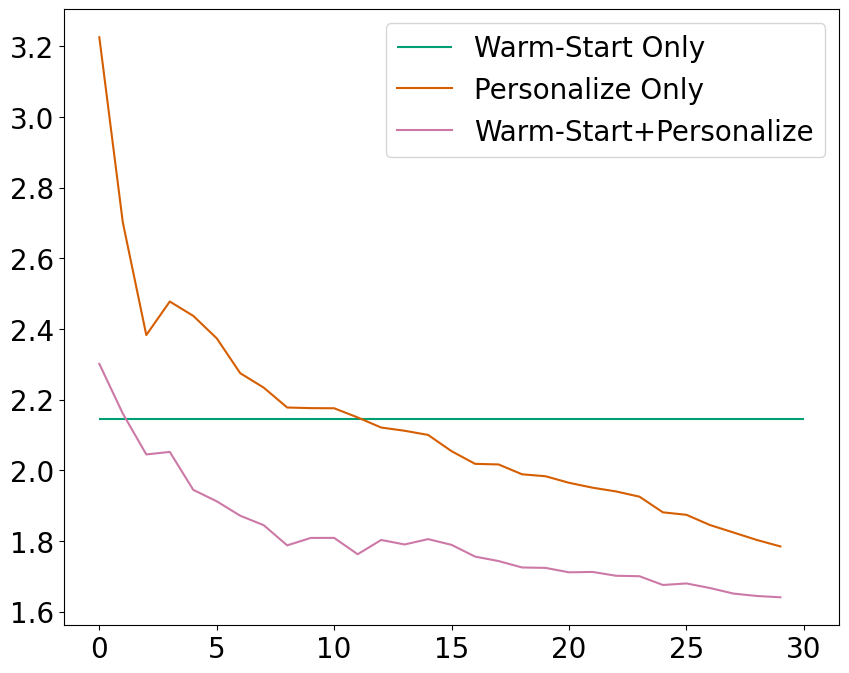

In [ ]:
plt.figure(figsize=(10,8))

plt.hlines([2.144],xmin=0,xmax=30,colors=c3, label="Warm-Start Only")
plt.plot(np.cumsum(list(map(np.mean,zip(*PRs))))/(np.arange(30)+1), color=c5, label="Personalize Only")
plt.plot(np.cumsum(list(map(np.mean,zip(*WSPRs))))/(np.arange(30)+1), color=c7, label="Warm-Start+Personalize")

plt.legend()
plt.show()

In [485]:
import coba as cb

class MyEnvironment:
    def __init__(self, X, Y, g):
        self.interactions = [ {"x": x, "y": y} for x,y in zip(X,Y) ]
        self.params = {'pid': g}
    def read(self):
        return self.interactions

class MyEvaluator:
    def __init__(self, num_threads):
        self.num_threads = num_threads
    def evaluate(self, env: cb.Environment, lrn):
        if self.num_threads: 
            torch.set_num_threads(self.num_threads)
        for row in env.read():
            true_x, true_y = row["x"],row["y"]
            pred_y = lrn.predict(true_x)[0].item()
            lrn.iter_fit(true_x,true_y)
            yield {'pred': pred_y, 'true': true_y}

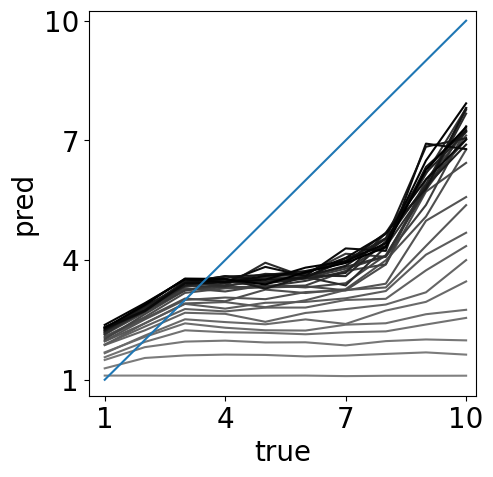

In [ ]:
def make_tasks(X, Y, G):

    X = np.array(X)
    Y = np.array(Y)
    G = np.array(G)

    w = 30
    take = 30
    specs = [20, w, 'l', 'r', w, 'l', 'r', w, 'l', 'r', w, 'l','r', w, 1]
    lrns = [FeedForwardSKR(specs=specs,rng=i,loss=torch.nn.MSELoss()) for i in range(10)]

    for g in set(G):
        X[g==G] = StandardScaler().fit_transform(X[g==G])

    for g in set(G):
        if sum(g==G) < take: continue
        envs = cb.Environments.from_custom(MyEnvironment(X[g==G].tolist(), Y[g==G].tolist(), g)).shuffle(n=30)
        val = MyEvaluator(take,1)

        # uncomment for pretraining
        # lrns = [FeedForwardSKR(specs=specs,rng=i) for i in range(10)]
        # for lrn in lrns: lrn.fit(torch.tensor(X[G != g]).float(), torch.tensor(Y[G != g]).unsqueeze(1).float())

        yield from product(envs, lrns, [val])

result = cb.Experiment(make_tasks(X,Y,G)).run(processes=40,quiet=True)

out = result.interactions.to_pandas().groupby(['index','true'])['pred'].mean().reset_index()
out['true'] += 1
out['pred'] += 1
out.pivot(index='true',columns='index').plot(figsize=(5,5),color=list(map(str,np.linspace(.5,0,30))),legend=False,xlim=[.6,10.25],ylim=[.6,10.25])
plt.plot([1,10],[1,10])
plt.yticks([1,4,7,10])
plt.xticks([1,4,7,10])
plt.ylabel('pred')
plt.show()

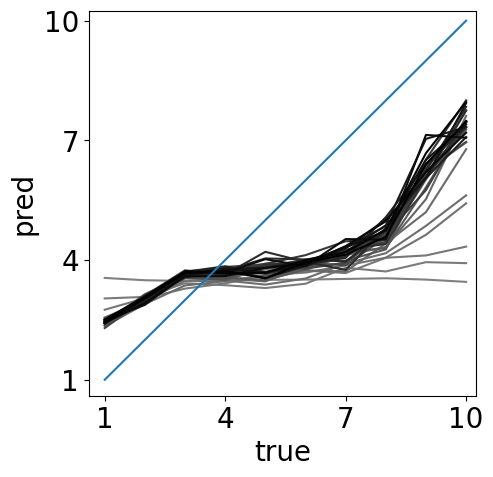

In [ ]:
def make_tasks(X, Y, G):

    X = np.array(X)
    Y = np.array(Y)
    G = np.array(G)

    w = 30
    take = 30
    specs = [20, w, 'l', 'r', w, 'l', 'r', w, 'l', 'r', w, 'l','r', w, 1]
    #lrns = [FeedForwardSKR(specs=specs,rng=i,loss=torch.nn.MSELoss()) for i in range(10)]

    for g in set(G):
        X[g==G] = StandardScaler().fit_transform(X[g==G])

    for g in set(G):    
        if sum(g==G) < take: continue
        envs = cb.Environments.from_custom(MyEnvironment(X[g==G].tolist(), Y[g==G].tolist(), g)).shuffle(n=30)
        val = MyEvaluator(take,1)

        # uncomment for pretraining
        lrns = [FeedForwardSKR(specs=specs,rng=i) for i in range(3)]
        for lrn in lrns: lrn.fit(torch.tensor(X[G != g]).float(), torch.tensor(Y[G != g]).unsqueeze(1).float())

        yield from product(envs, lrns, [val])

result = cb.Experiment(make_tasks(X,Y,G)).run(processes=40,quiet=True)

out = result.interactions.to_pandas().groupby(['index','true'])['pred'].mean().reset_index()
out['true'] += 1
out['pred'] += 1
out.pivot(index='true',columns='index').plot(figsize=(5,5),color=list(map(str,np.linspace(.5,0,30))),legend=False,xlim=[.6,10.25],ylim=[.6,10.25])
plt.plot([1,10],[1,10])
plt.yticks([1,4,7,10])
plt.xticks([1,4,7,10])
plt.ylabel('pred')
plt.show()

pred    Axes(0.125,0.11;0.775x0.77)
dtype: object

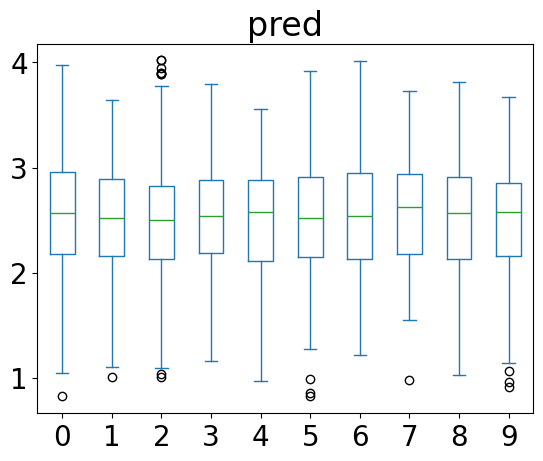

In [ ]:
out = result.interactions.to_pandas()
out[out["index"]==1].plot.box(by="true",column="pred")
#Warm Start

pred    Axes(0.125,0.11;0.775x0.77)
dtype: object

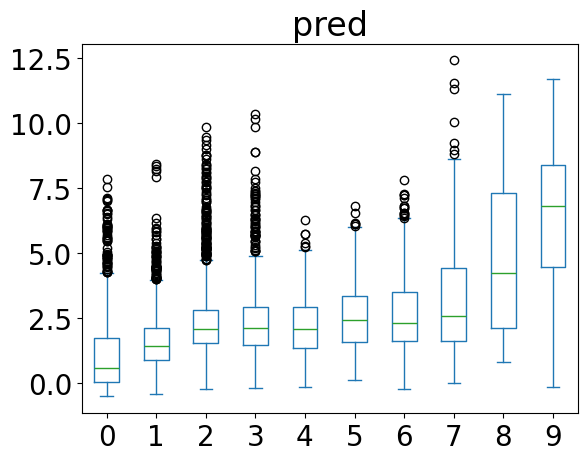

In [ ]:
out = result.interactions.to_pandas()
out[out["index"]==30].plot.box(by="true",column="pred")
#Personalization MEAN ABSOLUTE ERROR

pred    Axes(0.125,0.11;0.775x0.77)
dtype: object

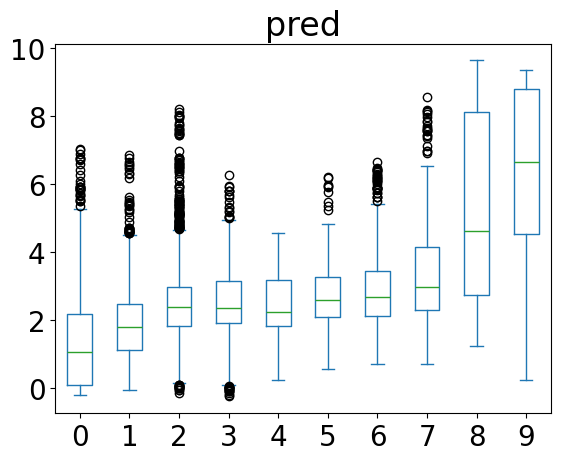

In [ ]:
out = result.interactions.to_pandas()
out[out["index"]==30].plot.box(by="true",column="pred")
#Personalization MEAN SQUARED ERROR

pred    Axes(0.125,0.11;0.775x0.77)
dtype: object

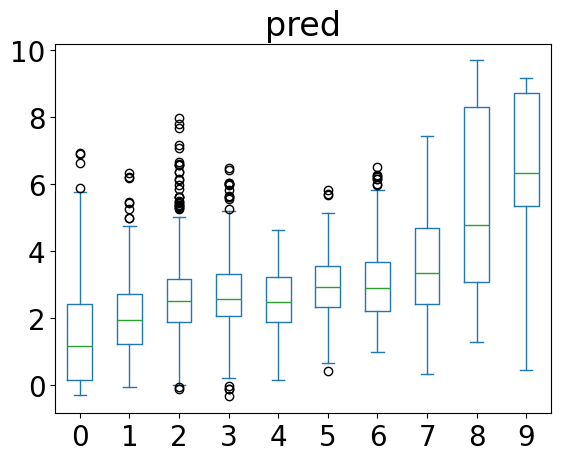

In [ ]:
out = result.interactions.to_pandas()
out[out["index"]==30].plot.box(by="true",column="pred")
#Warm Start + Personalization

err    Axes(0.125,0.11;0.775x0.77)
dtype: object

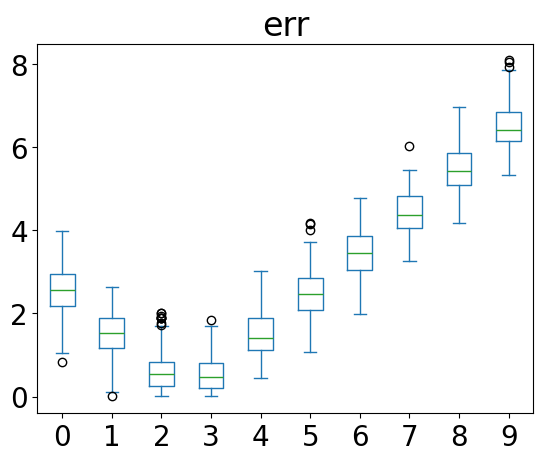

In [ ]:
out = result.interactions.to_pandas()
out["err"] = (out["pred"] - out["true"]).abs()
out[out["index"]==1].plot.box(by="true",column="err")
#Warm Start (errors)

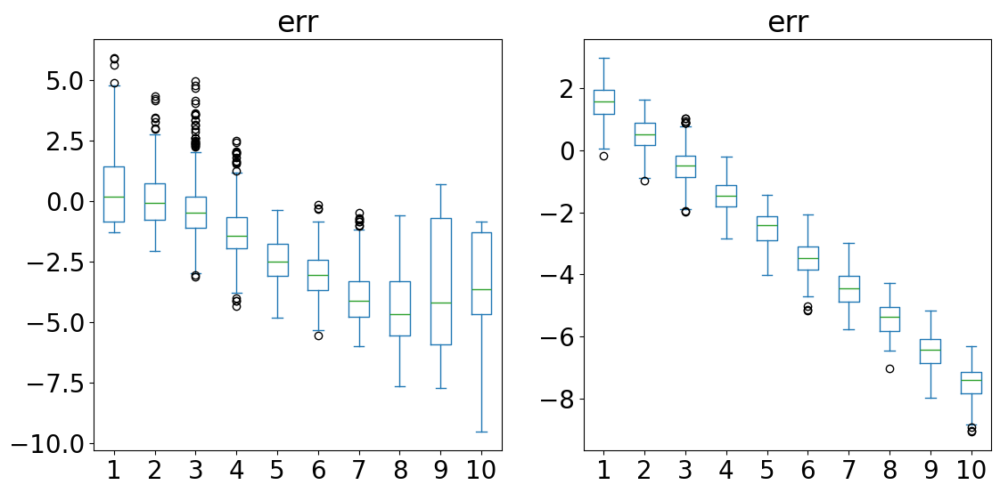

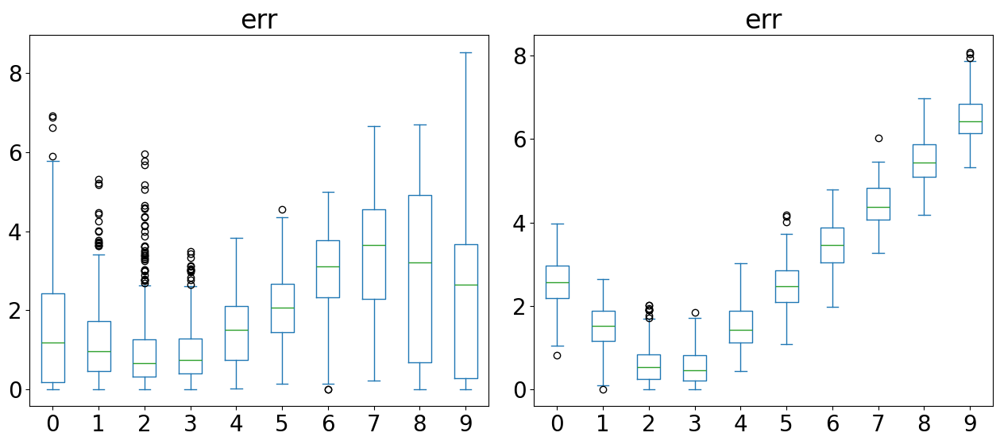

In [ ]:
out = result.interactions.to_pandas()

out["true"] += 1
out["err"] = (out["pred"] - out["true"])
fig,ax = plt.subplots(1,2,figsize=(13,6))
out[out["index"]==30].plot.box(by="true",column="err",ax=ax[0])
out[out["index"]==1].plot.box(by="true",column="err",ax=ax[1])

out = result.interactions.to_pandas()
out["err"] = (out["pred"] - out["true"]).abs()
fig,ax = plt.subplots(1,2,figsize=(13,6))
out[out["index"]==30].plot.box(by="true",column="err",ax=ax[0])
out[out["index"]==1].plot.box(by="true",column="err",ax=ax[1])

plt.tight_layout()
plt.show()

#Warm Start + Personalization (errors)

err    Axes(0.547727,0.11;0.352273x0.77)
dtype: object

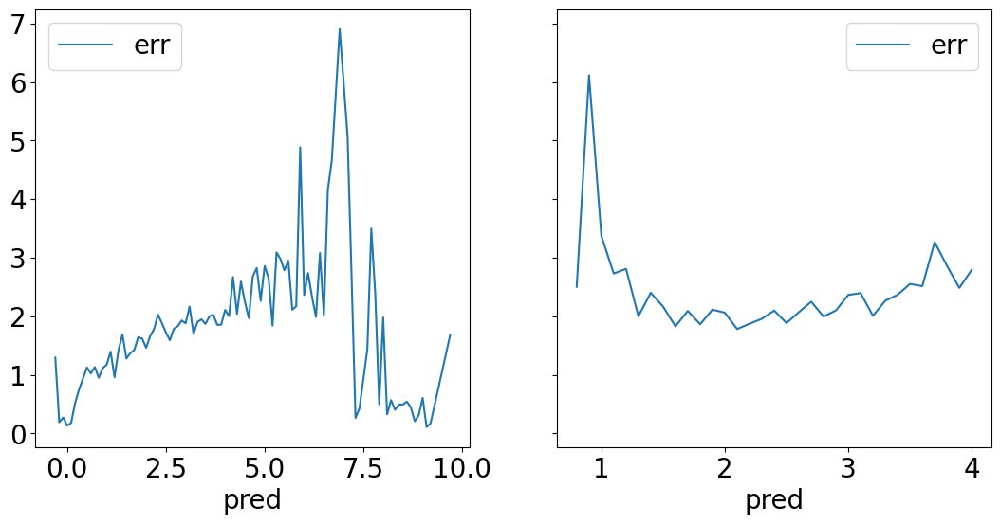

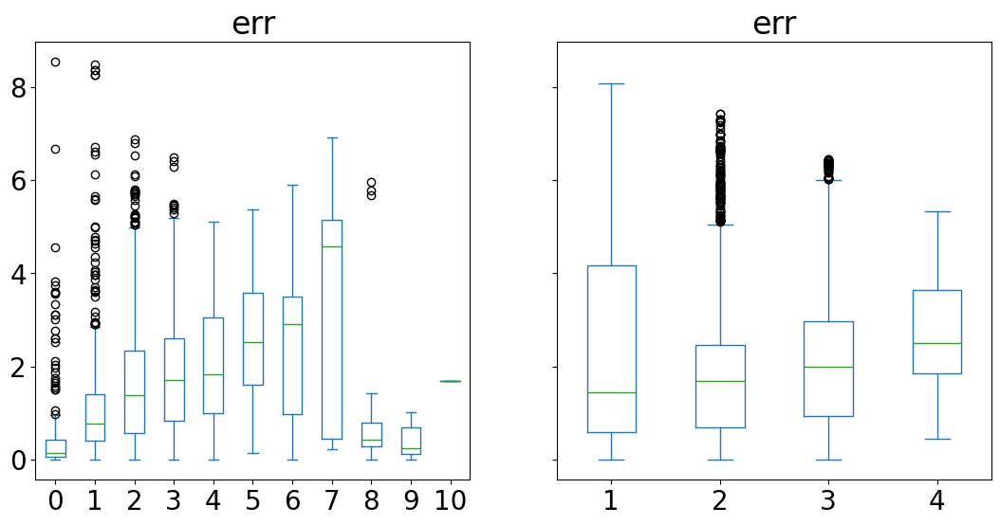

In [ ]:
out = result.interactions.to_pandas()
out["err"] = (out["pred"] - out["true"]).abs()

out["pred"] = out["pred"].round(1)
out = out.groupby(["pred","index"])["err"].mean().reset_index()

fig,ax = plt.subplots(1,2,figsize=(13,6),sharey=True)
out[out["index"]==30].plot(x="pred",y="err",ax=ax[0])
out[out["index"]==1].plot(x="pred",y="err",ax=ax[1])

out = result.interactions.to_pandas()
out["err"] = (out["pred"] - out["true"]).abs()

out["pred"] = out["pred"].round().astype(int)
fig,ax = plt.subplots(1,2,figsize=(13,6),sharey=True)
out[out["index"]==30].plot.box(by="pred",column="err",ax=ax[0])
out[out["index"]==1].plot.box(by="pred",column="err",ax=ax[1])

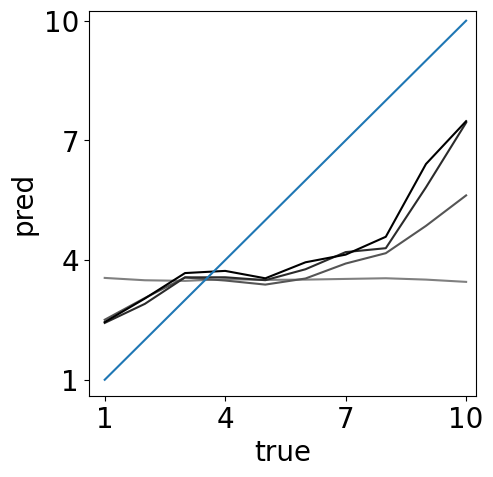

In [ ]:
out = result.interactions.to_pandas().groupby(['index','true'])['pred'].mean().reset_index()
out['true'] += 1
out['pred'] += 1

rng_indexes = [1,5,10,30]
colors = list(map(str,np.linspace(.5,0,len(rng_indexes))))
out = out[out["index"].isin(rng_indexes)]

out.pivot(index='true',columns='index').plot(figsize=(5,5),color=colors,legend=False,xlim=[.6,10.25],ylim=[.6,10.25])

plt.plot([1,10],[1,10])
plt.yticks([1,4,7,10])
plt.xticks([1,4,7,10])
plt.ylabel('pred')
plt.show()

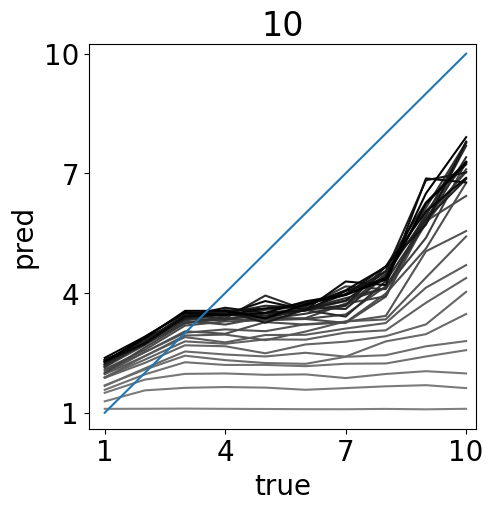

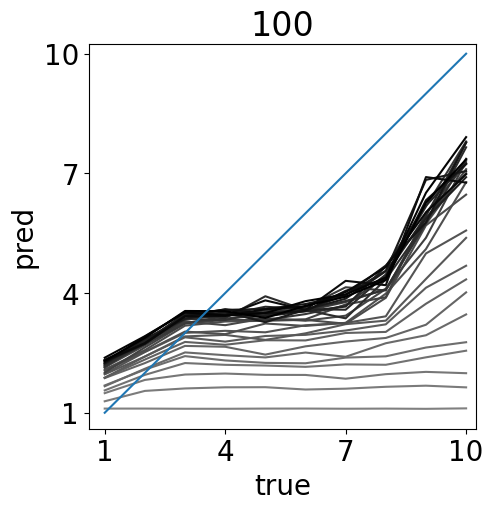

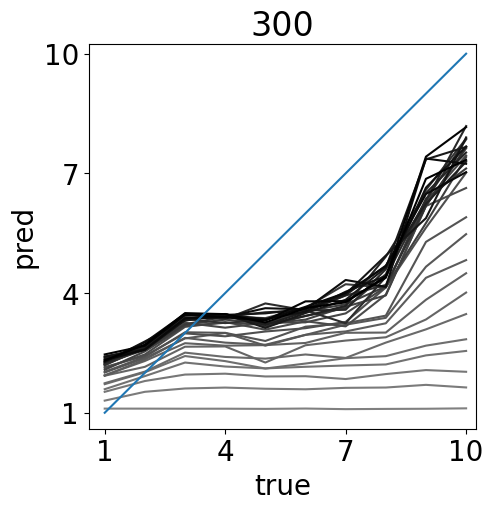

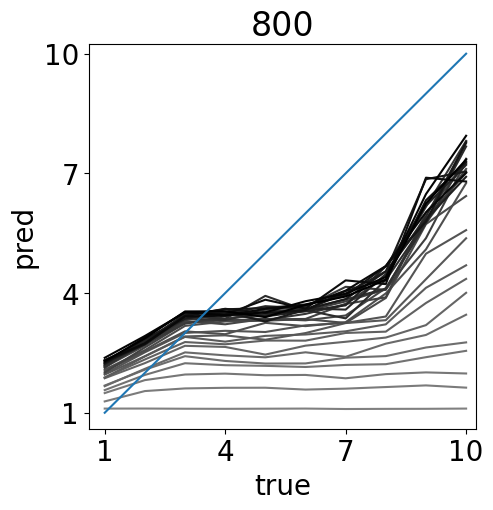

TypeError: 'NoneType' object is not iterable

In [ ]:
def wins(file_path, timestamps, window_len):
    file = open(file_path) if Path(file_path).exists() else nullcontext()
    rows = islice(csv.reader(file),1,None) if Path(file_path).exists() else [] #type: ignore

    with file:
        for timestamp in timestamps:
            window = []
            for row in rows:
                if float(row[0]) < timestamp-window_len: continue
                if float(row[0]) > timestamp: break
                data = map(float,row[1:])
                window.append(next(data) if len(row) == 2 else tuple(data))
            yield window

def accs(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    features = []
    for window in wins(f"../data/phone/{pid}/Accelerometer.csv", timestamps, window_len):
        features.append([0,0,0,1] if not window else [*np.std(window,axis=0),0])
    return features

def lins(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    features = []
    for window in wins(f"../data/phone/{pid}/LinearAcceleration.csv", timestamps, window_len):
        features.append([0,0,0,1] if not window else [*np.std(window,axis=0),0])
    return features

def bats(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    features = []
    for window in wins(f"../data/phone/{pid}/Battery.csv", timestamps, window_len):
        features.append([0,0,1] if not window else [np.mean(window),np.std(window),0])
    return features

def peds(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    features = []
    for window in wins(f"../data/phone/{pid}/Pedometer.csv", timestamps, window_len):
        features.append([0,0,1] if not window else [np.mean(window),np.std(window),0])
    return features

def locs(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    features = []
    for window in wins(f"../data/phone/{pid}/Location.csv", timestamps, window_len):
        #dist = np.linalg.norm(np.diff(window,axis=0),axis=1)
        #np.mean(dist),np.std(dist)
        features.append([0,0,0,1] if not window else [*np.mean(window,axis=0),0])
    return features

def tims(work_item, window_len=None):
    pid,timestamps,tzs = work_item

    features = []
    for timestamp,tz in zip(timestamps,tzs):
        
        if tz == "-04:00":
            timestamp -= 60*60*4
        elif tz == "-05:00":
            timestamp -= 60*60*5
        else:
            print(tz)
            raise Exception()
        time_of_day = (timestamp/(60*60*24)) % 1
        day_of_week = int(timestamp / (60*60*24)) % 7
        features.append([time_of_day,day_of_week])
    return features

def calc_feats(work_item_and_len):
    features = []
    
    for feats in zip(*[f(*work_item_and_len) for f in [locs,peds,bats,lins,accs,tims]]):
        features.append(list(chain.from_iterable(feats)))
    return features

def local():

    can_predict = emotions_df[(emotions_df["WatchDataQuality"] == "Good") & ~emotions_df["ER Interest"].isna()].copy()
    can_predict = can_predict.sort_values(["ParticipantId","SubmissionTimestampUtc"])

    d1 = dict(map(tuple,can_predict.groupby("ParticipantId")["SubmissionTimestampUtc"].apply(list).reset_index().itertuples(index=False)))
    d2 = dict(map(tuple,can_predict.groupby("ParticipantId")["LocalTimeZone"].apply(list).reset_index().itertuples(index=False)))

    work_items = []
    for key in d1.keys():
        work_items.append((key, d1[key], d2[key]))

    Y = (can_predict["ER Interest"]-1).astype(int).tolist()
    G = can_predict["ParticipantId"].tolist()

    for wlen in [10, 100]:
        X = []
        with ProcessPoolExecutor(max_workers=20) as executor:
            X.extend(chain.from_iterable(executor.map(calc_feats, zip(work_items,repeat(wlen)))))

        def make_tasks(X, Y, G):
            X = np.array(X)
            Y = np.array(Y)
            G = np.array(G)

            w = 30
            take = 30
            specs = [20, w, 'l', 'r', w, 'l', 'r', w, 'l', 'r', w, 'l','r', w, 1]
            lrns = [FeedForwardSKR(specs=specs,rng=i) for i in range(10)]

            for g in set(G):
                X[g==G] = StandardScaler().fit_transform(X[g==G])

            for g in set(G):    
                if sum(g==G) < take: continue
                envs = cb.Environments.from_custom(MyEnvironment(X[g==G].tolist(), Y[g==G].tolist(), g)).shuffle(n=30)
                val = MyEvaluator(take,1)

                # uncomment for pretraining
                # lrns = [FeedForwardSKR(specs=specs,rng=i) for i in range(10)]
                # for lrn in lrns: lrn.fit(torch.tensor(X[G != g]).float(), torch.tensor(Y[G != g]).unsqueeze(1).float())

                yield from product(envs, lrns, [val])

        result = cb.Experiment(make_tasks(X,Y,G)).run(processes=40,quiet=True)

        out = result.interactions.to_pandas().groupby(['index','true'])['pred'].mean().reset_index()
        out['true'] += 1
        out['pred'] += 1
        out.pivot(index='true',columns='index').plot(figsize=(5,5),color=list(map(str,np.linspace(.5,0,30))),legend=False,xlim=[.6,10.25],ylim=[.6,10.25])
        plt.plot([1,10],[1,10])
        plt.title(f"{wlen}")
        plt.yticks([1,4,7,10])
        plt.xticks([1,4,7,10])
        plt.ylabel('pred')
        plt.show()

local()

In [487]:
def wins(file_path, timestamps, window_len):
    file = open(file_path) if Path(file_path).exists() else nullcontext()
    rows = islice(csv.reader(file),1,None) if Path(file_path).exists() else [] #type: ignore

    with file:
        for timestamp in timestamps:
            window = []
            for row in rows:
                if float(row[0]) < timestamp-window_len: continue
                if float(row[0]) > timestamp: break
                data = map(float,row[1:])
                window.append(next(data) if len(row) == 2 else tuple(data))
            yield window

def miss(miss, not_miss, n_feat):
    features = []
    for m in miss:
        if m: features.append([0]*n_feat+[1])
        else: features.append(not_miss.pop()+[0])
    return features

def accs(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    features = []
    for window in wins(f"../data/phone/{pid}/Accelerometer.csv", timestamps, window_len):
        pass
    return features

def lins(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/LinearAcceleration.csv", timestamps, window_len):
        missings.append(not w)
        if not w: continue
        vars = np.var(w,axis=0)
        pcts = np.percentile([np.linalg.norm(w,axis=1)],q=[10,50,90])
        features.append([*vars,*pcts])
    if features: features = StandardScaler().fit_transform(features).tolist()
    return miss(missings,features,6)

def bats(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/Battery.csv", timestamps, window_len):
        missings.append(not w)
        if not w: continue
        w = [float(w)/100 for w in w]
        features.append([np.mean(w),np.std(w)])
    return miss(missings,features,2)

def peds(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/Pedometer.csv", timestamps, window_len):
        missings.append(not w)
        if not w: continue
        features.append([np.mean(w),np.std(w)])
    if features: features = StandardScaler().fit_transform(features).tolist()
    return miss(missings,features,2)

def locs(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/Location.csv", timestamps, window_len):
        missings.append(not w)
        if not w: continue
        features.append([*np.mean(w,axis=0),0])
    return miss(missings,features,2)

def tims(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    features = []
    hour = 60*60
    day = 24*hour
    for timestamp,tz in zip(timestamps,tzs):

        if tz == "-04:00":
            timestamp -= 4*hour
        elif tz == "-05:00":
            timestamp -= 5*hour

        time_of_day = (timestamp/day) % 1
        day_of_week = (int(timestamp/day)+4) % 7
        is_weekend = day_of_week in [0,6]
        is_weekday = day_of_week in [1,2,3,4,5]
        features.append([time_of_day,int(is_weekend),int(is_weekday)])
    return features

def nulls(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    return [[0]*4 for t in timestamps]

def calc_feats(work_item_and_len):
    features = []
    for feats in zip(*[f(*work_item_and_len) for f in [tims,peds,bats,lins]]):
        features.append(list(chain.from_iterable(feats)))
    return features

def local():

    can_predict = emotions_df[(emotions_df["WatchDataQuality"] == "Good") & ~emotions_df["ER Interest"].isna()].copy()
    can_predict = can_predict.sort_values(["ParticipantId","SubmissionTimestampUtc"])

    d1 = dict(map(tuple,can_predict.groupby("ParticipantId")["SubmissionTimestampUtc"].apply(list).reset_index().itertuples(index=False)))
    d2 = dict(map(tuple,can_predict.groupby("ParticipantId")["LocalTimeZone"].apply(list).reset_index().itertuples(index=False)))

    work_items = []
    for key in d1.keys():
        work_items.append((key, d1[key], d2[key]))

    Y = (can_predict["ER Interest"]-1).astype(float).to_numpy()
    G = can_predict["ParticipantId"].to_numpy()

    # for g in set(G):
    #     Y[g==G] = RobustScaler().fit_transform(np.expand_dims(Y[g==G],axis=1)).squeeze()

    Y = (Y < 2).astype(int)

    for wlen in [300]:
        X = []
        with ProcessPoolExecutor(max_workers=20) as executor:
            X.extend(chain.from_iterable(executor.map(calc_feats, zip(work_items,repeat(wlen)))))
        #X.extend(chain.from_iterable(map(calc_feats, zip(work_items, repeat(wlen)))))

        def make_envs(X, Y, G):
            X, Y, G = np.array(X), np.array(Y), np.array(G)
            return [MyEnvironment(X[g==G].tolist(), Y[g==G].tolist(), g) for g in set(G)]

        vals = MyEvaluator(1)
        envs = cb.Environments.from_custom(*make_envs(X,Y,G)).take(40, True).shuffle(n=100)  # type: ignore
        lrns = [
            #FeedForwardSKR(specs=[16, 1], rng=1, loss=torch.nn.L1Loss()),
            #FeedForwardSKR(specs=[16, 30, 'l', 'r', 1], rng=1, loss=torch.nn.L1Loss()),
            FeedForwardSKC(specs=[16, 1], rng=1, loss=torch.nn.BCEWithLogitsLoss()),
            FeedForwardSKC(specs=[16, 30, 'l', 'r', 1], rng=1, loss=torch.nn.BCEWithLogitsLoss())
        ]

        return cb.Experiment(envs,lrns,vals).run(processes=40, quiet=True) # type: ignore

result = local()

out = result.where(index=30)
out = pd.merge(pd.merge(out.environments.to_pandas(),out.interactions.to_pandas()),out.learners.to_pandas())
out = out.groupby(['pid','specs','true'])['pred'].mean().reset_index()
out = out.groupby(['specs','true'])['pred'].mean().reset_index()

out.pivot(index='true',columns='specs',values='pred').plot(figsize=(10,5),legend=True)
#out['true'] += 1
#out['pred'] += 1
out.pivot(index='true',columns='specs',values='pred').plot(figsize=(10,5),legend=True)
#plt.plot([1,10],[1,10])
plt.show()

2025-04-13 11:30:50 -- pid-3677037 -- Unexpected exception:

  File "/home/mrucker/Projects/coba/coba/experiments/process.py", line 179, in filter
    yield ["T4", (env_id, lrn_id, val_id), list(SafeEvaluator(val).evaluate(env,lrn))]
  File "/tmp/ipykernel_3050492/1619492478.py", line 18, in evaluate
    <unknown code, this is likely due to the code being in a Jupyter cell>
  File "/tmp/ipykernel_3050492/2019946071.py", line 279, in predict
    <unknown code, this is likely due to the code being in a Jupyter cell>

  IndexError: Dimension out of range (expected to be in range of [-1, 0], but got 1)

2025-04-13 11:30:50 -- pid-3677037 -- Unexpected exception:

  File "/home/mrucker/Projects/coba/coba/experiments/process.py", line 179, in filter
    yield ["T4", (env_id, lrn_id, val_id), list(SafeEvaluator(val).evaluate(env,lrn))]
  File "/tmp/ipykernel_3050492/1619492478.py", line 18, in evaluate
    <unknown code, this is likely due to the code being in a Jupyter cell>
  File "/tmp/ipy

KeyError: 'true'

In [480]:
((can_predict["ER Interest"]-1).astype(float).to_numpy() < 2).sum()

957

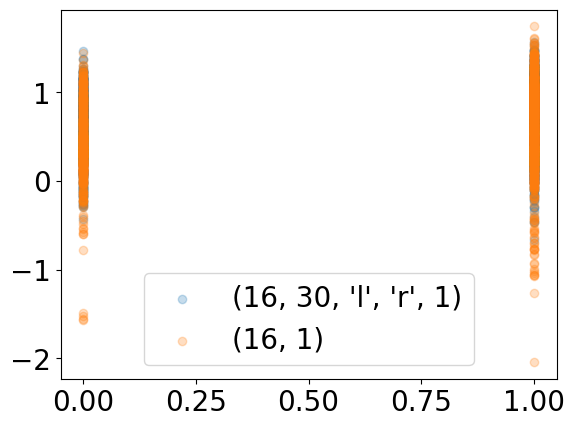

In [473]:
out = result.where(index=30)
out = pd.merge(pd.merge(out.environments.to_pandas(),out.interactions.to_pandas()),out.learners.to_pandas())

for s in set(out["specs"]):
    _out = out[out["specs"]==s]
    plt.scatter(_out["true"],_out["pred"],alpha=.25,label=s)
plt.legend()
plt.show()

In [10]:
def wins(file_path, timestamps, window_len):
    file = open(file_path) if Path(file_path).exists() else nullcontext()
    rows = islice(csv.reader(file),1,None) if Path(file_path).exists() else [] #type: ignore

    with file:
        for timestamp in timestamps:
            window = []
            for row in rows:
                if float(row[0]) < timestamp-window_len: continue
                if float(row[0]) > timestamp: break
                data = map(float,row[1:])
                window.append(next(data) if len(row) == 2 else tuple(data))
            yield window

def miss(miss, not_miss, n_feat):
    features = []
    for m in miss:
        if m: features.append([0]*n_feat+[1])
        else: features.append(not_miss.pop()+[0])
    return features

def accs(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    features = []
    for window in wins(f"../data/phone/{pid}/Accelerometer.csv", timestamps, window_len):
        pass
    return features

def lins(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/LinearAcceleration.csv", timestamps, window_len or 100):
        missings.append(not w)
        if not w: continue
        vars = np.var(w,axis=0)
        pcts = np.percentile([np.linalg.norm(w,axis=1)],q=[10,50,90])
        features.append([*vars,*pcts])
    if features: features = StandardScaler().fit_transform(features).tolist()
    return miss(missings,features,6)

def bats(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/Battery.csv", timestamps, window_len):
        missings.append(not w)
        if not w: continue
        w = [float(w)/100 for w in w]
        features.append([np.mean(w),np.std(w)])
    return miss(missings,features,2)

def peds(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/Pedometer.csv", timestamps, window_len):
        missings.append(not w)
        if not w: continue
        features.append([np.mean(w),np.std(w)])
    if features: features = StandardScaler().fit_transform(features).tolist()
    return miss(missings,features,2)

def locs1(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/Location.csv", timestamps, window_len or 600):
        missings.append(not w)
        if not w: continue
        features.append([*np.mean(w,axis=0)[1:]])
    
    if features: features = TheoryGridCellSpatialRelationEncoder(2,frequency_num=n_freq,max_radius=lmax,min_radius=lmin).make_input_embeds(features)
    return miss(missings,features,n_freq*6)

def locs2(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/Location.csv", timestamps, window_len):
        missings.append(not w)
        if not w: continue
        features.append([*np.mean(w,axis=0)[1:]])
    
    return miss(missings,features,2)

def tims(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    features = []
    hour = 60*60
    day = 24*hour
    for timestamp,tz in zip(timestamps,tzs):

        if tz == "-04:00":
            timestamp -= 4*hour
        elif tz == "-05:00":
            timestamp -= 5*hour

        time_of_day = (timestamp/day) % 1
        day_of_week = (int(timestamp/day)+4) % 7
        is_weekend = day_of_week in [0,6]
        is_weekday = day_of_week in [1,2,3,4,5]
        features.append([time_of_day,int(is_weekend),int(is_weekday)])
    return features

def nulls(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    return [[0]*4 for t in timestamps]

def calc_feats(work_item_and_len):
    features = []
    #for feats in zip(*[f(*work_item_and_len) for f in [tims,peds,bats,lins]]):
    #for feats in zip(*[f(*work_item_and_len) for f in [tims,lins]]):
    for feats in zip(*[f(*work_item_and_len) for f in [locs1,lins,tims]]):
        features.append(list(chain.from_iterable(feats)))
    return features

can_predict = emotions_df[(emotions_df["WatchDataQuality"] == "Good") & ~emotions_df["ER Interest"].isna()].copy()
can_predict = can_predict.sort_values(["ParticipantId","SubmissionTimestampUtc"])

d1 = dict(map(tuple,can_predict.groupby("ParticipantId")["SubmissionTimestampUtc"].apply(list).reset_index().itertuples(index=False)))
d2 = dict(map(tuple,can_predict.groupby("ParticipantId")["LocalTimeZone"].apply(list).reset_index().itertuples(index=False)))

work_items = []
for key in d1.keys():
    work_items.append((key, d1[key], d2[key]))


Y = (can_predict["ER Interest"]-1).astype(float).to_numpy()

n_freq = 2
lmin = 10
lmax = 100
wlen = None

#wlen = 100 is best for lins
#wlen = 600 is best for locs1

X = []
with ProcessPoolExecutor(max_workers=20) as executor:
    X.extend(chain.from_iterable(executor.map(calc_feats, zip(work_items,repeat(wlen)))))

print(len(X[0]))

cv    = StratifiedKFold(n_splits=20, shuffle=True, random_state=1)
model = FeedForwardSKC(specs=[len(X[0]), 10, 'l', 'r', 10, 'l', 'r', 1], trn_size=.95, rng=1, loss=torch.nn.BCEWithLogitsLoss())
preds = cross_val_predict(model, X, Y, cv=cv, n_jobs=3)[:,0]

#model = RandomForestClassifier(max_depth=7)
#preds = cross_val_predict(model, X, Y, cv=cv, n_jobs=3)

pd.DataFrame({'pred':preds, "true": Y}).groupby("true")["pred"].mean()

df = pd.DataFrame({'scores':torch.sigmoid(torch.tensor(preds)), "labels": Y})

f,ax = plt.subplots(nrows=1,ncols=2,figsize=(20,10))
acc_plot(df,"Best Classifier",ax[0])
roc_plot(df,"Best Classifier",ax[1])
plt.tight_layout()

23


KeyboardInterrupt: 

In [11]:
len(X[0])

23

In [521]:
torch.sigmoid(torch.tensor(preds))

tensor([[0.5287],
        [0.4607],
        [0.3447],
        ...,
        [0.4538],
        [0.4170],
        [0.5278]])

In [193]:
from pathlib import Path
from collections import defaultdict, Counter
from itertools import islice, chain, count, product, repeat
from contextlib import nullcontext

import coba as cb

import warnings

import time
import csv
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.base import BaseEstimator
from sklearn.preprocessing import RobustScaler, QuantileTransformer, MinMaxScaler, StandardScaler
from sklearn.feature_selection import  mutual_info_classif, f_classif, GenericUnivariateSelect
from sklearn.model_selection import cross_validate, cross_val_predict, StratifiedKFold, GridSearchCV, LeaveOneGroupOut, StratifiedShuffleSplit
from sklearn.metrics import balanced_accuracy_score, mean_squared_error, mean_absolute_error
from sklearn.pipeline import Pipeline

import torch
from parameterfree import COCOB

from sklearn.dummy import DummyRegressor, DummyClassifier
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from xgboost import XGBClassifier

from concurrent.futures import ProcessPoolExecutor

import torch
import torch.utils
import torch.utils.data
import coba as cb
from typing import Tuple, Optional

try:
    torch.set_num_threads(3)
    torch.set_num_interop_threads(3)
except RuntimeError:
    pass

c0 = "#444"
c1 = "#0072B2"
c2 = "#E69F00"
c3 = "#009E73"
c4 = "#56B4E9"
c5 = "#D55E00"
c6 = "#F0E442"
c7 = "#CC79A7"
c8 = "#000000"
c9 = "#332288"

torch.set_default_device('cpu')
plt.rc('font', **{'size': 20})

def add_day_columns(df, timestamp_col, participant_df):
    return add_rel_day(add_start_day(add_day(df, timestamp_col), participant_df))

def add_day(df, timestamp_col):
    df = df.copy()
    df["Day"] = (df[timestamp_col]/(60*60*24)).apply(np.floor)
    return df

def add_start_day(df, participant_df):
    participant_df = participant_df.copy()
    participant_df["StartDay"] = (participant_df["DataStartStampUtc"]/(60*60*24)).apply(np.floor)
    return pd.merge(df, participant_df[['ParticipantId',"StartDay"]])

def add_rel_day(df):
    df = df.copy()
    df["RelDay"] = df["Day"]-df["StartDay"]
    return df

def scale(df, group_col, scale_col, scaler, postfix):
    for gid in set(df[group_col]):
        df.loc[df[group_col]==gid,[scale_col+postfix]] = scaler.fit_transform(df.loc[df[group_col]==gid,[scale_col]])

def drop_all1_ends(df):

    drop = df.copy()
    keep = df.copy()
    
    drop = drop[drop["State Anxiety"]!= 1]
    drop = drop.groupby("ParticipantId")["RelDay"].max().reset_index()
    drop = drop.rename(columns={"RelDay":"Last Day With Anxiety > 1"})
    drop = drop[drop["Last Day With Anxiety > 1"] <= 8 ]

    for pid,day in drop.itertuples(index=False):
        is_not_pid = keep["ParticipantId"] != pid
        is_lt_day  = keep["RelDay"] < day
        keep = keep[is_not_pid | is_lt_day]

    return keep

def get_trimmed_pids(df):
    df = df.copy()
    df = df[~df["ER Interest"].isna()]
    df = df.groupby(["ParticipantId","RelDay"]).size().reset_index(drop=False)
    df = df.groupby(['ParticipantId']).size().reset_index(drop=False).rename(columns={0:"Count"})
    return df.loc[df.Count < 6,'ParticipantId'].tolist()

runs_df = pd.read_csv('../data/Runs.csv')
states_df = pd.read_csv('../data/States.csv')
emotions_df = pd.read_csv('../data/Emotions.csv')
participant_df = pd.read_csv('../data/Participants.csv')

emotions_df = emotions_df[emotions_df["WatchDataQuality"] == "Good"]

emotions_df["ER Interest"] = pd.to_numeric(emotions_df["ER Interest"], errors='coerce')
emotions_df["Phone ER Interest"] = pd.to_numeric(emotions_df["Phone ER Interest"], errors='coerce')
emotions_df["Response Time (min)"] = (emotions_df["SubmissionTimestampUtc"] - emotions_df["DeliveredTimestampUtc"])/60

runs_df = add_day_columns(runs_df, "DeliveredTimestampUtc", participant_df)
states_df = add_day_columns(states_df, "TimestampUtc", participant_df)
emotions_df = add_day_columns(emotions_df, "OpenedTimestampUtc", participant_df)

to_trim = get_trimmed_pids(emotions_df)

runs_df = runs_df[~runs_df["ParticipantId"].isin(to_trim)]
states_df = states_df[~states_df["ParticipantId"].isin(to_trim)]
emotions_df = emotions_df[~emotions_df["ParticipantId"].isin(to_trim)]

runs_df = runs_df[runs_df["RelDay"] < 11]
states_df = states_df[states_df["RelDay"] < 11]
emotions_df = emotions_df[emotions_df["RelDay"] < 11]

emotions_df = drop_all1_ends(emotions_df)

def balanced_accuracy_scores(y_true,y_scores):
    from operator import itemgetter
    from itertools import groupby

    nclass = len(set(y_true))
    n0,n1  = len(y_true)-sum(y_true),sum(y_true)
    c0,c1  = 0,n1
    n0,n1  = (n0*nclass or 1), (n1*nclass or 1)

    yield (0,(c0/(n0 or 1)+c1/(n1 or 1)))

    for t,g in groupby(sorted(zip(y_scores,y_true)),key=itemgetter(0)):
        ls = list(map(itemgetter(1),g))
        c0 += len(ls)-sum(ls)
        c1 -= sum(ls)
        yield (t,(c0/n0+c1/n1))

def roc_plot(row,name=None,ax=None):
    from sklearn.metrics import RocCurveDisplay
    lbl = row['labels'].tolist()
    scr = row['scores'].tolist()
    RocCurveDisplay.from_predictions(lbl,scr,name=name,plot_chance_level=True,ax=ax).ax_.set(xlabel="FPR", ylabel="TPR")

def acc_plot(row,name=None,ax=None):
    import numpy as np
    from matplotlib import pyplot as plt
    from matplotlib import ticker as mtick
    from matplotlib import transforms as mtrans
    from sklearn.metrics import balanced_accuracy_score

    lbl = row['labels'].tolist()
    scr = row['scores'].tolist()

    X,Y = zip(*balanced_accuracy_scores(lbl,scr))
    z = max(Y)

    ax = ax or plt.figure(figsize=(4.6,4.6)).gca()
    ax.plot(X,Y,label=f"{name} (BAC = {z*100:.2f}%)")
    ax.set_ylabel("Balanced Accuracy")
    ax.set_xlabel("Label Threshold")
    ax.set_aspect((max(X)-min(X))/(max(Y)-min(Y)))
    ax.yaxis.set_major_formatter(mtick.PercentFormatter(1))

    ax.axhline(z,alpha=.5)
    trans = mtrans.blended_transform_factory(ax.transAxes,ax.transData)
    ax.annotate(f'{z*100:.2f}%', xy=(1.01, z), xycoords=trans, clip_on=False, va='center')

    if name: ax.legend()

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """
        torch.manual_seed(rng)
        
        def make_layer(curr_dim,spec) -> Tuple[Optional[torch.nn.Module],int]:
            if isinstance(spec,float):
                return torch.nn.Dropout(spec), curr_dim
            if curr_dim is None and isinstance(spec,int):
                return None, spec
            if isinstance(spec,int):
                return torch.nn.Linear(curr_dim,spec),spec
            if spec == 'r':
                return torch.nn.ReLU(),curr_dim
            if spec == 'l':
                return torch.nn.LayerNorm(curr_dim),curr_dim
            if spec == 'b':
                return torch.nn.BatchNorm1d(curr_dim), curr_dim
            if spec == 's':
                return torch.nn.Sigmoid(),curr_dim
            if isinstance(spec,list):                
                return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
            raise Exception("Bad Layer")

        layers,width = [],None
        for spec in specs:
            layer,width = make_layer(width,spec)
            if layer: layers.append(layer)

        super().__init__(*layers)

class MyEnvironment:
    def __init__(self, X, Y, g):
        self.interactions = [ {"x": x, "y": [y]} for x,y in zip(X,Y) ]
        self.params = {'pid': g}
    def read(self):
        return self.interactions

class MyEvaluator:
    def __init__(self, num_threads):
        self.num_threads =num_threads
    def evaluate(self, env: cb.Environment, lrn):
        if self.num_threads: torch.set_num_threads(self.num_threads)
        for row in env.read():
            true_x = row["x"]
            true_y = row["y"]
            pred_y = lrn.predict(true_x)[0].item()
            yield {'pred': pred_y, 'true': true_y }
            lrn.iter_fit(true_x,true_y)

def _cal_freq_list(freq_init, frequency_num, max_radius, min_radius):
    if freq_init == "random":
        # the frequence we use for each block, alpha in ICLR paper
        # freq_list shape: (frequency_num)
        freq_list = np.random.random(size=[frequency_num]) * max_radius
    elif freq_init == "geometric":
        # freq_list = []
        # for cur_freq in range(frequency_num):
        #     base = 1.0/(np.power(max_radius, cur_freq*1.0/(frequency_num-1)))
        #     freq_list.append(base)

        # freq_list = np.asarray(freq_list)

        log_timescale_increment = (np.log(float(max_radius) / float(min_radius)) /
          (frequency_num*1.0 - 1))

        timescales = min_radius * np.exp(
            np.arange(frequency_num).astype(float) * log_timescale_increment)

        freq_list = 1.0/timescales

    return freq_list

class TheoryGridCellSpatialRelationEncoder(torch.nn.Module):
    """
    Given a list of (deltaX,deltaY), encode them using the position encoding function

    """
    def __init__(self, spa_embed_dim, coord_dim = 2, frequency_num = 16, 
        max_radius = 10000,  min_radius = 1000, freq_init = "geometric", ffn = None):
        """
        Args:
            spa_embed_dim: the output spatial relation embedding dimention
            coord_dim: the dimention of space, 2D, 3D, or other
            frequency_num: the number of different sinusoidal with different frequencies/wavelengths
            max_radius: the largest context radius this model can handle
        """
        super(TheoryGridCellSpatialRelationEncoder, self).__init__()
        self.frequency_num = frequency_num
        self.coord_dim = coord_dim 
        self.max_radius = max_radius
        self.min_radius = min_radius
        self.spa_embed_dim = spa_embed_dim
        self.freq_init = freq_init

        # the frequence we use for each block, alpha in ICLR paper
        self.cal_freq_list()
        self.cal_freq_mat()

        # there unit vectors which is 120 degree apart from each other
        self.unit_vec1 = np.asarray([1.0, 0.0])                        # 0
        self.unit_vec2 = np.asarray([-1.0/2.0, np.sqrt(3)/2.0])      # 120 degree
        self.unit_vec3 = np.asarray([-1.0/2.0, -np.sqrt(3)/2.0])     # 240 degree

        self.input_embed_dim = self.cal_input_dim()

        self.ffn = ffn
        
    def cal_freq_list(self):
        self.freq_list = _cal_freq_list(self.freq_init, self.frequency_num, self.max_radius, self.min_radius)

    def cal_freq_mat(self):
        # freq_mat shape: (frequency_num, 1)
        freq_mat = np.expand_dims(self.freq_list, axis = 1)
        # self.freq_mat shape: (frequency_num, 6)
        self.freq_mat = np.repeat(freq_mat, 6, axis = 1)

    def cal_input_dim(self):
        # compute the dimention of the encoded spatial relation embedding
        return int(6 * self.frequency_num)


    def make_input_embeds(self, coords):
        if type(coords) == np.ndarray:
            assert self.coord_dim == np.shape(coords)[2]
            coords = list(coords)
        elif type(coords) == list:
            coords = [[c] for c in coords]
            assert self.coord_dim == len(coords[0][0])
        else:
            raise Exception("Unknown coords data type for GridCellSpatialRelationEncoder")

        
        # (batch_size, num_context_pt, coord_dim)
        coords_mat = np.asarray(coords).astype(float)
        batch_size = coords_mat.shape[0]
        num_context_pt = coords_mat.shape[1]

        # compute the dot product between [deltaX, deltaY] and each unit_vec 
        # (batch_size, num_context_pt, 1)
        angle_mat1 = np.expand_dims(np.matmul(coords_mat, self.unit_vec1), axis = -1)
        # (batch_size, num_context_pt, 1)
        angle_mat2 = np.expand_dims(np.matmul(coords_mat, self.unit_vec2), axis = -1)
        # (batch_size, num_context_pt, 1)
        angle_mat3 = np.expand_dims(np.matmul(coords_mat, self.unit_vec3), axis = -1)

        # (batch_size, num_context_pt, 6)
        angle_mat = np.concatenate([angle_mat1, angle_mat1, angle_mat2, angle_mat2, angle_mat3, angle_mat3], axis = -1)
        # (batch_size, num_context_pt, 1, 6)
        angle_mat = np.expand_dims(angle_mat, axis = -2)
        # (batch_size, num_context_pt, frequency_num, 6)
        angle_mat = np.repeat(angle_mat, self.frequency_num, axis = -2)
        # (batch_size, num_context_pt, frequency_num, 6)
        angle_mat = angle_mat * self.freq_mat
        # (batch_size, num_context_pt, frequency_num*6)
        spr_embeds = np.reshape(angle_mat, (batch_size, num_context_pt, -1))

        # make sinuniod function
        # sin for 2i, cos for 2i+1
        # spr_embeds: (batch_size, num_context_pt, frequency_num*6=input_embed_dim)
        spr_embeds[:, :, 0::2] = np.sin(spr_embeds[:, :, 0::2])  # dim 2i
        spr_embeds[:, :, 1::2] = np.cos(spr_embeds[:, :, 1::2])  # dim 2i+1
        
        return spr_embeds.squeeze().tolist()
        
    def forward(self, coords):
        """
        Given a list of coords (deltaX, deltaY), give their spatial relation embedding
        Args:
            coords: a python list with shape (batch_size, num_context_pt, coord_dim)
        Return:
            sprenc: Tensor shape (batch_size, num_context_pt, spa_embed_dim)
        """
        spr_embeds = self.make_input_embeds(coords)

        # spr_embeds: (batch_size, num_context_pt, input_embed_dim)
        spr_embeds = torch.FloatTensor(spr_embeds) 

        if self.ffn is not None:
            return self.ffn(spr_embeds)
        else:
            return spr_embeds

def wins(file_path, timestamps, window_len):
    file = open(file_path) if Path(file_path).exists() else nullcontext()
    rows = islice(csv.reader(file),1,None) if Path(file_path).exists() else [] #type: ignore

    with file:
        for timestamp in timestamps:
            window = []
            for row in rows:
                if float(row[0]) < timestamp-window_len: continue
                if float(row[0]) > timestamp: break
                data = map(float,row[1:])
                window.append(next(data) if len(row) == 2 else tuple(data))
            yield window

def miss(miss, not_miss, n_feat):
    features = []
    for m in miss:
        if m: features.append([0]*n_feat+[1])
        else: features.append(not_miss.pop()+[0])
    return features

def lins(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/LinearAcceleration.csv", timestamps, window_len or 100):
        missings.append(not w)
        if not w: continue
        vars = np.var(w,axis=0)
        pcts = np.percentile([np.linalg.norm(w,axis=1)],q=[10,50,90])
        features.append([*vars,*pcts])
    if features: features = StandardScaler().fit_transform(features).tolist()
    return miss(missings,features,6)

def bats(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/Battery.csv", timestamps, window_len or 600):
        missings.append(not w)
        if not w: continue
        w = [float(w)/100 for w in w]
        features.append([np.mean(w),np.std(w)])
    return miss(missings,features,2)

def peds(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/Pedometer.csv", timestamps, window_len or 100):
        missings.append(not w)
        if not w: continue
        features.append([np.mean(w),np.std(w)])
    if features: features = StandardScaler().fit_transform(features).tolist()
    return miss(missings,features,2)

def locs1(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/Location.csv", timestamps, window_len or 600):
        missings.append(not w)
        if not w: continue
        features.append([*np.mean(w,axis=0)[1:]])
    
    if features: features = TheoryGridCellSpatialRelationEncoder(2,frequency_num=n_freq,max_radius=lmax,min_radius=lmin).make_input_embeds(features)
    return miss(missings,features,n_freq*6)

def locs2(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/Location.csv", timestamps, window_len):
        missings.append(not w)
        if not w: continue
        features.append([*np.mean(w,axis=0)[1:]])
    
    return miss(missings,features,2)

def tims(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    features = []
    hour = 60*60
    day = 24*hour
    for timestamp,tz in zip(timestamps,tzs):

        if tz == "-04:00":
            timestamp -= 4*hour
        elif tz == "-05:00":
            timestamp -= 5*hour

        time_of_day = (timestamp/day) % 1
        day_of_week = (int(timestamp/day)+4) % 7
        is_weekend = day_of_week in [0,6]
        is_weekday = day_of_week in [1,2,3,4,5]
        features.append([time_of_day,int(is_weekend),int(is_weekday)])
    return features

def nulls(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    return [[0]*4 for t in timestamps]

def calc_feats(work_item_and_len):
    features = []
    #for feats in zip(*[f(*work_item_and_len) for f in [tims,peds,bats,lins]]):
    #for feats in zip(*[f(*work_item_and_len) for f in [tims,lins]]):
    for feats in zip(*[f(*work_item_and_len) for f in [locs1,lins,tims,bats,peds]]):
        features.append(list(chain.from_iterable(feats)))
    return features

can_predict = emotions_df[(emotions_df["WatchDataQuality"] == "Good") & ~emotions_df["ER Interest"].isna()].copy()
can_predict = can_predict.sort_values(["ParticipantId","SubmissionTimestampUtc"])

d1 = dict(map(tuple,can_predict.groupby("ParticipantId")["SubmissionTimestampUtc"].apply(list).reset_index().itertuples(index=False)))
d2 = dict(map(tuple,can_predict.groupby("ParticipantId")["LocalTimeZone"].apply(list).reset_index().itertuples(index=False)))

work_items = []
for key in d1.keys():
    work_items.append((key, d1[key], d2[key]))

class FeedForwardSKC2(BaseEstimator):
    def __init__(self, specs = None, trn_size = .5, stop = 4, rng = 1, loss=None):
        self.specs = specs
        self.trn_size = trn_size
        self.fhat = None
        self.opt  = None
        self.body = None
        self.head = None
        self.loss = loss or torch.nn.CrossEntropyLoss()
        self.stop = stop
        self.rng  = rng

    def get_params(self, deep=True):
        return {"specs": self.specs, "trn_size": self.trn_size, "stop": self.stop, "rng": self.rng, "loss": self.loss}

    def set_params(self,**params):
        return FeedForwardSKC(**{**self.get_params(), **params})

    @property
    def params(self):
        return self.get_params()

    def last_int(self,specs):
        specs = list(specs)
        while len(specs) > 0:
            i = specs.pop()
            if isinstance(i,int):
                return i
        raise Exception("No integer found")

    def make_models(self):
        self.body_out = self.last_int(self.specs[:-1])
        self.body = self.body or FeedForward(self.specs[:-1], self.rng)
        self.head = self.head or FeedForward([self.body_out, self.specs[-1]])
        self.fhat = torch.nn.Sequential(self.body,self.head)

    def fit(self,X,Y):
        torch.set_num_threads(1)
        self.make_models()
        ssl_head = FeedForward([self.body_out,1])
        ssl_opt  = COCOB(self.body.parameters())
        opt      = COCOB(self.fhat.parameters())

        if not torch.is_tensor(X): X = torch.tensor(X).float()
        if not torch.is_tensor(Y): Y = torch.tensor(Y).float()

        torch.manual_seed(self.rng)

        SSLX,SSLY = [],[]
        by_class  = { i: X[Y==i] for i in range(10)}

        for x,y in zip(X,Y):
            y = y.squeeze().int().item()

            # while y == (n := (torch.rand(1)*10).squeeze().int().item()): pass
            # nx = by_class[n][(torch.rand(1)*len(by_class[n])).squeeze().int().item()] #type: ignore
            # px = by_class[y][(torch.rand(1)*len(by_class[y])).squeeze().int().item()] #type: ignore
            # SSLX.append(torch.concat([x,nx]).tolist())
            # SSLY.append(0)
            # SSLX.append(torch.concat([x,px]).tolist())
            # SSLY.append(1)

            for i in range(10):
                ix = by_class[i][(torch.rand(1)*len(by_class[i])).squeeze().int().item()] #type: ignore
                SSLX.append(torch.concat([x,ix]).tolist())
                SSLY.append(int(i!=y))

        SSLX = torch.tensor(SSLX)
        SSLY = torch.tensor(SSLY).unsqueeze(1).float()

        ssltrn,sslval = next(StratifiedShuffleSplit(1, train_size=.99, random_state=self.rng).split(SSLX,SSLY))

        ssltrn_X = SSLX[ssltrn]
        ssltrn_y = SSLY[ssltrn]
        sslval_X = SSLX[sslval]
        sslval_y = SSLY[sslval]

        torch_dataset = torch.utils.data.TensorDataset(ssltrn_X,ssltrn_y)
        torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=64,drop_last=True,shuffle=True)
        loss = torch.nn.BCEWithLogitsLoss()

        trn_losses = []
        val_losses = []

        fhat = lambda x: (self.body(x[:,:self.specs[0]])-self.body(x[:,self.specs[0]:])).abs().sum(dim=1).unsqueeze(1)

        with torch.no_grad():
            stop_criteria = 0
            trn_losses.append(loss(fhat(ssltrn_X),ssltrn_y))
            val_losses.append(loss(fhat(sslval_X),sslval_y))

        for _ in range(160):
            for _X,_y in torch_loader:
                ssl_opt.zero_grad()
                loss(fhat(_X),_y).backward()
                ssl_opt.step()

        Y = (Y<2).unsqueeze(1).float()

        trn,val = next(StratifiedShuffleSplit(1, train_size=self.trn_size, random_state=self.rng).split(X,Y))

        trn_X = X[trn]
        trn_y = Y[trn]
        val_X = X[val]
        val_y = Y[val]

        loss = torch.nn.BCEWithLogitsLoss()

        torch_dataset = torch.utils.data.TensorDataset(trn_X,trn_y)
        torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=64,drop_last=True,shuffle=True)

        val_losses = []
        trn_losses = []

        fhat = self.fhat

        with torch.no_grad():
            stop_criteria = 0
            trn_losses.append(loss(fhat(trn_X),trn_y))
            val_losses.append(loss(fhat(val_X),val_y))

        for _ in range(500):
            for _X,_y in torch_loader:
                opt.zero_grad()
                loss(fhat(_X),_y).backward()
                opt.step()

            with torch.no_grad():
                trn_losses.append(loss(fhat(trn_X),trn_y))
                val_losses.append(loss(fhat(val_X),val_y))

                if self.stop == 1:
                    stop_criteria = (stop_criteria+1) if (val_losses[-1] > val_losses[-2]).item() else 0
                    if stop_criteria == 3: break
                if self.stop == 2:
                    if len(val_losses) > 3 and np.mean(val_losses[-4:-1]) < np.mean(val_losses[-3:]):
                        break
                if self.stop == 3:
                    if len(val_losses) > 3 and np.median(val_losses[-4:-1]) < np.median(val_losses[-3:]):
                        break
                if self.stop == 4:
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break
        print(val_losses[-1])

    def iter_fit(self,X,y):
        self.fhat = self.fhat or FeedForward(self.specs, self.rng)
        self.opt  = self.opt or COCOB(self.fhat.parameters())

        if not torch.is_tensor(X):
            X = torch.tensor(X).float()
        if not torch.is_tensor(y):
            y = torch.tensor(y).unsqueeze(1).float()

        self.opt.zero_grad()
        self.loss(self.fhat(X),y).backward()
        self.opt.step()

    def predict(self,X):
        self.fhat = self.fhat or FeedForward(self.specs, self.rng)
        with torch.no_grad():
            if not torch.is_tensor(X): 
                X = torch.tensor(X).float()
            return self.fhat(X)

n_freq = 2
lmin = 10
lmax = 100
wlen = None

#wlen = 100 is best for lins
#wlen = 600 is best for locs1
T = (can_predict["ER Interest"]-1).astype(float).to_numpy()
Y = (T<2).astype(float)
G = can_predict["ParticipantId"]
X = []
with ProcessPoolExecutor(max_workers=20) as executor:
    X.extend(chain.from_iterable(executor.map(calc_feats, zip(work_items,repeat(wlen)))))


In [ ]:
Y = (can_predict["ER Interest"]-1).astype(float).to_numpy()

X = []
with ProcessPoolExecutor(max_workers=20) as executor:
    X.extend(chain.from_iterable(executor.map(calc_feats, zip(work_items,repeat(wlen)))))

34064

957

In [175]:
N,SSLX,SSLY = len(X[0]),[],[]
by_class  = { y: torch.tensor(X)[(Y==y).astype(bool)] for y in set(Y)}

for _ in range(3):
    for x,y in zip(torch.tensor(X),torch.tensor(Y)):
        y = y.squeeze().int().item()
        for i in set(Y):
            ix = by_class[i][(torch.rand(1)*len(by_class[i])).squeeze().int().item()] #type: ignore
            SSLX.append(torch.concat([x,ix]).tolist())
            SSLY.append(int(i==y))

SSLX = torch.tensor(SSLX).float()
SSLY = torch.tensor(SSLY).float()

In [176]:
w = 10
n = 'l'
skip = lambda w : [n, 'r', w, n, 'r', w]
#specs = [len(X[0]),w,skip(w),skip(w),skip(w),skip(w)]
specs = [len(X[0]),w,1]
ff = FeedForward(specs=specs, rng=1)
opt = COCOB(ff.parameters())

In [177]:
torch_dataset = torch.utils.data.TensorDataset(SSLX,SSLY)
torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=512,drop_last=True,shuffle=True)

loss = torch.nn.BCEWithLogitsLoss()

fhat1 = lambda x: (ff(x[:,:N])-ff(x[:,N:])).abs().sum(dim=1)
fhat2 = lambda x: (ff(x[:,:N])*ff(x[:,N:])).sum(dim=1)

try:
    for _ in range(500):
        for _X,_y in torch_loader:
            opt.zero_grad()
            loss(fhat2(_X),_y).backward()
            opt.step()

        with torch.no_grad():
            pred = fhat2(SSLX)
            print(loss(pred,SSLY),pred[SSLY==1].median()-pred[SSLY==0].median())
except KeyboardInterrupt:
    pass

torch.save(ff.state_dict(), "ff.model")

tensor(0.6930) tensor(6.6354e-05)
tensor(0.6929) tensor(0.0004)
tensor(0.6928) tensor(7.1264e-05)
tensor(0.6928) tensor(0.0005)
tensor(0.6930) tensor(0.0004)
tensor(0.6927) tensor(0.0002)
tensor(0.6927) tensor(0.0011)
tensor(0.6927) tensor(0.0001)
tensor(0.6927) tensor(0.0013)
tensor(0.6926) tensor(0.0004)
tensor(0.6928) tensor(0.0002)
tensor(0.6926) tensor(0.0031)
tensor(0.6926) tensor(0.0023)
tensor(0.6925) tensor(0.0009)
tensor(0.6925) tensor(0.0014)
tensor(0.6925) tensor(0.0026)
tensor(0.6925) tensor(0.0009)
tensor(0.6925) tensor(0.0029)
tensor(0.6925) tensor(0.0013)
tensor(0.6925) tensor(0.0018)
tensor(0.6925) tensor(0.0006)
tensor(0.6924) tensor(0.0023)
tensor(0.6925) tensor(0.0002)
tensor(0.6924) tensor(0.0008)
tensor(0.6925) tensor(0.0010)
tensor(0.6924) tensor(0.0028)
tensor(0.6924) tensor(0.0050)
tensor(0.6924) tensor(0.0029)
tensor(0.6924) tensor(0.0023)
tensor(0.6923) tensor(0.0031)
tensor(0.6924) tensor(0.0017)
tensor(0.6923) tensor(0.0019)
tensor(0.6924) tensor(0.0009)
te

In [91]:
class FeedForwardSKC(BaseEstimator):
    def __init__(self, specs = None, fhat = None, params = None, trn_size = .5, stop = 4, rng = 1, loss=None):
        self.specs = specs
        self.trn_size = trn_size
        self.fhat = fhat
        self.params = params
        self.loss = loss or torch.nn.BCEWithLogitsLoss()
        self.stop = stop
        self.rng  = rng

    def get_params(self, deep=True):
        return {"specs": self.specs, "trn_size": self.trn_size, "stop": self.stop, "rng": self.rng, "loss": self.loss, "fhat": self.fhat, "params": self.params}

    def set_params(self,**params):
        return FeedForwardSKC(**{**self.get_params(), **params})

    def fit(self,X,Y):
        fhat = self.fhat
        opt  = COCOB(self.params(fhat))
        loss = self.loss

        if not torch.is_tensor(X):
            X = torch.tensor(X).float()
        if not torch.is_tensor(Y):
            Y = torch.tensor(Y).unsqueeze(1).float()

        trn,val = next(StratifiedShuffleSplit(1, train_size=self.trn_size, random_state=self.rng).split(X,Y))

        trn_X = X[trn]
        trn_y = Y[trn]
        val_X = X[val]
        val_y = Y[val]

        torch.manual_seed(self.rng)
        torch_dataset = torch.utils.data.TensorDataset(trn_X,trn_y)
        torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=64,drop_last=True,shuffle=True)

        val_losses = []
        trn_losses = []

        with torch.no_grad():
            stop_criteria = 0
            trn_losses.append(loss(fhat(trn_X),trn_y))
            val_losses.append(loss(fhat(val_X),val_y))

        for _ in range(500):
            for _X,_y in torch_loader:
                opt.zero_grad()
                loss(fhat(_X),_y).backward()
                opt.step()

            with torch.no_grad():
                trn_losses.append(loss(fhat(trn_X),trn_y))
                val_losses.append(loss(fhat(val_X),val_y))

                if self.stop == 1:
                    stop_criteria = (stop_criteria+1) if (val_losses[-1] > val_losses[-2]).item() else 0
                    if stop_criteria == 3: break
                if self.stop == 2:
                    if len(val_losses) > 3 and np.mean(val_losses[-4:-1]) < np.mean(val_losses[-3:]):
                        break
                if self.stop == 3:
                    if len(val_losses) > 3 and np.median(val_losses[-4:-1]) < np.median(val_losses[-3:]):
                        break
                if self.stop == 4:
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

    def iter_fit(self,X,y):
        self.fhat = self.fhat or FeedForward(self.specs, self.rng)
        self.opt  = self.opt or COCOB(self.fhat.parameters())
        
        if not torch.is_tensor(X):
            X = torch.tensor(X).float()
        if not torch.is_tensor(y):
            y = torch.tensor(y).unsqueeze(1).float()

        self.opt.zero_grad()
        self.loss(self.fhat(X),y).backward()
        self.opt.step()

    def predict(self,X):
        self.fhat = self.fhat or FeedForward(self.specs, self.rng)
        with torch.no_grad():
            if not torch.is_tensor(X): 
                X = torch.tensor(X).float()
            return self.fhat(X).squeeze()

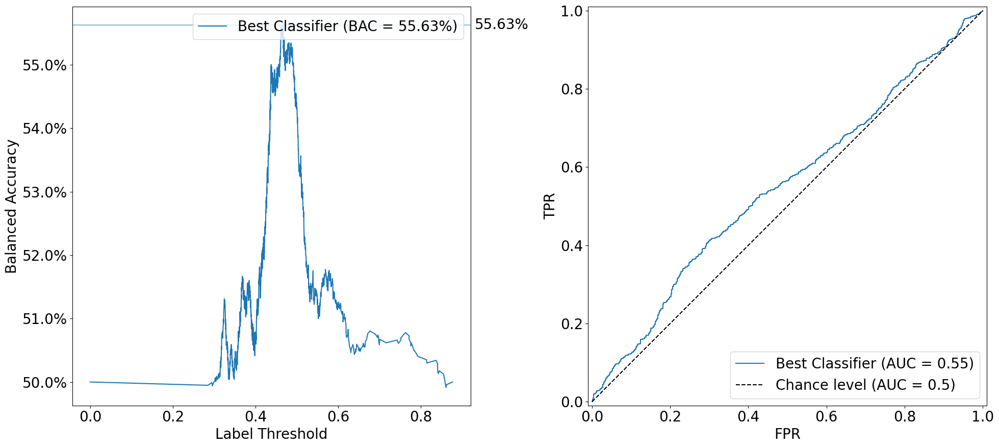

In [180]:
ff2 = FeedForward(specs=specs, rng=1)
ff2.load_state_dict(torch.load("ff.model", weights_only=True))
ff2.eval()

def params(model):
    return model.parameters()

#52.5
#torch.nn.Sequential(ff2,torch.nn.Linear(w,1))
model = FeedForwardSKC(None, ff2, params, rng=1, loss=torch.nn.BCEWithLogitsLoss())
#model = FeedForwardSKC(None, FeedForward(specs+[1]), params, rng=1, loss=torch.nn.BCEWithLogitsLoss())
#model = FeedForwardSKC(None, FeedForward([len(X[0]),1]), params, rng=1, loss=torch.nn.BCEWithLogitsLoss())
#model = RandomForestClassifier()

#cv    = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)
cv = LeaveOneGroupOut()
#model = FeedForwardSKC(None, model, params=params, rng=1, loss=torch.nn.BCEWithLogitsLoss())

preds = cross_val_predict(model, X, Y, groups=G, cv=cv, n_jobs=5)

df = pd.DataFrame({'scores':torch.sigmoid(torch.tensor(preds)), "labels": Y.squeeze()})

f,ax = plt.subplots(nrows=1,ncols=2,figsize=(20,10))
acc_plot(df,"Best Classifier",ax[0])
roc_plot(df,"Best Classifier",ax[1])
plt.tight_layout()

RNG=1


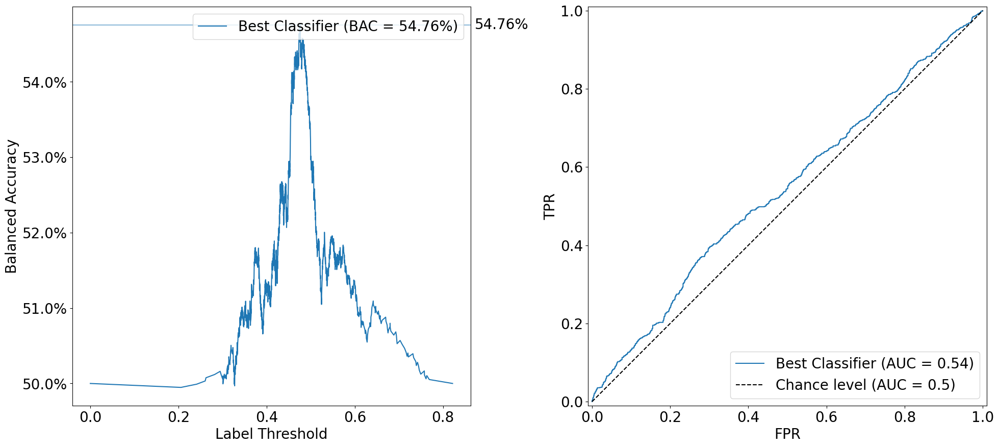

RNG=2


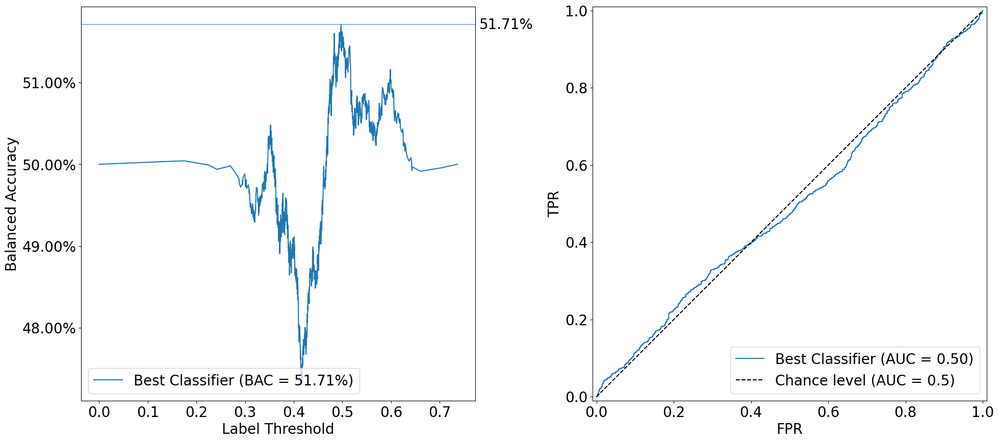

RNG=3


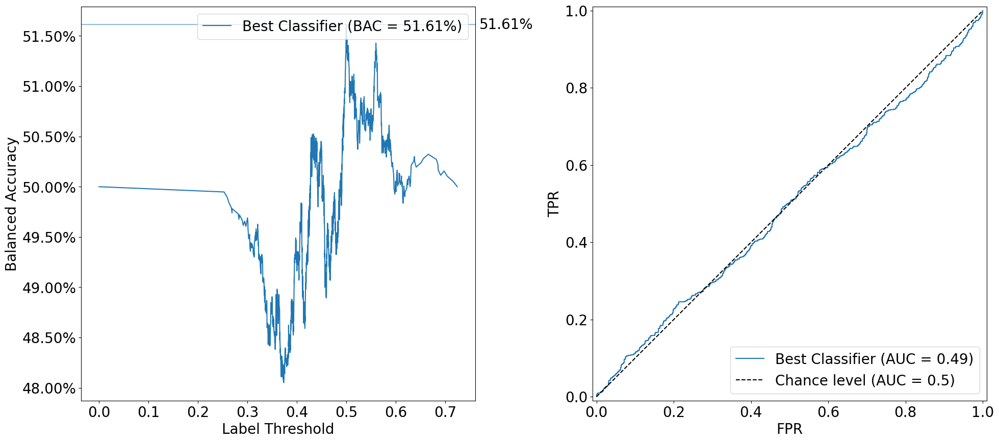

RNG=4


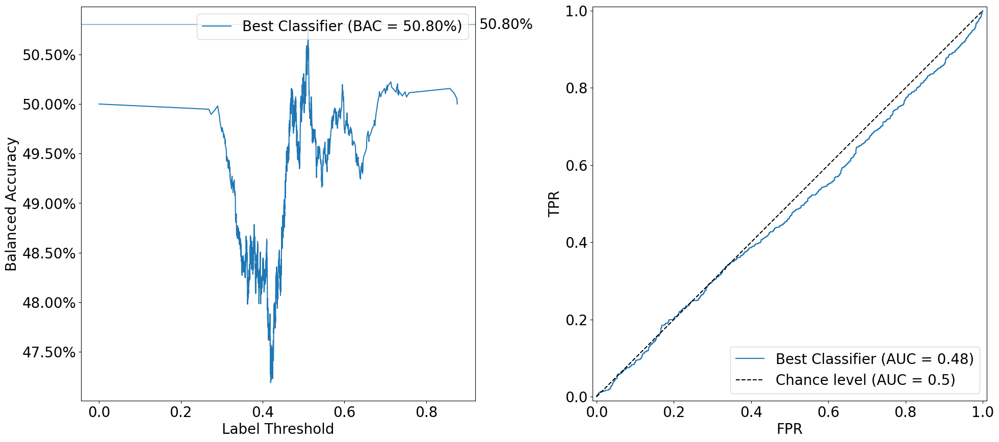

RNG=5


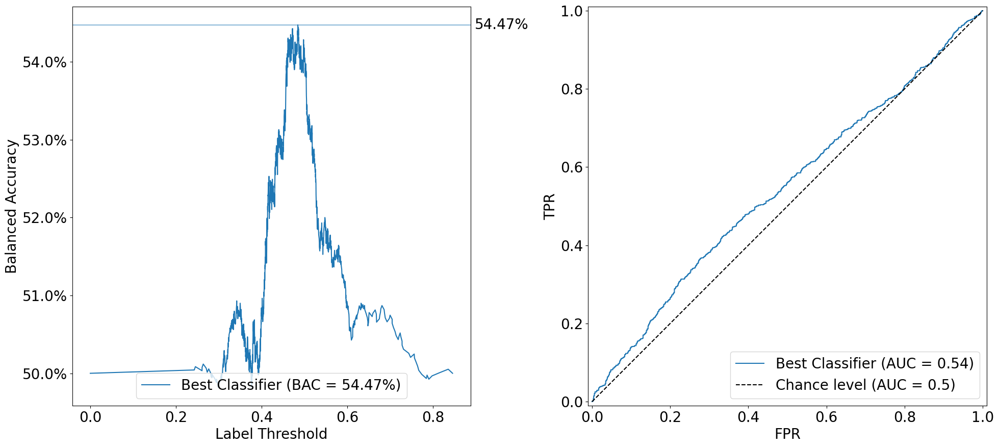

In [184]:
for rng in range(1,6):
    #torch.manual_seed(rng)

    N,SSLX,SSLY = len(X[0]),[],[]
    by_class  = {y: torch.tensor(X)[(Y==y).astype(bool)] for y in set(Y)}

    for _ in range(3):
        for x,y in zip(torch.tensor(X),torch.tensor(Y)):
            y = y.squeeze().int().item()
            for i in set(Y):
                ix = by_class[i][(torch.rand(1)*len(by_class[i])).squeeze().int().item()] #type: ignore
                SSLX.append(torch.concat([x,ix]).tolist())
                SSLY.append(int(i==y))

    SSLX = torch.tensor(SSLX).float()
    SSLY = torch.tensor(SSLY).float()

    ff = FeedForward(specs=[len(X[0]),10,1], rng=rng)
    opt = COCOB(ff.parameters())

    #torch.manual_seed(rng)

    torch_dataset = torch.utils.data.TensorDataset(SSLX,SSLY)
    torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=512,drop_last=True,shuffle=True)

    loss = torch.nn.BCEWithLogitsLoss()

    fhat1 = lambda x: (ff(x[:,:N])-ff(x[:,N:])).abs().sum(dim=1)
    fhat2 = lambda x: (ff(x[:,:N])*ff(x[:,N:])).sum(dim=1)

    for _ in range(500):
        for _X,_y in torch_loader:
            opt.zero_grad()
            loss(fhat2(_X),_y).backward()
            opt.step()

    def params(model):
        return model.parameters()

    #torch.manual_seed(rng)
    model = FeedForwardSKC(None, ff, params, rng=rng, loss=torch.nn.BCEWithLogitsLoss())
    preds = cross_val_predict(model, X, Y, groups=G, cv=LeaveOneGroupOut(), n_jobs=5)

    df = pd.DataFrame({'scores':torch.sigmoid(torch.tensor(preds)), "labels": Y.squeeze()})

    print(f"RNG={rng}")
    f,ax = plt.subplots(nrows=1,ncols=2,figsize=(20,10))
    acc_plot(df,"Best Classifier",ax[0])
    roc_plot(df,"Best Classifier",ax[1])
    plt.tight_layout()
    plt.show()


In [4]:
specs = [
    [len(X[0]),30,'l','r',30,'l','r',1]
]


for spec in specs:
    for rng in product(range(3),range(3),range(3),range(3)):
        torch.manual_seed(rng[0])

        N,SSLX,SSLY = len(X[0]),[],[]
        by_class  = {y: torch.tensor(X)[(Y==y).astype(bool)] for y in set(Y)}

        for _ in range(3):
            for x,y in zip(torch.tensor(X),torch.tensor(Y)):
                y = y.squeeze().int().item()
                for i in set(Y):
                    ix = by_class[i][(torch.rand(1)*len(by_class[i])).squeeze().int().item()] #type: ignore
                    SSLX.append(torch.concat([x,ix]).tolist())
                    SSLY.append(int(i==y))

        SSLX = torch.tensor(SSLX).float()
        SSLY = torch.tensor(SSLY).float()

        ff = FeedForward(specs=spec, rng=rng[1])
        opt = COCOB(ff.parameters())

        torch.manual_seed(rng[2])

        torch_dataset = torch.utils.data.TensorDataset(SSLX,SSLY)
        torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=512,drop_last=True,shuffle=True)

        loss = torch.nn.BCEWithLogitsLoss()

        fhat1 = lambda x: (ff(x[:,:N])-ff(x[:,N:])).abs().sum(dim=1)
        fhat2 = lambda x: (ff(x[:,:N])*ff(x[:,N:])).sum(dim=1)

        for _ in range(1000):
            for _X,_y in torch_loader:
                opt.zero_grad()
                loss(fhat2(_X),_y).backward()
                opt.step()

        def params(model):
            return model.parameters()

        model = FeedForwardSKC(None, ff, params, rng=rng[3], loss=torch.nn.BCEWithLogitsLoss())
        preds = cross_val_predict(model, X, Y, groups=G, cv=LeaveOneGroupOut(), n_jobs=5)

        df = pd.DataFrame({'scores':torch.sigmoid(torch.tensor(preds)), "labels": Y.squeeze()})

        lbl = df['labels'].tolist()
        scr = df['scores'].tolist()

        _,Z = zip(*balanced_accuracy_scores(lbl,scr))
        print(f"{rng} {max(Z)*100:.2f}; {spec}")


NameError: name 'X' is not defined

In [175]:
class FeedForwardSK:
    def __init__(self, fhat, specs):
        self.specs = specs
        self.fhat = fhat
        self.opt = None

    @property
    def params(self):
        return {'specs': self.specs}

    def iter_fit(self,X,y):
        self.opt = self.opt or COCOB(self.fhat.parameters())
        loss = torch.nn.BCEWithLogitsLoss()

        if not torch.is_tensor(X):
            X = torch.tensor(X).float()
        if not torch.is_tensor(y):
            y = torch.tensor([y]).float()

        self.opt.zero_grad()
        loss(self.fhat(X),y).backward()
        self.opt.step()

    def predict(self,X):
        with torch.no_grad():
            if not torch.is_tensor(X): 
                X = torch.tensor(X).float()
            return self.fhat(X)

class MyEnvironment:
    def __init__(self, X, Y, g):
        self.interactions = [ {"x": x, "y": y} for x,y in zip(X,Y) ]
        self.params = {'pid': g}
    def read(self):
        return self.interactions

class MyEvaluator:
    def __init__(self, num_threads):
        self.num_threads = num_threads
    def evaluate(self, env: cb.Environment, lrn):
        if self.num_threads: 
            torch.set_num_threads(self.num_threads)
        for row in env.read():
            true_x, true_y = row["x"],row["y"]
            pred_y = lrn.predict(true_x)[0].item()
            lrn.iter_fit(true_x,true_y)
            yield {'pred': pred_y, 'true': true_y}

In [176]:
def local():

    Y = ((can_predict["ER Interest"]-1)<2).astype(float).to_numpy()
    G = can_predict["ParticipantId"].to_numpy()

    def make_envs(X, Y, G):
        X, Y, G = np.array(X), np.array(Y), np.array(G)
        return [MyEnvironment(X[g==G].tolist(), Y[g==G].tolist(), g) for g in set(G)]

    vals = MyEvaluator(1)
    envs = cb.Environments.from_custom(*make_envs(X,Y,G)).take(40, True).shuffle(n=100)  # type: ignore
    lrns = FeedForwardSK(torch.nn.Sequential(ff,torch.nn.Linear(80,1)), None)
    #lrns = FeedForwardSK(torch.nn.Sequential(FeedForward(specs=[len(X[0]), w]+[r(w)]*10, rng=1),torch.nn.Linear(80,1)), [len(X[0]), w]+[r(w)]*10 + [1])

    return cb.Experiment(envs,lrns,vals).run(processes=40, quiet=True) # type: ignore

result3 = local()

# out = result.interactions.to_pandas().groupby(['index','true'])['pred'].mean().reset_index()
# out['true'] += 1
# out['pred'] += 1
# out.pivot(index='true',columns='index').plot(figsize=(5,5),color=list(map(str,np.linspace(.5,0,30))),legend=False,xlim=[.6,10.25],ylim=[.6,10.25])
# plt.plot([1,10],[1,10])
# plt.title(f"{wlen}")
# plt.yticks([1,4,7,10])
# plt.xticks([1,4,7,10])
# plt.ylabel('pred')
# plt.show()

In [60]:
model.fhat

Linear(in_features=29, out_features=1, bias=True)

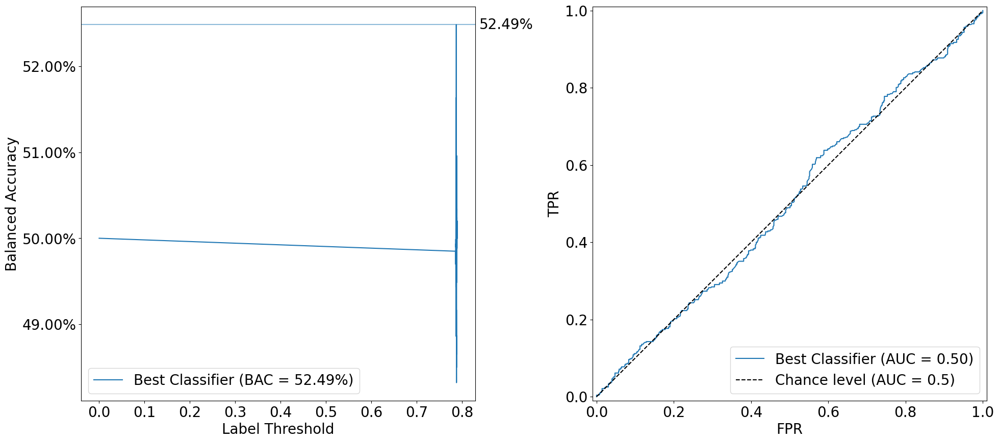

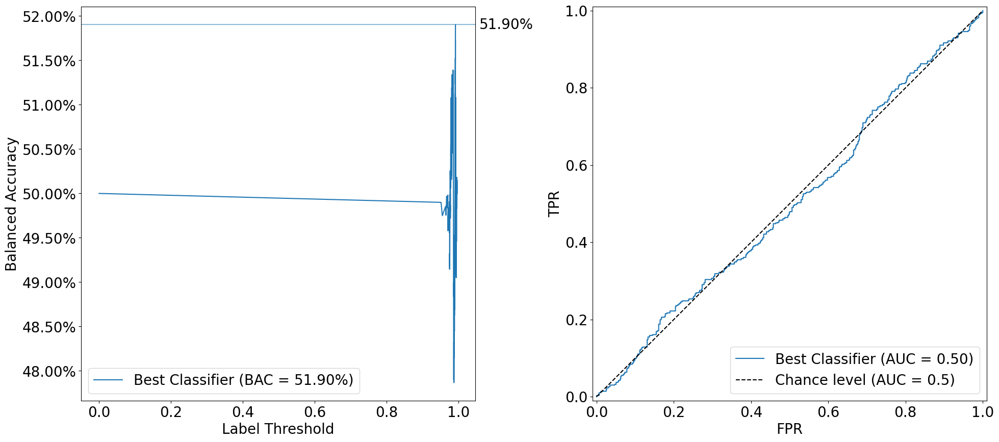

/home/mrucker/miniconda3/envs/diss/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:1137: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  warnings.warn(


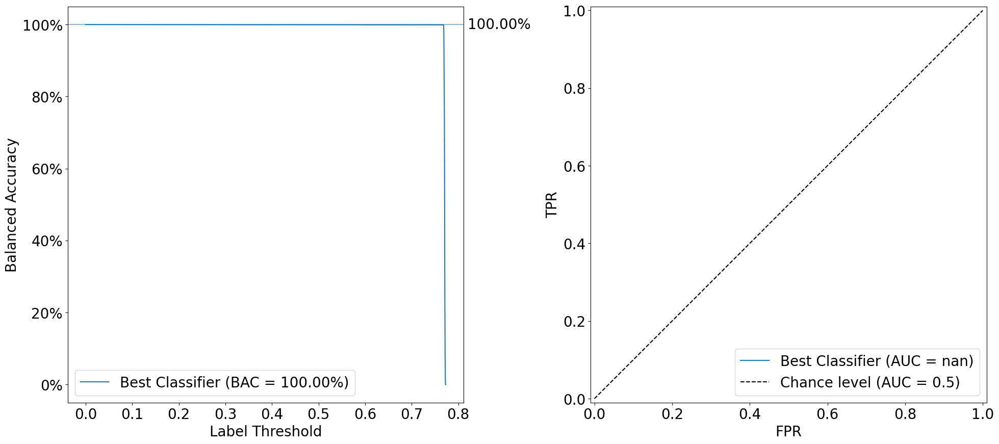

-------------------


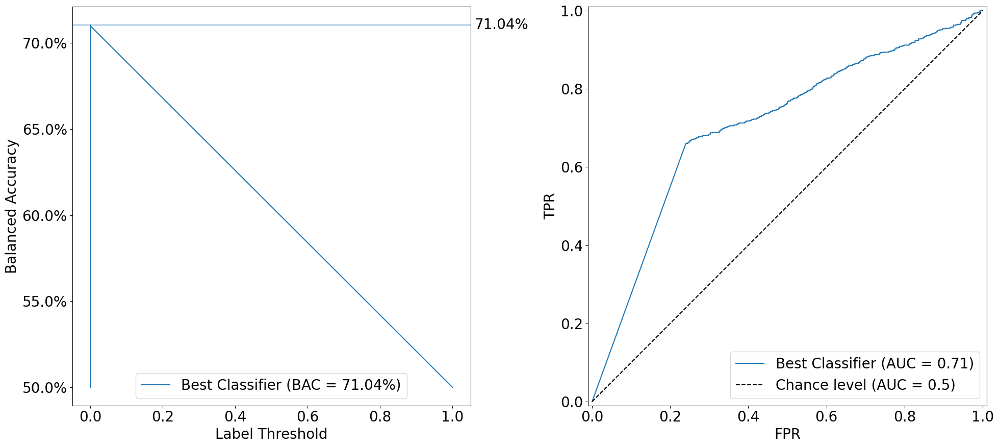

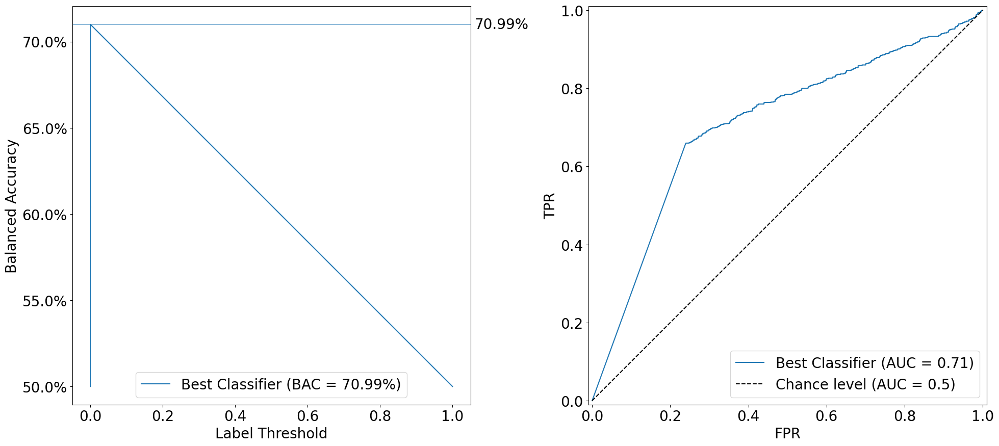

/home/mrucker/miniconda3/envs/diss/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:1137: UndefinedMetricWarning: No negative samples in y_true, false positive value should be meaningless
  warnings.warn(


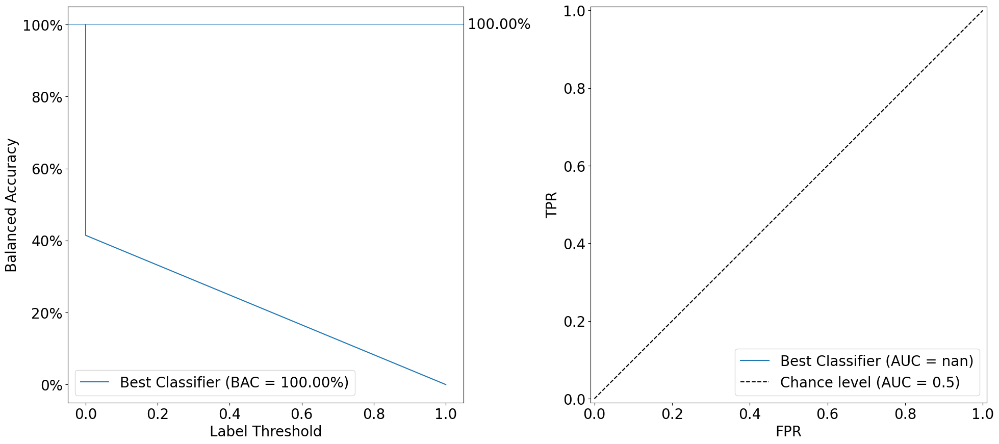

-------------------


In [ ]:
for i in range(1,3):
    #this is old SSL
    out = result.where(index=i)
    out = out.interactions.to_pandas()

    df = pd.DataFrame({'scores':torch.sigmoid(torch.tensor(out["pred"].tolist())), "labels": (out["true"]<2).astype(int)})

    f,ax = plt.subplots(nrows=1,ncols=2,figsize=(20,10))
    acc_plot(df,"Best Classifier",ax[0])
    roc_plot(df,"Best Classifier",ax[1])
    plt.tight_layout()
    plt.show()

    #this is random
    out = result2.where(index=i)
    out = out.interactions.to_pandas()

    df = pd.DataFrame({'scores':torch.sigmoid(torch.tensor(out["pred"].tolist())), "labels": (out["true"]<2).astype(int)})

    f,ax = plt.subplots(nrows=1,ncols=2,figsize=(20,10))
    acc_plot(df,"Best Classifier",ax[0])
    roc_plot(df,"Best Classifier",ax[1])
    plt.tight_layout()
    plt.show()

    #this is new SSL
    out = result3.where(index=i)
    out = out.interactions.to_pandas()

    df = pd.DataFrame({'scores':torch.sigmoid(torch.tensor(out["pred"].tolist())), "labels": out["true"] })

    f,ax = plt.subplots(nrows=1,ncols=2,figsize=(20,10))
    acc_plot(df,"Best Classifier",ax[0])
    roc_plot(df,"Best Classifier",ax[1])
    plt.tight_layout()
    plt.show()

    print("-------------------")


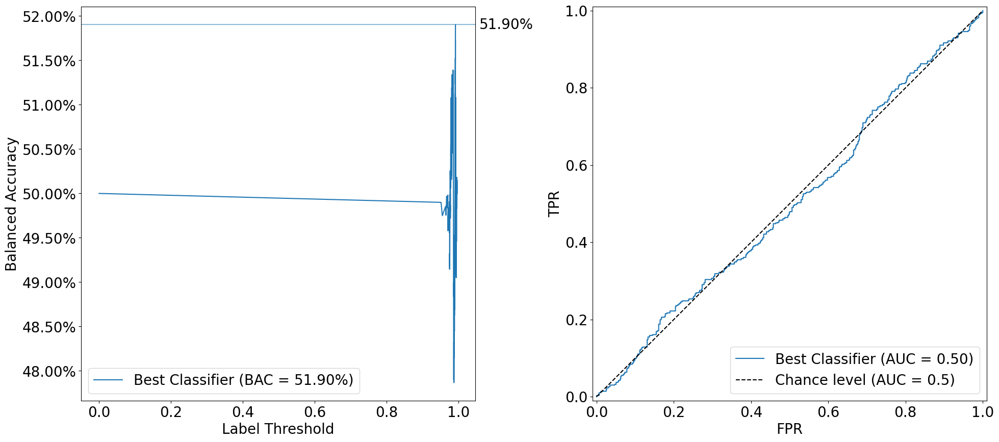

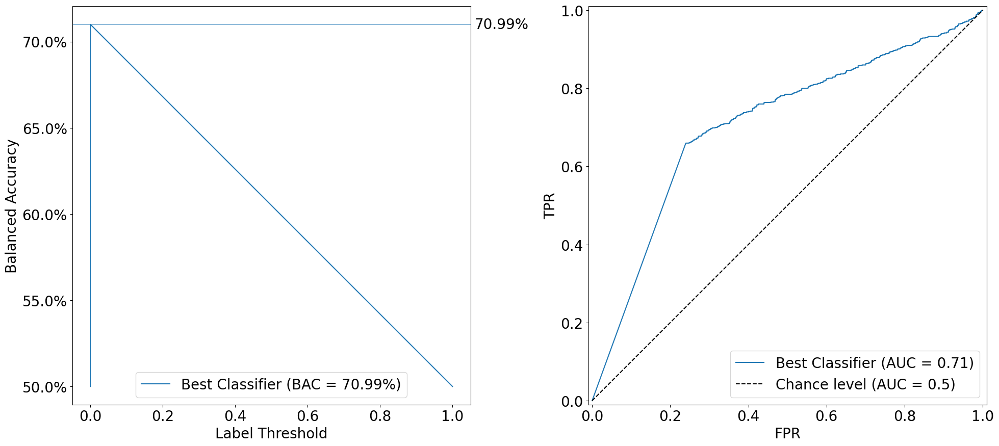

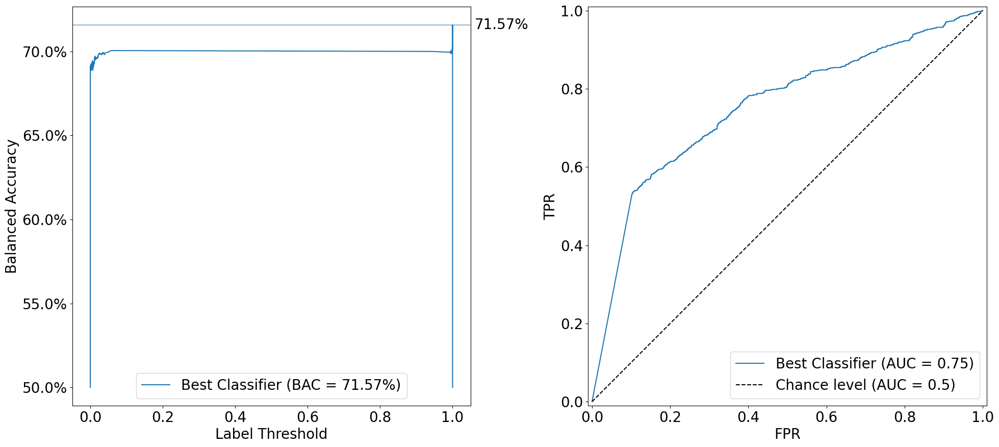

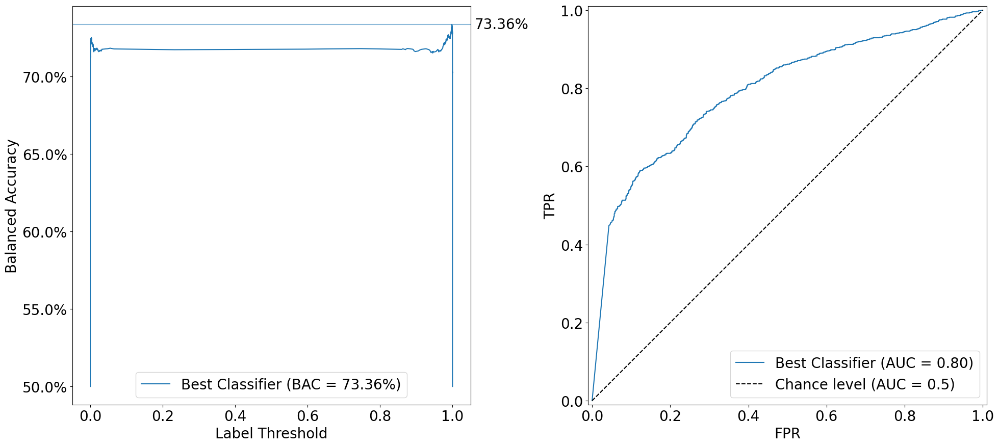

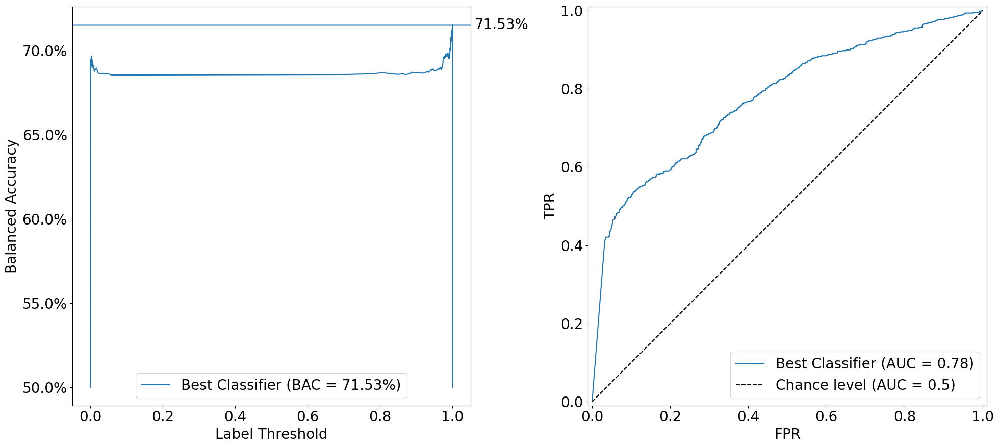

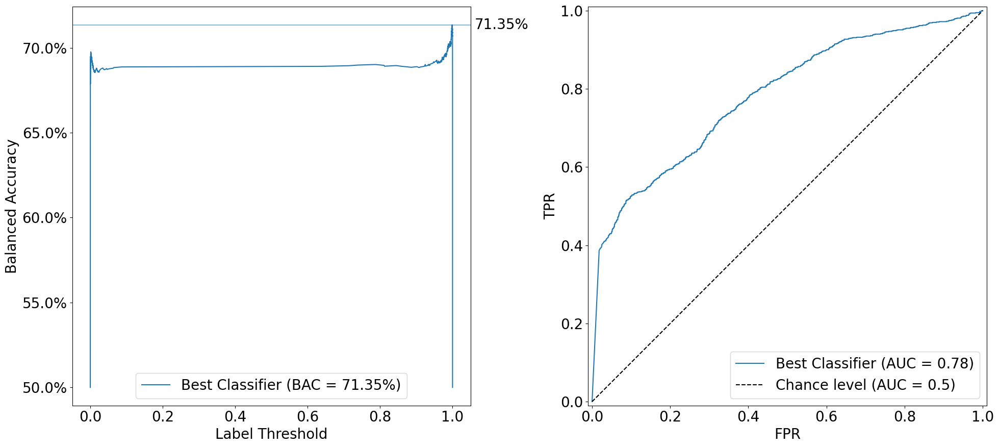

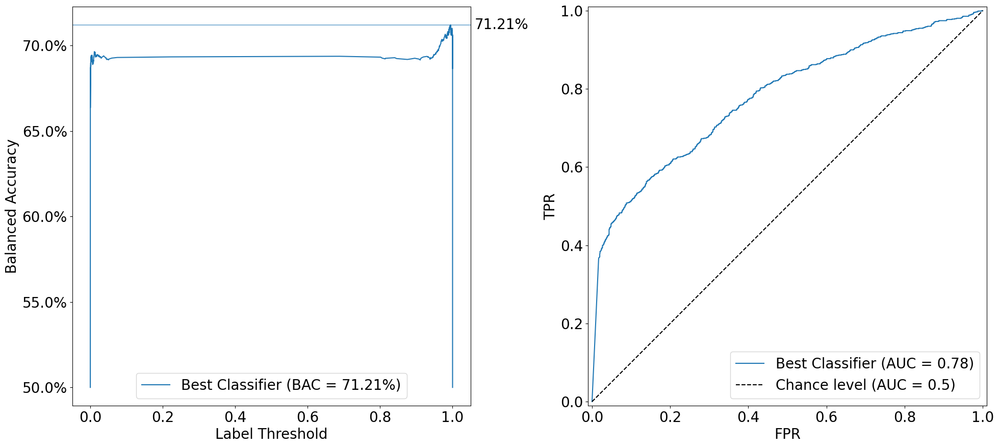

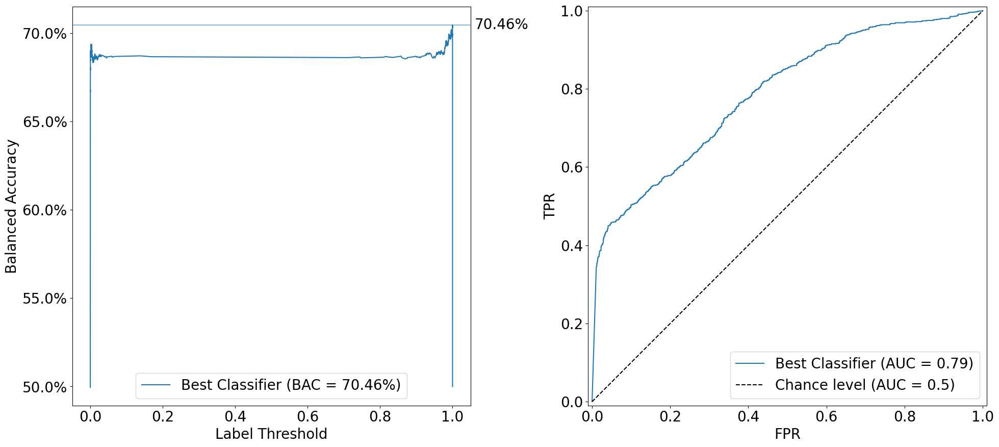

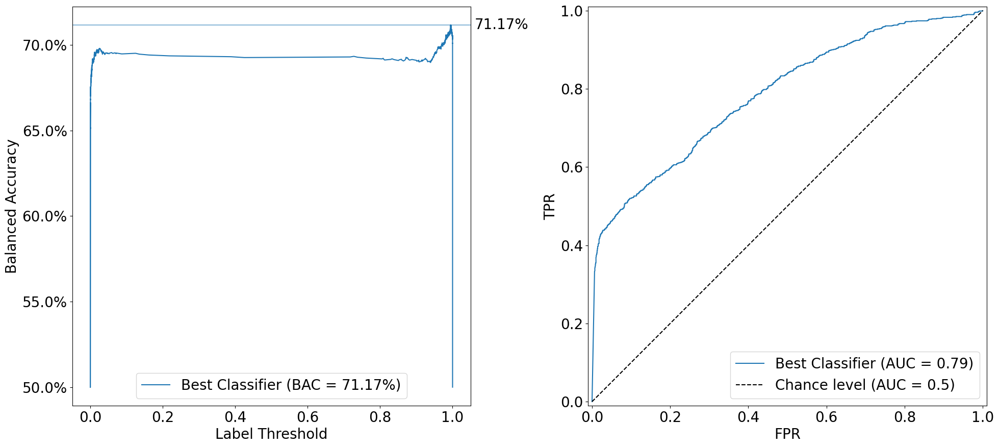

In [137]:
for i in range(1,10):
    out = result2.where(index=i)
    out = out.interactions.to_pandas()

    df = pd.DataFrame({'scores':torch.sigmoid(torch.tensor(out["pred"].tolist())), "labels": (out["true"]<2).astype(int)})

    f,ax = plt.subplots(nrows=1,ncols=2,figsize=(20,10))
    acc_plot(df,"Best Classifier",ax[0])
    roc_plot(df,"Best Classifier",ax[1])
    plt.tight_layout()
    plt.show()


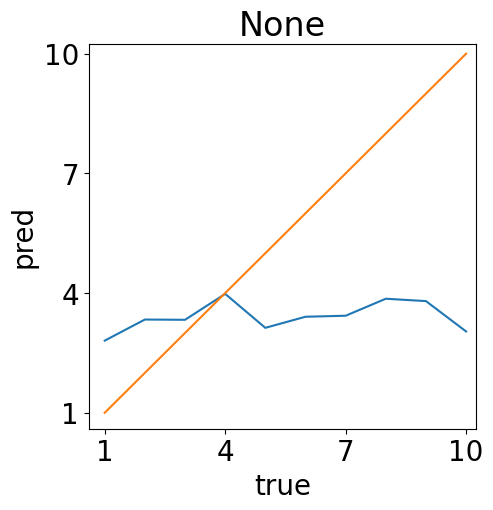

In [120]:
# out = result.where(index=30)
# out = pd.merge(pd.merge(out.environments.to_pandas(),out.interactions.to_pandas()),out.learners.to_pandas())
# out = out.groupby(['pid','specs','true'])['pred'].mean().reset_index()
# out = out.groupby(['specs','true'])['pred'].mean().reset_index()

# out.pivot(index='true',columns='specs',values='pred').plot(figsize=(10,5),legend=True)
# #out['true'] += 1
# #out['pred'] += 1
# out.pivot(index='true',columns='specs',values='pred').plot(figsize=(10,5),legend=True)
# #plt.plot([1,10],[1,10])
# plt.show()
out = result.where(index=40)
out = pd.merge(out.environments.to_pandas(),out.interactions.to_pandas())
out = out.groupby(['index','pid','true'])['pred'].mean().reset_index()
out = out.groupby(['index','true'])['pred'].mean().reset_index()
out['true'] += 1
out['pred'] += 1
out.pivot(index='true',columns='index').plot(figsize=(5,5),legend=False,xlim=[.6,10.25],ylim=[.6,10.25])
plt.plot([1,10],[1,10])
plt.title(f"{wlen}")
plt.yticks([1,4,7,10])
plt.xticks([1,4,7,10])
plt.ylabel('pred')
plt.show()

In [6]:
def balanced_accuracy_scores(y_true,y_scores):
    from operator import itemgetter
    from itertools import groupby

    nclass = len(set(y_true))
    n0,n1  = len(y_true)-sum(y_true),sum(y_true)
    c0,c1  = 0,n1
    n0,n1  = (n0*nclass or 1), (n1*nclass or 1)

    yield (0,(c0/(n0 or 1)+c1/(n1 or 1)))

    for t,g in groupby(sorted(zip(y_scores,y_true)),key=itemgetter(0)):
        ls = list(map(itemgetter(1),g))
        c0 += len(ls)-sum(ls)
        c1 -= sum(ls)
        yield (t,(c0/n0+c1/n1))

def add_day_columns(df, timestamp_col, participant_df):
    return add_rel_day(add_start_day(add_day(df, timestamp_col), participant_df))

def add_day(df, timestamp_col):
    df = df.copy()
    df["Day"] = (df[timestamp_col]/(60*60*24)).apply(np.floor)
    return df

def add_start_day(df, participant_df):
    participant_df = participant_df.copy()
    participant_df["StartDay"] = (participant_df["DataStartStampUtc"]/(60*60*24)).apply(np.floor)
    return pd.merge(df, participant_df[['ParticipantId',"StartDay"]])

def add_rel_day(df):
    df = df.copy()
    df["RelDay"] = df["Day"]-df["StartDay"]
    return df

def scale(df, group_col, scale_col, scaler, postfix):
    for gid in set(df[group_col]):
        df.loc[df[group_col]==gid,[scale_col+postfix]] = scaler.fit_transform(df.loc[df[group_col]==gid,[scale_col]])

def drop_all1_ends(df):

    drop = df.copy()
    keep = df.copy()
    
    drop = drop[drop["State Anxiety"]!= 1]
    drop = drop.groupby("ParticipantId")["RelDay"].max().reset_index()
    drop = drop.rename(columns={"RelDay":"Last Day With Anxiety > 1"})
    drop = drop[drop["Last Day With Anxiety > 1"] <= 8 ]

    for pid,day in drop.itertuples(index=False):
        is_not_pid = keep["ParticipantId"] != pid
        is_lt_day  = keep["RelDay"] < day
        keep = keep[is_not_pid | is_lt_day]

    return keep

def get_trimmed_pids(df):
    df = df.copy()
    df = df[~df["ER Interest"].isna()]
    df = df.groupby(["ParticipantId","RelDay"]).size().reset_index(drop=False)
    df = df.groupby(['ParticipantId']).size().reset_index(drop=False).rename(columns={0:"Count"})
    return df.loc[df.Count < 6,'ParticipantId'].tolist()

def make_data():
    participant_df = pd.read_csv('../data/Participants.csv')
    emotions_df = pd.read_csv('../data/Emotions.csv')
    emotions_df = emotions_df[emotions_df["WatchDataQuality"] == "Good"]
    emotions_df["ER Interest"] = pd.to_numeric(emotions_df["ER Interest"], errors='coerce')
    emotions_df = add_day_columns(emotions_df, "OpenedTimestampUtc", participant_df)
    emotions_df = emotions_df[emotions_df["RelDay"] < 11]
    emotions_df = drop_all1_ends(emotions_df)
    emotions_df = emotions_df[~emotions_df["ParticipantId"].isin(get_trimmed_pids(emotions_df))]
    return emotions_df

def _cal_freq_list(freq_init, frequency_num, max_radius, min_radius):
    if freq_init == "random":
        # the frequence we use for each block, alpha in ICLR paper
        # freq_list shape: (frequency_num)
        freq_list = np.random.random(size=[frequency_num]) * max_radius
    elif freq_init == "geometric":
        # freq_list = []
        # for cur_freq in range(frequency_num):
        #     base = 1.0/(np.power(max_radius, cur_freq*1.0/(frequency_num-1)))
        #     freq_list.append(base)

        # freq_list = np.asarray(freq_list)

        log_timescale_increment = (np.log(float(max_radius) / float(min_radius)) /
          (frequency_num*1.0 - 1))

        timescales = min_radius * np.exp(
            np.arange(frequency_num).astype(float) * log_timescale_increment)

        freq_list = 1.0/timescales

    return freq_list

class TheoryGridCellSpatialRelationEncoder(torch.nn.Module):
    """
    Given a list of (deltaX,deltaY), encode them using the position encoding function

    """
    def __init__(self, spa_embed_dim, coord_dim = 2, frequency_num = 16, 
        max_radius = 10000,  min_radius = 1000, freq_init = "geometric", ffn = None):
        """
        Args:
            spa_embed_dim: the output spatial relation embedding dimention
            coord_dim: the dimention of space, 2D, 3D, or other
            frequency_num: the number of different sinusoidal with different frequencies/wavelengths
            max_radius: the largest context radius this model can handle
        """
        super(TheoryGridCellSpatialRelationEncoder, self).__init__()
        self.frequency_num = frequency_num
        self.coord_dim = coord_dim 
        self.max_radius = max_radius
        self.min_radius = min_radius
        self.spa_embed_dim = spa_embed_dim
        self.freq_init = freq_init

        # the frequence we use for each block, alpha in ICLR paper
        self.cal_freq_list()
        self.cal_freq_mat()

        # there unit vectors which is 120 degree apart from each other
        self.unit_vec1 = np.asarray([1.0, 0.0])                        # 0
        self.unit_vec2 = np.asarray([-1.0/2.0, np.sqrt(3)/2.0])      # 120 degree
        self.unit_vec3 = np.asarray([-1.0/2.0, -np.sqrt(3)/2.0])     # 240 degree

        self.input_embed_dim = self.cal_input_dim()

        self.ffn = ffn
        
    def cal_freq_list(self):
        self.freq_list = _cal_freq_list(self.freq_init, self.frequency_num, self.max_radius, self.min_radius)

    def cal_freq_mat(self):
        # freq_mat shape: (frequency_num, 1)
        freq_mat = np.expand_dims(self.freq_list, axis = 1)
        # self.freq_mat shape: (frequency_num, 6)
        self.freq_mat = np.repeat(freq_mat, 6, axis = 1)

    def cal_input_dim(self):
        # compute the dimention of the encoded spatial relation embedding
        return int(6 * self.frequency_num)


    def make_input_embeds(self, coords):
        if type(coords) == np.ndarray:
            assert self.coord_dim == np.shape(coords)[2]
            coords = list(coords)
        elif type(coords) == list:
            coords = [[c] for c in coords]
            assert self.coord_dim == len(coords[0][0])
        else:
            raise Exception("Unknown coords data type for GridCellSpatialRelationEncoder")

        
        # (batch_size, num_context_pt, coord_dim)
        coords_mat = np.asarray(coords).astype(float)
        batch_size = coords_mat.shape[0]
        num_context_pt = coords_mat.shape[1]

        # compute the dot product between [deltaX, deltaY] and each unit_vec 
        # (batch_size, num_context_pt, 1)
        angle_mat1 = np.expand_dims(np.matmul(coords_mat, self.unit_vec1), axis = -1)
        # (batch_size, num_context_pt, 1)
        angle_mat2 = np.expand_dims(np.matmul(coords_mat, self.unit_vec2), axis = -1)
        # (batch_size, num_context_pt, 1)
        angle_mat3 = np.expand_dims(np.matmul(coords_mat, self.unit_vec3), axis = -1)

        # (batch_size, num_context_pt, 6)
        angle_mat = np.concatenate([angle_mat1, angle_mat1, angle_mat2, angle_mat2, angle_mat3, angle_mat3], axis = -1)
        # (batch_size, num_context_pt, 1, 6)
        angle_mat = np.expand_dims(angle_mat, axis = -2)
        # (batch_size, num_context_pt, frequency_num, 6)
        angle_mat = np.repeat(angle_mat, self.frequency_num, axis = -2)
        # (batch_size, num_context_pt, frequency_num, 6)
        angle_mat = angle_mat * self.freq_mat
        # (batch_size, num_context_pt, frequency_num*6)
        spr_embeds = np.reshape(angle_mat, (batch_size, num_context_pt, -1))

        # make sinuniod function
        # sin for 2i, cos for 2i+1
        # spr_embeds: (batch_size, num_context_pt, frequency_num*6=input_embed_dim)
        spr_embeds[:, :, 0::2] = np.sin(spr_embeds[:, :, 0::2])  # dim 2i
        spr_embeds[:, :, 1::2] = np.cos(spr_embeds[:, :, 1::2])  # dim 2i+1
        
        return spr_embeds.squeeze().tolist()
        
    def forward(self, coords):
        """
        Given a list of coords (deltaX, deltaY), give their spatial relation embedding
        Args:
            coords: a python list with shape (batch_size, num_context_pt, coord_dim)
        Return:
            sprenc: Tensor shape (batch_size, num_context_pt, spa_embed_dim)
        """
        spr_embeds = self.make_input_embeds(coords)

        # spr_embeds: (batch_size, num_context_pt, input_embed_dim)
        spr_embeds = torch.FloatTensor(spr_embeds) 

        if self.ffn is not None:
            return self.ffn(spr_embeds)
        else:
            return spr_embeds

def wins(file_path, timestamps, window_len):
    file = open(file_path) if Path(file_path).exists() else nullcontext()
    rows = islice(csv.reader(file),1,None) if Path(file_path).exists() else [] #type: ignore

    with file:
        for timestamp in timestamps:
            window = []
            for row in rows:
                if float(row[0]) < timestamp-window_len: continue
                if float(row[0]) > timestamp: break
                data = map(float,row[1:])
                window.append(next(data) if len(row) == 2 else tuple(data))
            yield window

def miss(miss, not_miss, n_feat):
    features = []
    for m in miss:
        if m: features.append([0]*n_feat+[1])
        else: features.append(not_miss.pop()+[0])
    return features

def lins(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/LinearAcceleration.csv", timestamps, window_len or 100):
        missings.append(not w)
        if not w: continue
        vars = np.var(w,axis=0)
        pcts = np.percentile([np.linalg.norm(w,axis=1)],q=[10,50,90])
        features.append([*vars,*pcts])
    if features: features = StandardScaler().fit_transform(features).tolist()
    return miss(missings,features,6)

def bats(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/Battery.csv", timestamps, window_len or 600):
        missings.append(not w)
        if not w: continue
        w = [float(w)/100 for w in w]
        features.append([np.mean(w),np.std(w)])
    return miss(missings,features,2)

def peds(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/Pedometer.csv", timestamps, window_len or 100):
        missings.append(not w)
        if not w: continue
        features.append([np.mean(w),np.std(w)])
    if features: features = StandardScaler().fit_transform(features).tolist()
    return miss(missings,features,2)

def locs1(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/Location.csv", timestamps, window_len or 600):
        missings.append(not w)
        if not w: continue
        features.append([*np.mean(w,axis=0)[1:]])
    
    if features: features = TheoryGridCellSpatialRelationEncoder(2,frequency_num=n_freq,max_radius=lmax,min_radius=lmin).make_input_embeds(features)
    return miss(missings,features,n_freq*6)

def locs2(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    missings = []
    features = []
    for w in wins(f"../data/phone/{pid}/Location.csv", timestamps, window_len):
        missings.append(not w)
        if not w: continue
        features.append([*np.mean(w,axis=0)[1:]])
    
    return miss(missings,features,2)

def tims(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    features = []
    hour = 60*60
    day = 24*hour
    for timestamp,tz in zip(timestamps,tzs):

        if tz == "-04:00":
            timestamp -= 4*hour
        elif tz == "-05:00":
            timestamp -= 5*hour

        time_of_day = (timestamp/day) % 1
        day_of_week = (int(timestamp/day)+4) % 7
        is_weekend = day_of_week in [0,6]
        is_weekday = day_of_week in [1,2,3,4,5]
        features.append([time_of_day,int(is_weekend),int(is_weekday)])
    return features

def nulls(work_item, window_len=None):
    pid,timestamps,tzs = work_item
    return [[0]*4 for t in timestamps]

def calc_feats(work_item_and_len):
    features = []
    #for feats in zip(*[f(*work_item_and_len) for f in [tims,peds,bats,lins]]):
    #for feats in zip(*[f(*work_item_and_len) for f in [tims,lins]]):
    for feats in zip(*[f(*work_item_and_len) for f in [locs1,lins,tims,bats,peds]]):
        features.append(list(chain.from_iterable(feats)))
    return features

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """
        
        def make_layer(curr_dim,spec):
            if isinstance(spec,float):
                return torch.nn.Dropout(spec), curr_dim
            if curr_dim is None and isinstance(spec,int):
                return None, spec
            if isinstance(spec,int):
                return torch.nn.Linear(curr_dim,spec),spec
            if spec == 'r':
                return torch.nn.ReLU(),curr_dim
            if spec == 'l':
                return torch.nn.LayerNorm(curr_dim),curr_dim
            if spec == 'b':
                return torch.nn.BatchNorm1d(curr_dim), curr_dim
            if spec == 's':
                return torch.nn.Sigmoid(),curr_dim
            if isinstance(spec,list):                
                return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
            raise Exception("Bad Layer")

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = make_layer(width,spec)
            if layer: layers.append(layer)

        super().__init__(*layers)

class FeedForwardSKC(BaseEstimator):
    def __init__(self, specs = None, fhat = None, params = None, trn_size = .5, stop = 4, rng = 1, loss=None):
        self.specs = specs
        self.trn_size = trn_size
        self.fhat = fhat
        self.params = params
        self.loss = loss or torch.nn.BCEWithLogitsLoss()
        self.stop = stop
        self.rng  = rng

    def get_params(self, deep=True):
        return {"specs": self.specs, "trn_size": self.trn_size, "stop": self.stop, "rng": self.rng, "loss": self.loss, "fhat": self.fhat, "params": self.params}

    def set_params(self,**params):
        return FeedForwardSKC(**{**self.get_params(), **params})

    def fit(self,X,Y):
        fhat = self.fhat
        opt  = COCOB(self.params(fhat))
        loss = self.loss

        if not torch.is_tensor(X):
            X = torch.tensor(X).float()
        if not torch.is_tensor(Y):
            Y = torch.tensor(Y).unsqueeze(1).float()

        trn,val = next(StratifiedShuffleSplit(1, train_size=self.trn_size, random_state=self.rng).split(X,Y))

        trn_X = X[trn]
        trn_y = Y[trn]
        val_X = X[val]
        val_y = Y[val]

        torch.manual_seed(self.rng)
        torch_dataset = torch.utils.data.TensorDataset(trn_X,trn_y)
        torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=64,drop_last=True,shuffle=True)

        val_losses = []
        trn_losses = []

        with torch.no_grad():
            stop_criteria = 0
            trn_losses.append(loss(fhat(trn_X),trn_y))
            val_losses.append(loss(fhat(val_X),val_y))

        for _ in range(500):
            for _X,_y in torch_loader:
                opt.zero_grad()
                loss(fhat(_X),_y).backward()
                opt.step()

            with torch.no_grad():
                trn_losses.append(loss(fhat(trn_X),trn_y))
                val_losses.append(loss(fhat(val_X),val_y))

                if self.stop == 1:
                    stop_criteria = (stop_criteria+1) if (val_losses[-1] > val_losses[-2]).item() else 0
                    if stop_criteria == 3: break
                if self.stop == 2:
                    if len(val_losses) > 3 and np.mean(val_losses[-4:-1]) < np.mean(val_losses[-3:]):
                        break
                if self.stop == 3:
                    if len(val_losses) > 3 and np.median(val_losses[-4:-1]) < np.median(val_losses[-3:]):
                        break
                if self.stop == 4:
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

    def iter_fit(self,X,y):
        self.fhat = self.fhat or FeedForward(self.specs, self.rng)
        self.opt  = self.opt or COCOB(self.fhat.parameters())
        
        if not torch.is_tensor(X):
            X = torch.tensor(X).float()
        if not torch.is_tensor(y):
            y = torch.tensor(y).unsqueeze(1).float()

        self.opt.zero_grad()
        self.loss(self.fhat(X),y).backward()
        self.opt.step()

    def predict(self,X):
        self.fhat = self.fhat or FeedForward(self.specs, self.rng)
        with torch.no_grad():
            if not torch.is_tensor(X): 
                X = torch.tensor(X).float()
            return self.fhat(X).squeeze()

emotions_df = make_data()

can_predict = emotions_df[(emotions_df["WatchDataQuality"] == "Good") & ~emotions_df["ER Interest"].isna()].copy()
can_predict = can_predict.sort_values(["ParticipantId","SubmissionTimestampUtc"])

d1 = dict(map(tuple,can_predict.groupby("ParticipantId")["SubmissionTimestampUtc"].apply(list).reset_index().itertuples(index=False)))
d2 = dict(map(tuple,can_predict.groupby("ParticipantId")["LocalTimeZone"].apply(list).reset_index().itertuples(index=False)))

work_items = []
for key in d1.keys():
    work_items.append((key, d1[key], d2[key]))

n_freq = 2
lmin = 10
lmax = 100
wlen = None

#wlen = 100 is best for lins
#wlen = 600 is best for locs1
T = (can_predict["ER Interest"]-1).astype(float).to_numpy()
Y = (T<2).astype(float)
G = can_predict["ParticipantId"].to_numpy()
X = list(chain.from_iterable(map(calc_feats, zip(work_items,repeat(wlen)))))

specs = [
    #[len(X[0]),30,'l','r',30,'l','r',1]
]

#is it better to double my training data or double my epochs over my training data?

for spec in specs:
    for rng in product(range(3),range(3),range(3),range(3)):
        torch.manual_seed(rng[0])

        N,SSLX,SSLY = len(X[0]),[],[]
        by_class  = {y: torch.tensor(X)[(Y==y).astype(bool)] for y in set(Y)}

        for _ in range(3):
            for x,y in zip(torch.tensor(X),torch.tensor(Y)):
                y = y.squeeze().int().item()
                for i in set(Y):
                    ix = by_class[i][(torch.rand(1)*len(by_class[i])).squeeze().int().item()] #type: ignore
                    SSLX.append(torch.concat([x,ix]).tolist())
                    SSLY.append(int(i==y))

        SSLX = torch.tensor(SSLX).float()
        SSLY = torch.tensor(SSLY).float()

        ff = FeedForward(specs=spec, rng=rng[1])
        opt = COCOB(ff.parameters())

        torch.manual_seed(rng[2])

        torch_dataset = torch.utils.data.TensorDataset(SSLX,SSLY)
        torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=512,drop_last=True,shuffle=True)

        loss = torch.nn.BCEWithLogitsLoss()

        fhat1 = lambda x: (ff(x[:,:N])-ff(x[:,N:])).abs().sum(dim=1)
        fhat2 = lambda x: (ff(x[:,:N])*ff(x[:,N:])).sum(dim=1)

        for _ in range(500):
            for _X,_y in torch_loader:
                opt.zero_grad()
                loss(fhat2(_X),_y).backward()
                opt.step()

        def params(model):
            return model.parameters()

        model = FeedForwardSKC(None, ff, params, rng=rng[3], loss=torch.nn.BCEWithLogitsLoss())
        preds = cross_val_predict(model, X, Y, groups=G, cv=LeaveOneGroupOut(), n_jobs=5)

        df = pd.DataFrame({'scores':torch.sigmoid(torch.tensor(preds)), "labels": Y.squeeze()})

        lbl = df['labels'].tolist()
        scr = df['scores'].tolist()

        _,Z = zip(*balanced_accuracy_scores(lbl,scr))
        print(f"{rng} {max(Z)*100:.2f}; {spec}")


In [ ]:
import coba as cb

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*layers)
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}        
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()
    def ssl(self):
        SSLX,SSLY = [],[]
        by_class  = {y: self.train_X[(self.train_Y==y)] for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X,self.train_Y):
                y = y.squeeze().int().item()
                for i in set(Y):
                    ix = by_class[i][int(rng.random()*len(by_class[i]))]
                    SSLX.append(torch.concat([x,ix]).tolist())
                    SSLY.append(float(i==y))
        return torch.tensor(SSLX), torch.tensor(SSLY)
    def ws(self):
        return self.train_X, self.train_Y
    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, ssl, ws):
        self.ssl = ssl
        self.ws = ws
        self.params = {'ssl': ssl, 'ws':ws }

    def evaluate(self, env, lrn):
        torch.set_num_threads(1)
        ff = lrn

        if self.ssl:
            SSLX,SSLY = env.ssl()
            N = int(len(SSLX[0])/2)

            opt = COCOB(ff.parameters())

            torch_dataset = torch.utils.data.TensorDataset(SSLX,SSLY)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=512,drop_last=True,shuffle=True)

            loss = torch.nn.BCEWithLogitsLoss()

            fhat1 = lambda x: (ff(x[:,:N])-ff(x[:,N:])).abs().sum(dim=1)
            fhat2 = lambda x: (ff(x[:,:N])*ff(x[:,N:])).sum(dim=1)

            for _ in range(300):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(fhat2(_X),_y).backward()
                    opt.step()

        if self.ws:
            opt  = COCOB(ff.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            X, Y = env.ws()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=64,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(ff(ws_val_X),ws_val_y))

            for _ in range(500):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(ff(_X),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(ff(ws_val_X),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        opt  = COCOB(ff.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        for x,y in zip(X,Y):
            true_y = y
            pred_y = ff(x).squeeze()

            opt.zero_grad()
            loss(pred_y,y).backward()
            opt.step()

            with torch.no_grad():
                yield {'pred': torch.sigmoid(pred_y).item(), 'true': true_y}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 10: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]
        for rng in range(30):
            envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [
    FeedForward(specs=(len(X[0]), 30, 'l', 'r', 1), rng=1),
    FeedForward(specs=(len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 1), rng=1),
]
vals = [ MyEvaluator(True,True), MyEvaluator(True,False), MyEvaluator(False,True), MyEvaluator(False,False) ]

cb.Experiment(envs,lrns,vals).run('out1.log',processes=30)


2025-04-18 21:53:12 -- pid-3609140 -- Experiment Started
2025-04-18 21:53:14 -- pid-57842  -- Recording Learner 0 parameters... (0.0 seconds) (completed)
2025-04-18 21:53:15 -- pid-57864  -- Peeking at Environment 1... (0.0 seconds) (completed)
2025-04-18 21:53:15 -- pid-57864  -- Recording Environment 1 parameters... (0.01 seconds) (completed)
2025-04-18 21:53:15 -- pid-57880  -- Peeking at Environment 2... (0.0 seconds) (completed)
2025-04-18 21:53:15 -- pid-57880  -- Recording Environment 2 parameters... (0.0 seconds) (completed)
2025-04-18 21:53:15 -- pid-57856  -- Peeking at Environment 0... (0.0 seconds) (completed)
2025-04-18 21:53:15 -- pid-57856  -- Recording Environment 0 parameters... (0.0 seconds) (completed)
2025-04-18 21:53:15 -- pid-57856  -- Peeking at Environment 3... (0.0 seconds) (completed)
2025-04-18 21:53:15 -- pid-57856  -- Recording Environment 3 parameters... (0.0 seconds) (completed)
2025-04-18 21:53:15 -- pid-57854  -- Recording Learner 1 parameters... (0.01 

Background process 57880 failed unexpectedly with exit code 1.
Background process 57882 failed unexpectedly with exit code 1.
Background process 57884 failed unexpectedly with exit code 1.
Background process 57876 failed unexpectedly with exit code 1.


In [48]:

import coba as cb

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*layers)
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}        
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()
    def ssl(self):
        SSLX,SSLY = [],[]
        by_class  = {y: self.train_X[(self.train_Y==y)] for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X,self.train_Y):
                y = y.squeeze().int().item()
                for i in set(Y):
                    ix = by_class[i][int(rng.random()*len(by_class[i]))]
                    SSLX.append(torch.concat([x,ix]).tolist())
                    SSLY.append(float(i!=y))
        return torch.tensor(SSLX), torch.tensor(SSLY)
    def ws(self):
        return self.train_X, self.train_Y
    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, ssl, ws):
        self.ssl = ssl
        self.ws = ws
        self.params = {'ssl': ssl, 'ws':ws }

    def evaluate(self, env, lrn):
        from sklearn.metrics import roc_auc_score
        torch.set_num_threads(1)
        ff = lrn

        if self.ssl:
            SSLX,SSLY = env.ssl()
            N = int(len(SSLX[0])/2)

            opt = COCOB(ff.parameters())

            fhat1 = lambda x: (ff(x[:,:N])-ff(x[:,N:])).abs().sum(dim=1)
            fhat2 = lambda x: (ff(x[:,:N])*ff(x[:,N:])).sum(dim=1)

            if self.ssl[1] == 1:
                fhat = fhat1
            else:
                SSLY = 1-SSLY
                fhat = fhat2
 
            torch_dataset = torch.utils.data.TensorDataset(SSLX,SSLY)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=512,drop_last=True,shuffle=True)

            loss = torch.nn.BCEWithLogitsLoss()

            for _ in range(self.ssl[0]):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(fhat(_X),_y).backward()
                    opt.step()

        if self.ws:
            opt  = COCOB(ff.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            X, Y = env.ws()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(ff(ws_val_X),ws_val_y))

            for _ in range(500):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(ff(_X),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(ff(ws_val_X),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        opt  = COCOB(ff.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        preds = []
        trues = []
        with torch.no_grad():
            for x,y in zip(X,Y):
                trues.append(y)
                preds.append(torch.sigmoid(ff(x).squeeze()).item())

            with torch.no_grad():
                yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 10: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(2):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ 
    FeedForward(specs=(len(X[0]), 30, 'l', 'r', 1), rng=1),
    FeedForward(specs=(len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 1), rng=1),
]
vals = [ 
    MyEvaluator([50,2],True),
    MyEvaluator([100,2],True),
    MyEvaluator([50,1],True),
    MyEvaluator([100,1],True),
    MyEvaluator([50,2],False),
    MyEvaluator([100,2],False),
    MyEvaluator([50,1],False),
    MyEvaluator([100,1],False),
    MyEvaluator([],True), 
    MyEvaluator([],False)
]

Path("./out3.log").unlink()

try:
   cb.Experiment(envs,lrns,vals).run('out3.log',processes=30,quiet=True)
except:
   pass

import coba as cb
import pandas as pd

res  = cb.Result.from_file("out3.log")

vals = res.evaluators.to_pandas()
lrns = res.learners.to_pandas()
out  = res.interactions.to_pandas()

for l in lrns.itertuples():
    for v in vals.itertuples():
        print([v.ssl, v.ws], l.specs)
        print(out[(out.learner_id == l.learner_id) & (out.evaluator_id == v.evaluator_id)]['auc'].mean())


All Equal, no environment added for 421
All Equal, no environment added for 456
All Equal, no environment added for 465
[(50, 2), True] (29, 30, 'l', 'r', 1)
0.5595735849056603
[(100, 2), True] (29, 30, 'l', 'r', 1)
0.5473382075471699
[(50, 1), True] (29, 30, 'l', 'r', 1)
0.5432098113207547
[(100, 1), True] (29, 30, 'l', 'r', 1)
0.5286312264150943
[(50, 2), False] (29, 30, 'l', 'r', 1)
0.4907740566037736
[(100, 2), False] (29, 30, 'l', 'r', 1)
0.49790094339622637
[(50, 1), False] (29, 30, 'l', 'r', 1)
0.5132990566037735
[(100, 1), False] (29, 30, 'l', 'r', 1)
0.49458150943396223
[(), True] (29, 30, 'l', 'r', 1)
0.557426603773585
[(), False] (29, 30, 'l', 'r', 1)
0.5262128301886793
[(50, 2), True] (29, 30, 'l', 'r', 30, 'l', 'r', 1)
0.5359653773584905
[(100, 2), True] (29, 30, 'l', 'r', 30, 'l', 'r', 1)
0.5473218867924527
[(50, 1), True] (29, 30, 'l', 'r', 30, 'l', 'r', 1)
0.5436908490566038
[(100, 1), True] (29, 30, 'l', 'r', 30, 'l', 'r', 1)
0.5447908490566038
[(50, 2), False] (29, 30

In [51]:
import coba as cb

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*layers)
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}        
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()
    def ssl(self):
        SSLX,SSLY = [],[]
        by_class  = {y: self.train_X[(self.train_Y==y)] for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X,self.train_Y):
                y = y.squeeze().int().item()
                for i in set(Y):
                    ix = by_class[i][int(rng.random()*len(by_class[i]))]
                    SSLX.append(torch.concat([x,ix]).tolist())
                    SSLY.append(float(i!=y))
        return torch.tensor(SSLX), torch.tensor(SSLY)
    def ws(self):
        return self.train_X, self.train_Y
    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, ssl, ws):
        self.ssl = ssl
        self.ws = ws
        self.params = {'ssl': ssl, 'ws':ws }

    def evaluate(self, env, lrn):
        torch.set_num_threads(1)
        ff = lrn

        if self.ssl:
            SSLX,SSLY = env.ssl()
            N = int(len(SSLX[0])/2)

            opt = COCOB(ff.parameters())

            fhat1 = lambda x: (ff(x[:,:N])-ff(x[:,N:])).abs().sum(dim=1)
            fhat2 = lambda x: (ff(x[:,:N])*ff(x[:,N:])).sum(dim=1)

            if self.ssl[1] == 1:
                fhat = fhat1
            else:
                SSLY = 1-SSLY
                fhat = fhat2
 
            torch_dataset = torch.utils.data.TensorDataset(SSLX,SSLY)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=512,drop_last=True,shuffle=True)

            loss = torch.nn.BCEWithLogitsLoss()

            for _ in range(self.ssl[0]):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(fhat(_X),_y).backward()
                    opt.step()

        if self.ws:
            opt  = COCOB(ff.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            X, Y = env.ws()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(ff(ws_val_X),ws_val_y))

            for _ in range(500):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(ff(_X),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(ff(ws_val_X),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        opt  = COCOB(ff.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        for x,y in zip(X,Y):
            true_y = y
            pred_y = ff(x).squeeze()

            opt.zero_grad()
            loss(pred_y,y).backward()
            opt.step()

            with torch.no_grad():
                yield {'pred': torch.sigmoid(pred_y).item(), 'true': true_y}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 10: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(40):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ 
    FeedForward(specs=(len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 1), rng=1),
]
vals = [ 
    MyEvaluator([50,1],True),
    MyEvaluator([],True),
    MyEvaluator([],False)
]

cb.Experiment(envs,lrns,vals).run('out4.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 456
All Equal, no environment added for 465
2025-04-19 16:25:54 -- pid-3609140 -- Unexpected exception:

  File "/home/mrucker/Projects/coba/coba/experiments/core.py", line 197, in run
    Pipes.join(workitems, chunker, process, preamble, encode, sink).run()
  File "/home/mrucker/Projects/coba/coba/pipes/lines.py", line 163, in run
    sink.write(item)
  File "/home/mrucker/Projects/coba/coba/pipes/sinks.py", line 98, in write
    batch = self._get_batch(lines)
  File "/home/mrucker/Projects/coba/coba/pipes/sinks.py", line 106, in _get_batch
    if self._batch: batch = list(batch)
  File "/home/mrucker/Projects/coba/coba/results/core.py", line 517, in filter
    for item in transactions:
  File "/home/mrucker/Projects/coba/coba/pipes/filters.py", line 421, in filter
    yield from items
  File "/home/mrucker/Projects/coba/coba/multiprocessing.py", line 72, in filter
    yield from Multiprocessor(filter, self._p

In [ ]:
def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 10: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]
        for rng in range(10):
            envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

#len(set(G))*10

len(make_envs(X,Y,G))

#Counter([e.params["pid"].item() for e in make_envs(X,Y,G)])

560

In [11]:
import coba as cb

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        opt  = COCOB(h.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        for x,y in zip(X,Y):
            true_y = y
            pred_y = h(f(x)).squeeze()

            opt.zero_grad()
            loss(pred_y,y).backward()
            opt.step()

            with torch.no_grad():
                yield {'pred': torch.sigmoid(pred_y).item(), 'true': true_y}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 10: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(100):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [ 
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (30, 'l', 'r', 30), (30, 1), True, 10, 1),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (30, 'l', 'r', 30), (30, 1), True, 20, 1),
    MyEvaluator((len(X[0]), 60, 'l', 'r', 60, 'l', 'r', 60), (60, 'l', 'r', 60), (60, 1), True, 20, 1),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (30, 'l', 'r', 30), (30, 1), True, 10, 20),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (30, 'l', 'r', 30), (30, 1), True, 20, 20),
    MyEvaluator((len(X[0]), 60, 'l', 'r', 60, 'l', 'r', 60), (60, 'l', 'r', 60), (60, 1), True, 20, 20),
    MyEvaluator((), (), (len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 1), True, 0, 0),
    MyEvaluator((), (), (len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 1), False, 0, 0)
]

cb.Experiment(envs,lrns,vals).run('out7.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 456
All Equal, no environment added for 465
2025-04-20 08:11:10 -- pid-701862 -- Unexpected exception:

  File "/home/mrucker/Projects/coba/coba/experiments/core.py", line 197, in run
    Pipes.join(workitems, chunker, process, preamble, encode, sink).run()
  File "/home/mrucker/Projects/coba/coba/pipes/lines.py", line 163, in run
    sink.write(item)
  File "/home/mrucker/Projects/coba/coba/pipes/sinks.py", line 98, in write
    batch = self._get_batch(lines)
  File "/home/mrucker/Projects/coba/coba/pipes/sinks.py", line 106, in _get_batch
    if self._batch: batch = list(batch)
  File "/home/mrucker/Projects/coba/coba/results/core.py", line 517, in filter
    for item in transactions:
  File "/home/mrucker/Projects/coba/coba/pipes/filters.py", line 421, in filter
    yield from items
  File "/home/mrucker/Projects/coba/coba/multiprocessing.py", line 72, in filter
    yield from Multiprocessor(filter, self._pr

Background process 789286 failed unexpectedly with exit code 1.
Background process 789306 failed unexpectedly with exit code 1.
Background process 789300 failed unexpectedly with exit code 1.
Background process 789302 failed unexpectedly with exit code 1.
Background process 789296 failed unexpectedly with exit code 1.
Background process 789298 failed unexpectedly with exit code 1.
Background process 789326 failed unexpectedly with exit code 1.
Background process 789282 failed unexpectedly with exit code 1.
Background process 789310 failed unexpectedly with exit code 1.
Background process 789314 failed unexpectedly with exit code 1.
Background process 789268 failed unexpectedly with exit code 1.
Background process 789324 failed unexpectedly with exit code 1.
Background process 789312 failed unexpectedly with exit code 1.
Background process 789264 failed unexpectedly with exit code 1.
Background process 789290 failed unexpectedly with exit code 1.
Background process 789288 failed unexpec

In [15]:
import coba as cb
from sklearn.metrics import roc_auc_score

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        # opt  = COCOB(h.parameters())
        # loss = torch.nn.BCEWithLogitsLoss()
        # X, Y = env.test()

        # for x,y in zip(X,Y):
        #     true_y = y
        #     pred_y = h(f(x)).squeeze()

        #     opt.zero_grad()
        #     loss(pred_y,y).backward()
        #     opt.step()

        #     with torch.no_grad():
        #         yield {'pred': torch.sigmoid(pred_y).item(), 'true': true_y}

        preds = []
        trues = []
        with torch.no_grad():
            for x,y in zip(*env.test()):
                trues.append(y)
                preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

            with torch.no_grad():
                yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 10: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(100):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (30, 'l', 'r', 30), (30, 1), False, 0, 0),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (30, 'l', 'r', 30), (30, 1), True , 0, 0),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (30, 'l', 'r', 30), (30, 1), True , 10, 1),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (30, 'l', 'r', 30), (30, 1), True , 20, 1),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (30, 'l', 'r', 30), (30, 1), True , 10, 5),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (30, 'l', 'r', 30), (30, 1), True , 20, 5),
]

cb.Experiment(envs,lrns,vals).run('out8.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 456
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 1084, 'Interactions': 6465}


In [19]:
import coba as cb
from sklearn.metrics import roc_auc_score

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        # opt  = COCOB(h.parameters())
        # loss = torch.nn.BCEWithLogitsLoss()
        # X, Y = env.test()

        # for x,y in zip(X,Y):
        #     true_y = y
        #     pred_y = h(f(x)).squeeze()

        #     opt.zero_grad()
        #     loss(pred_y,y).backward()
        #     opt.step()

        #     with torch.no_grad():
        #         yield {'pred': torch.sigmoid(pred_y).item(), 'true': true_y}

        preds = []
        trues = []
        with torch.no_grad():
            for x,y in zip(*env.test()):
                trues.append(y)
                preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

            with torch.no_grad():
                yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 10: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(1):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (30, 'l', 'r', 30), (30, 1), False, 0, 0),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (30, 'l', 'r', 30), (30, 1), True , 0, 0),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 10), (10, 'l', 'r', 10), (10, 1), True , 10, 5),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (30, 'l', 'r', 30), (30, 1), True , 10, 5),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 60), (60, 'l', 'r', 60), (60, 1), True , 10, 5),
]

cb.Experiment(envs,lrns,vals).run('out9.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 456
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 55, 'Interactions': 275}


In [20]:
import coba as cb
from sklearn.metrics import roc_auc_score

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        # opt  = COCOB(h.parameters())
        # loss = torch.nn.BCEWithLogitsLoss()
        # X, Y = env.test()

        # for x,y in zip(X,Y):
        #     true_y = y
        #     pred_y = h(f(x)).squeeze()

        #     opt.zero_grad()
        #     loss(pred_y,y).backward()
        #     opt.step()

        #     with torch.no_grad():
        #         yield {'pred': torch.sigmoid(pred_y).item(), 'true': true_y}

        preds = []
        trues = []
        with torch.no_grad():
            for x,y in zip(*env.test()):
                trues.append(y)
                preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

            with torch.no_grad():
                yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 10: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(1):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 60), (), (60,1), True , 10, 5),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 60), (60, 'l', 'r', 60), (60,'l','r',1), True , 10, 5),
]

cb.Experiment(envs,lrns,vals).run('out10.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 456
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 55, 'Interactions': 165}


In [22]:
import coba as cb
from sklearn.metrics import roc_auc_score

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        # opt  = COCOB(h.parameters())
        # loss = torch.nn.BCEWithLogitsLoss()
        # X, Y = env.test()

        # for x,y in zip(X,Y):
        #     true_y = y
        #     pred_y = h(f(x)).squeeze()

        #     opt.zero_grad()
        #     loss(pred_y,y).backward()
        #     opt.step()

        #     with torch.no_grad():
        #         yield {'pred': torch.sigmoid(pred_y).item(), 'true': true_y}

        preds = []
        trues = []
        with torch.no_grad():
            for x,y in zip(*env.test()):
                trues.append(y)
                preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

            with torch.no_grad():
                yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 10: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(1):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 120), (), (120,'l','r',1), True , 10, 5),
]

cb.Experiment(envs,lrns,vals).run('out11.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 456
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 55, 'Interactions': 55}


In [23]:
import coba as cb
from sklearn.metrics import roc_auc_score

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        # opt  = COCOB(h.parameters())
        # loss = torch.nn.BCEWithLogitsLoss()
        # X, Y = env.test()

        # for x,y in zip(X,Y):
        #     true_y = y
        #     pred_y = h(f(x)).squeeze()

        #     opt.zero_grad()
        #     loss(pred_y,y).backward()
        #     opt.step()

        #     with torch.no_grad():
        #         yield {'pred': torch.sigmoid(pred_y).item(), 'true': true_y}

        preds = []
        trues = []
        with torch.no_grad():
            for x,y in zip(*env.test()):
                trues.append(y)
                preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

            with torch.no_grad():
                yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 10: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(1):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 120), (), (120,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 120, 'l', 'r', 120), (), (120,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 120, 'l', 'r', 120, 'l', 'r', 120), (), (120,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30, 'l', 'r', 120), (), (120,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 120, 'l', 'r', 120, 'l', 'r', 120), (), (120,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 120, 'l', 'r', 120, 'l', 'r', 120, 'l', 'r', 120), (), (120,'l','r',1), True , 10, 5),
]

cb.Experiment(envs,lrns,vals).run('out12.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 456
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 55, 'Interactions': 330}


In [25]:
import coba as cb
from sklearn.metrics import roc_auc_score

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        # opt  = COCOB(h.parameters())
        # loss = torch.nn.BCEWithLogitsLoss()
        # X, Y = env.test()

        # for x,y in zip(X,Y):
        #     true_y = y
        #     pred_y = h(f(x)).squeeze()

        #     opt.zero_grad()
        #     loss(pred_y,y).backward()
        #     opt.step()

        #     with torch.no_grad():
        #         yield {'pred': torch.sigmoid(pred_y).item(), 'true': true_y}

        preds = []
        trues = []
        with torch.no_grad():
            for x,y in zip(*env.test()):
                trues.append(y)
                preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

            with torch.no_grad():
                yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 10: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(2):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 120), (), (120,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 30, ['l', 'r', 30, 'l', 'r', 30], ['l', 'r', 30, 'l', 'r', 30], 120), (), (120,'l','r',1), True , 10, 5),
]

cb.Experiment(envs,lrns,vals).run('out13.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 456
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 110, 'Interactions': 220}


In [27]:
import coba as cb
from sklearn.metrics import roc_auc_score

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        # opt  = COCOB(h.parameters())
        # loss = torch.nn.BCEWithLogitsLoss()
        # X, Y = env.test()

        # for x,y in zip(X,Y):
        #     true_y = y
        #     pred_y = h(f(x)).squeeze()

        #     opt.zero_grad()
        #     loss(pred_y,y).backward()
        #     opt.step()

        #     with torch.no_grad():
        #         yield {'pred': torch.sigmoid(pred_y).item(), 'true': true_y}

        preds = []
        trues = []
        with torch.no_grad():
            for x,y in zip(*env.test()):
                trues.append(y)
                preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

            with torch.no_grad():
                yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 10: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(2):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    #MyEvaluator((), (), (len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 1), True, 0, 0),
    #MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 120), (), (120,'l','r',1), True , 10, 5),
    #MyEvaluator((len(X[0]), 30, ['l', 'r', 30, 'l', 'r', 30], ['l', 'r', 30, 'l', 'r', 30], 120), (), (120,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 30, ['l', 'r', 30, 'l', 'r', 30], ['l', 'r', 30, 'l', 'r', 30], ['l', 'r', 30, 'l', 'r', 30], 120), (), (120,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 30, ['l', 'r', 30, 'l', 'r', 30], ['l', 'r', 30, 'l', 'r', 30], ['l', 'r', 30, 'l', 'r', 30], 120), (), (120,'l','r',1), True , 15, 5),
    MyEvaluator((len(X[0]), 30, ['l', 'r', 30, 'l', 'r', 30], ['l', 'r', 30, 'l', 'r', 30], ['l', 'r', 30, 'l', 'r', 30], 120), (), (120,'l','r',1), True , 20, 5),
]

cb.Experiment(envs,lrns,vals).run('out14.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 456
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 110, 'Interactions': 330}


In [30]:
import coba as cb
from sklearn.metrics import roc_auc_score

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        # opt  = COCOB(h.parameters())
        # loss = torch.nn.BCEWithLogitsLoss()
        # X, Y = env.test()

        # for x,y in zip(X,Y):
        #     true_y = y
        #     pred_y = h(f(x)).squeeze()

        #     opt.zero_grad()
        #     loss(pred_y,y).backward()
        #     opt.step()

        #     with torch.no_grad():
        #         yield {'pred': torch.sigmoid(pred_y).item(), 'true': true_y}

        preds = []
        trues = []
        with torch.no_grad():
            for x,y in zip(*env.test()):
                trues.append(y)
                preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

            with torch.no_grad():
                yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 10: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(4):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((), (), (len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 1), True, 0, 0),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 10), (), (10,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 120), (), (120,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 240), (), (240,'l','r',1), True , 10, 5),
]

cb.Experiment(envs,lrns,vals).run('out16.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 456
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 220, 'Interactions': 880}


In [ ]:
import coba as cb
from sklearn.metrics import roc_auc_score

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        # opt  = COCOB(h.parameters())
        # loss = torch.nn.BCEWithLogitsLoss()
        # X, Y = env.test()

        # for x,y in zip(X,Y):
        #     true_y = y
        #     pred_y = h(f(x)).squeeze()

        #     opt.zero_grad()
        #     loss(pred_y,y).backward()
        #     opt.step()

        #     with torch.no_grad():
        #         yield {'pred': torch.sigmoid(pred_y).item(), 'true': true_y}

        preds = []
        trues = []
        with torch.no_grad():
            for x,y in zip(*env.test()):
                trues.append(y)
                preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

            with torch.no_grad():
                yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 10: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(4):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 120), (), (120,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 30, .5, 'r', 30, .5, 'r', 120), (), (120,'l','r',1), True , 30, 10),
]

cb.Experiment(envs,lrns,vals).run('out17.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 456
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 220, 'Interactions': 440}


In [ ]:
import coba as cb
from sklearn.metrics import roc_auc_score

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        # opt  = COCOB(h.parameters())
        # loss = torch.nn.BCEWithLogitsLoss()
        # X, Y = env.test()

        # for x,y in zip(X,Y):
        #     true_y = y
        #     pred_y = h(f(x)).squeeze()

        #     opt.zero_grad()
        #     loss(pred_y,y).backward()
        #     opt.step()

        #     with torch.no_grad():
        #         yield {'pred': torch.sigmoid(pred_y).item(), 'true': true_y}

        preds = []
        trues = []
        with torch.no_grad():
            for x,y in zip(*env.test()):
                trues.append(y)
                preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

            with torch.no_grad():
                yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 10: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(4):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (), (30,1), True , 10, 5),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (), (30,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (), (30,'l','r',30,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (30,'l','r',30,'l','r',30), (30,'l','r',30,'l','r',1), True , 10, 5),
]

cb.Experiment(envs,lrns,vals).run('out18.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 456
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 220, 'Interactions': 880}


In [38]:
import coba as cb
from sklearn.metrics import roc_auc_score

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        # opt  = COCOB(h.parameters())
        # loss = torch.nn.BCEWithLogitsLoss()
        # X, Y = env.test()

        # for x,y in zip(X,Y):
        #     true_y = y
        #     pred_y = h(f(x)).squeeze()

        #     opt.zero_grad()
        #     loss(pred_y,y).backward()
        #     opt.step()

        #     with torch.no_grad():
        #         yield {'pred': torch.sigmoid(pred_y).item(), 'true': true_y}

        preds = []
        trues = []
        with torch.no_grad():
            for x,y in zip(*env.test()):
                trues.append(y)
                preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

            with torch.no_grad():
                yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 10: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(4):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (), (30,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 30, 'l', 'r', 30), (), (30,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 30), (), (30,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5),
]

cb.Experiment(envs,lrns,vals).run('out19.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 456
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 220, 'Interactions': 880}


In [40]:
import coba as cb
from sklearn.metrics import roc_auc_score

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        # opt  = COCOB(h.parameters())
        # loss = torch.nn.BCEWithLogitsLoss()
        # X, Y = env.test()

        # for x,y in zip(X,Y):
        #     true_y = y
        #     pred_y = h(f(x)).squeeze()

        #     opt.zero_grad()
        #     loss(pred_y,y).backward()
        #     opt.step()

        #     with torch.no_grad():
        #         yield {'pred': torch.sigmoid(pred_y).item(), 'true': true_y}

        preds = []
        trues = []
        with torch.no_grad():
            for x,y in zip(*env.test()):
                trues.append(y)
                preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

            with torch.no_grad():
                yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 10: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(4):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((), (), (len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 1), True, 0, 0),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 120), (), (120,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 30), (), (30,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 60), (), (60,'l','r',1), True , 10, 5),
]

cb.Experiment(envs,lrns,vals).run('out20.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 456
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 220, 'Interactions': 880}


In [ ]:
import coba as cb

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        from sklearn.metrics import roc_auc_score
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        opt  = COCOB(h.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        for i in range(10):
            x,y = X[i,:], Y[i]
            opt.zero_grad()
            loss(h(f(x)).squeeze(),y).backward()
            opt.step()

            with torch.no_grad():
                yield {'auc': roc_auc_score(Y[10:],torch.sigmoid(h(f(X[10:,:]))))}

        # preds = []
        # trues = []
        # with torch.no_grad():
        #     for x,y in zip(*env.test()):
        #         trues.append(y)
        #         preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

        #     with torch.no_grad():
        #         yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 20: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(2):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((), (), (len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 1), True, 0, 0),
    MyEvaluator((len(X[0]), 30, 'l', 'r', 30, 'l', 'r', 120), (), (120,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 30), (), (30,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 60), (), (60,'l','r',1), True , 10, 5),
]

cb.Experiment(envs,lrns,vals).run('out21.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 465
2025-04-20 19:14:48 -- pid-1252911 -- Unexpected exception:

  File "/home/mrucker/Projects/coba/coba/experiments/process.py", line 179, in filter
    yield ["T4", (env_id, lrn_id, val_id), list(SafeEvaluator(val).evaluate(env,lrn))]
  File "/tmp/ipykernel_701862/884880859.py", line 177, in evaluate
    <unknown code, this is likely due to the code being in a Jupyter cell>
  File "/home/mrucker/miniconda3/envs/diss/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 213, in wrapper
    return func(*args, **kwargs)
  File "/home/mrucker/miniconda3/envs/diss/lib/python3.10/site-packages/sklearn/metrics/_ranking.py", line 640, in roc_auc_score
    return _average_binary_score(
  File "/home/mrucker/miniconda3/envs/diss/lib/python3.10/site-packages/sklearn/metrics/_base.py", line 75, in _average_binary_score
    return binary_metric(y_true, y_score, sample_weight=sample_weight)
  File "/home/

In [48]:
import coba as cb

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        from sklearn.metrics import roc_auc_score
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        opt  = COCOB(h.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        if len(set(Y.tolist())) == 1:
            print("Only one class present in y_true. ROC AUC score is not defined in that case.")
            return
        
        rng = cb.CobaRandom(1)
        while len(set(Y[10:].tolist())) == 1:
            ind = rng.shuffle(range(len(Y)))
            X = X[ind,:]
            Y = Y[ind]

        for i in range(10):
            x,y = X[i,:], Y[i]
            opt.zero_grad()
            loss(h(f(x)).squeeze(),y).backward()
            opt.step()

            with torch.no_grad():
                yield {'auc': roc_auc_score(Y[10:],torch.sigmoid(h(f(X[10:,:]))))}

        # preds = []
        # trues = []
        # with torch.no_grad():
        #     for x,y in zip(*env.test()):
        #         trues.append(y)
        #         preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

        #     with torch.no_grad():
        #         yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 20: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(6):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 30), (), (30,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 10), (), (10,'l','r',1), True , 10, 5),
]

cb.Experiment(envs,lrns,vals).run('out22.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 465
2025-04-20 19:50:19 -- pid-701862 -- EXCEPTION: The experiment does not match the given logs
{'Learners': 1, 'Environments': 172, 'Interactions': 5160}


In [49]:
import coba as cb

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        from sklearn.metrics import roc_auc_score
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        opt  = COCOB(h.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        if len(set(Y.tolist())) == 1:
            print("Only one class present in y_true. ROC AUC score is not defined in that case.")
            return
        
        rng = cb.CobaRandom(1)
        while len(set(Y[10:].tolist())) == 1:
            ind = rng.shuffle(range(len(Y)))
            X = X[ind,:]
            Y = Y[ind]

        for i in range(10):
            x,y = X[i,:], Y[i]
            opt.zero_grad()
            loss(h(f(x)).squeeze(),y).backward()
            opt.step()

            with torch.no_grad():
                yield {'auc': roc_auc_score(Y[10:],torch.sigmoid(h(f(X[10:,:]))))}

        # preds = []
        # trues = []
        # with torch.no_grad():
        #     for x,y in zip(*env.test()):
        #         trues.append(y)
        #         preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

        #     with torch.no_grad():
        #         yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 20: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(6):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 30), (), (30,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 10), (), (10,'l','r',1), True , 10, 5),
]

cb.Experiment(envs,lrns,vals).run('out23.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 258, 'Interactions': 7740}


In [ ]:
import coba as cb

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        from sklearn.metrics import roc_auc_score
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        opt  = COCOB(h.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        if len(set(Y.tolist())) == 1:
            print("Only one class present in y_true. ROC AUC score is not defined in that case.")
            return

        rng = cb.CobaRandom(1)
        while len(set(Y[10:].tolist())) == 1:
            ind = rng.shuffle(range(len(Y)))
            X = X[ind,:]
            Y = Y[ind]

        experience = []
        for i in range(10):
            x,y = X[i,:], Y[i]
            opt.zero_grad()
            loss(h(f(x)).squeeze(),y).backward()
            opt.step()
            experience.append([x,y,3])
            if len(experience) > 4:
                rng.shuffle(experience, inplace=True)
                for i in [2,1,0]:
                    x,y,n = experience[i]
                    opt.zero_grad()
                    loss(h(f(x)).squeeze(),y).backward()
                    opt.step()
                    if n == 1:
                        experience.pop(i)
                    else:
                        experience[i] = [x,y,n-1]

            with torch.no_grad():
                yield {'auc': roc_auc_score(Y[10:],torch.sigmoid(h(f(X[10:,:]))))}

        # preds = []
        # trues = []
        # with torch.no_grad():
        #     for x,y in zip(*env.test()):
        #         trues.append(y)
        #         preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

        #     with torch.no_grad():
        #         yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 20: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(6):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 30), (), (30,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 10), (), (10,'l','r',1), True , 10, 5),
]

cb.Experiment(envs,lrns,vals).run('out24.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 258, 'Interactions': 7740}


In [51]:
import coba as cb

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        from sklearn.metrics import roc_auc_score
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        opt  = COCOB(h.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        if len(set(Y.tolist())) == 1:
            print("Only one class present in y_true. ROC AUC score is not defined in that case.")
            return

        rng = cb.CobaRandom(1)
        while len(set(Y[10:].tolist())) == 1:
            ind = rng.shuffle(range(len(Y)))
            X = X[ind,:]
            Y = Y[ind]

        experience = []
        for i in range(10):
            x,y = X[i,:], Y[i]
            opt.zero_grad()
            loss(h(f(x)).squeeze(),y).backward()
            experience.append([x,y,3])
            if len(experience) > 4:
                rng.shuffle(experience, inplace=True)
                for i in [2,1,0]:
                    x,y,n = experience[i]
                    loss(h(f(x)).squeeze(),y).backward()
                    if n == 1: experience.pop(i)
                    else: experience[i] = [x,y,n-1]
            opt.step()

            with torch.no_grad():
                yield {'auc': roc_auc_score(Y[10:],torch.sigmoid(h(f(X[10:,:]))))}

        # preds = []
        # trues = []
        # with torch.no_grad():
        #     for x,y in zip(*env.test()):
        #         trues.append(y)
        #         preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

        #     with torch.no_grad():
        #         yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 20: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(6):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 30), (), (30,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 10), (), (10,'l','r',1), True , 10, 5),
]

cb.Experiment(envs,lrns,vals).run('out25.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 258, 'Interactions': 7740}


In [53]:
import coba as cb

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        from sklearn.metrics import roc_auc_score
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        opt  = COCOB(h.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        if len(set(Y.tolist())) == 1:
            print("Only one class present in y_true. ROC AUC score is not defined in that case.")
            return

        rng = cb.CobaRandom(1)
        while len(set(Y[-10:].tolist())) == 1:
            ind = rng.shuffle(range(len(Y)))
            X = X[ind,:]
            Y = Y[ind]

        experience = []
        for i in range(15):
            x,y = X[i,:], Y[i]
            opt.zero_grad()
            loss(h(f(x)).squeeze(),y).backward()
            experience.append([x,y,3])
            if len(experience) > 4:
                rng.shuffle(experience, inplace=True)
                for i in [2,1,0]:
                    x,y,n = experience[i]
                    loss(h(f(x)).squeeze(),y).backward()
                    if n == 1: experience.pop(i)
                    else: experience[i] = [x,y,n-1]
            opt.step()

            with torch.no_grad():
                yield {'auc': roc_auc_score(Y[-10:],torch.sigmoid(h(f(X[-10:,:]))))}

        # preds = []
        # trues = []
        # with torch.no_grad():
        #     for x,y in zip(*env.test()):
        #         trues.append(y)
        #         preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

        #     with torch.no_grad():
        #         yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 25: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(6):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 30), (), (30,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 10), (), (10,'l','r',1), True , 10, 5),
]

cb.Experiment(envs,lrns,vals).run('out26.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 234, 'Interactions': 10530}


In [54]:
import coba as cb

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg }

    def evaluate(self, env, lrn):
        from sklearn.metrics import roc_auc_score
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        opt  = COCOB(h.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        if len(set(Y.tolist())) == 1:
            print("Only one class present in y_true. ROC AUC score is not defined in that case.")
            return

        rng = cb.CobaRandom(1)
        while len(set(Y[-10:].tolist())) == 1:
            ind = rng.shuffle(range(len(Y)))
            X = X[ind,:]
            Y = Y[ind]

        experience = []
        for i in range(15):
            x,y = X[i,:], Y[i]
            opt.zero_grad()
            loss(h(f(x)).squeeze(),y).backward()
            experience.append([x,y,3])
            if len(experience) > 4:
                rng.shuffle(experience, inplace=True)
                for i in [2,1,0]:
                    x,y,n = experience[i]
                    loss(h(f(x)).squeeze(),y).backward()
                    if n == 1: experience.pop(i)
                    else: experience[i] = [x,y,n-1]
            opt.step()

            with torch.no_grad():
                yield {'auc': roc_auc_score(Y[-10:],torch.sigmoid(h(f(X[-10:,:]))))}

        # preds = []
        # trues = []
        # with torch.no_grad():
        #     for x,y in zip(*env.test()):
        #         trues.append(y)
        #         preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

        #     with torch.no_grad():
        #         yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 25: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(6):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((), (), (len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 1), True, 0, 0),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,1), True , 10, 5),
]

cb.Experiment(envs,lrns,vals).run('out27.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 234, 'Interactions': 10530}


In [ ]:
import coba as cb

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg, er):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.er = er
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg, 'er': er }

    def evaluate(self, env, lrn):
        from sklearn.metrics import roc_auc_score
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        opt  = COCOB(h.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        if len(set(Y.tolist())) == 1:
            print("Only one class present in y_true. ROC AUC score is not defined in that case.")
            return

        rng = cb.CobaRandom(1)
        while len(set(Y[-10:].tolist())) == 1:
            ind = rng.shuffle(range(len(Y)))
            X = X[ind,:]
            Y = Y[ind]

        backs = 0

        def learn(x,y,backs):
            backs +=1
            loss(h(f(x)).squeeze(),y).backward()
            if backs % 4 == 0:
                opt.step()
                opt.zero_grad()
            return backs

        experiences = []
        for i in range(15):
            x,y = X[i,:], Y[i]
            backs = learn(x,y,backs)
            if self.er: experiences.append([x,y,4])
            if len(experiences) > 4:
                rng.shuffle(experiences, inplace=True)
                for j in [3,2,1,0]:
                    x,y,n = experiences[j]
                    backs = learn(x,y,backs)                    
                    if n == 1: experiences.pop(j)
                    else: experiences[j] = [x,y,n-1]

            with torch.no_grad():
                yield {'auc': roc_auc_score(Y[-10:],torch.sigmoid(h(f(X[-10:,:]))))}

        # preds = []
        # trues = []
        # with torch.no_grad():
        #     for x,y in zip(*env.test()):
        #         trues.append(y)
        #         preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

        #     with torch.no_grad():
        #         yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 25: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(6):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((), (), (len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 1), True, 0, 0, 4),
    MyEvaluator((), (), (len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 1), False, 0, 0, 4),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5, 4),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,1), True , 10, 5, 4),
]

cb.Experiment(envs,lrns,vals).run('out28.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 234, 'Interactions': 14040}


In [5]:
import coba as cb

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg, lrn, er):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.er = er
        self.lrn = lrn
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg, 'lrn': lrn, 'er': er}

    def evaluate(self, env, lrn):
        from sklearn.metrics import roc_auc_score
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        opt  = COCOB(h.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        if len(set(Y.tolist())) == 1:
            print("Only one class present in y_true. ROC AUC score is not defined in that case.")
            return

        rng = cb.CobaRandom(1)
        while len(set(Y[-10:].tolist())) == 1:
            ind = rng.shuffle(range(len(Y)))
            X = X[ind,:]
            Y = Y[ind]

        backs = 0

        def learn(x,y,backs):
            backs +=1
            loss(h(f(x)).squeeze(),y).backward()
            if backs % self.lrn == 0:
                opt.step()
                opt.zero_grad()
            return backs

        experiences = []
        for i in range(15):
            x,y = X[i,:], Y[i]
            backs = learn(x,y,backs)
            if self.er: experiences.append([x,y,self.er])
            if len(experiences) > self.er:
                rng.shuffle(experiences, inplace=True)
                for j in reversed(range(self.er)):
                    x,y,n = experiences[j]
                    backs = learn(x,y,backs)                    
                    if n == 1: experiences.pop(j)
                    else: experiences[j] = [x,y,n-1]

            with torch.no_grad():
                yield {'auc': roc_auc_score(Y[-10:],torch.sigmoid(h(f(X[-10:,:]))))}

        # preds = []
        # trues = []
        # with torch.no_grad():
        #     for x,y in zip(*env.test()):
        #         trues.append(y)
        #         preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

        #     with torch.no_grad():
        #         yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 25: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(6):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5, 1, 0),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5, 2, 0),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5, 2, 2),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5, 3, 3),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5, 4, 4),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5, 2, 4),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5, 3, 0),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5, 4, 0),
]

cb.Experiment(envs,lrns,vals).run('out28b.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 234, 'Interactions': 28080}


In [10]:
import coba as cb

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg, er):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.er = er
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg, 'er': er }

    def evaluate(self, env, lrn):
        from sklearn.metrics import roc_auc_score
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        opt  = COCOB(h.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        if len(set(Y.tolist())) == 1:
            print("Only one class present in y_true. ROC AUC score is not defined in that case.")
            return

        rng = cb.CobaRandom(1)
        while len(set(Y[-10:].tolist())) == 1:
            ind = rng.shuffle(range(len(Y)))
            X = X[ind,:]
            Y = Y[ind]

        backs = 0

        def learn(x,y,backs):
            backs +=1
            loss(h(f(x)).squeeze(),y).backward()
            if backs %4 == 0:
                opt.step()
                opt.zero_grad()
            return backs

        experiences = []
        for i in range(15):
            x,y = X[i,:], Y[i]
            backs = learn(x,y,backs)
            if self.er: experiences.append([x,y,4])
            if len(experiences) > 4:
                rng.shuffle(experiences, inplace=True)
                for j in [3,2,1,0]:
                    x,y,n = experiences[j]
                    backs = learn(x,y,backs)                    
                    if n == 1: experiences.pop(j)
                    else: experiences[j] = [x,y,n-1]

            with torch.no_grad():
                yield {'auc': roc_auc_score(Y[-10:],torch.sigmoid(h(f(X[-10:,:]))))}

        # preds = []
        # trues = []
        # with torch.no_grad():
        #     for x,y in zip(*env.test()):
        #         trues.append(y)
        #         preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

        #     with torch.no_grad():
        #         yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 25: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(6):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X2,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((), (), (len(X2[0]), 20, 'l', 'r', 20, 'l', 'r', 1), True, 0, 0, 4),
    MyEvaluator((), (), (len(X2[0]), 20, 'l', 'r', 20, 'l', 'r', 1), False, 0, 0, 4),
    MyEvaluator((len(X2[0]), 20, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5, 4),
    MyEvaluator((len(X2[0]), 20, 'l', 'r', 20, 'l', 'r', 20), (), (20,1), True , 10, 5, 4),
]

cb.Experiment(envs,lrns,vals).run('out28c.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 234, 'Interactions': 14040}


In [12]:
import coba as cb

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg, er):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.er = er
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg, 'er': er }

    def evaluate(self, env, lrn):
        from sklearn.metrics import roc_auc_score
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        opt  = COCOB(h.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        if len(set(Y.tolist())) == 1:
            print("Only one class present in y_true. ROC AUC score is not defined in that case.")
            return

        rng = cb.CobaRandom(1)
        while len(set(Y[-10:].tolist())) == 1:
            ind = rng.shuffle(range(len(Y)))
            X = X[ind,:]
            Y = Y[ind]

        backs = 0

        def learn(x,y,backs):
            backs +=1
            loss(h(f(x)).squeeze(),y).backward()
            if backs %4 == 0:
                opt.step()
                opt.zero_grad()
            return backs

        experiences = []
        for i in range(15):
            x,y = X[i,:], Y[i]
            backs = learn(x,y,backs)
            if self.er: experiences.append([x,y,4])
            if len(experiences) > 4:
                rng.shuffle(experiences, inplace=True)
                for j in [3,2,1,0]:
                    x,y,n = experiences[j]
                    backs = learn(x,y,backs)                    
                    if n == 1: experiences.pop(j)
                    else: experiences[j] = [x,y,n-1]

            with torch.no_grad():
                yield {'auc': roc_auc_score(Y[-10:],torch.sigmoid(h(f(X[-10:,:]))))}

        # preds = []
        # trues = []
        # with torch.no_grad():
        #     for x,y in zip(*env.test()):
        #         trues.append(y)
        #         preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

        #     with torch.no_grad():
        #         yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 25: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(6):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X2,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X2[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (), (30,'l','r',1), True , 10, 5, 4),
    MyEvaluator((len(X2[0]), 30, 'l', 'r', 30, 'l', 'r', 30), (), (30,1), True , 10, 5, 4),
    MyEvaluator((len(X2[0]), .3, 30, 'l', 'r', 30, .3, 'r', 30), (), (30,'l','r',1), True , 10, 5, 4),
    MyEvaluator((len(X2[0]), .3, 30, 'l', 'r', 30, .3, 'r', 30), (), (30,1), True , 10, 5, 4),
]

cb.Experiment(envs,lrns,vals).run('out28d.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 234, 'Interactions': 14040}


In [45]:
import coba as cb

class EMT:

    def __init__(self, split:int = 100, scorer:str="self_consistent_rank", bound:int=0, features=[1,'x']) -> None:

        self.params = {'split':split, 'scorer':scorer, 'bound':bound, 'features':features}

        feat_args = []
        if 1   not in features: feat_args.append('--noconstant')
        if 'a' not in features: feat_args.append('--ignore_linear a')
        if 'x' not in features: feat_args.append('--ignore_linear x')
        feat_args += [ f'--interactions {f}' for f in features if f not in {1, 'a', 'x'} ]

        vw_args = [
            "--emt",
            f"--emt_tree {bound}",
            f"--emt_leaf {split}",
            f"--emt_scorer {scorer}",
            f"--emt_router {'eigen'}",
            f"-b {26}",
            "--min_prediction 0",
            "--max_prediction 3",
            "--coin",
            "--initial_weight 0",
            *feat_args,
            '--quiet',
            '--random_seed 1337'
        ]

        self._vw = cb.VowpalMediator()
        self._vw_args = ' '.join(vw_args)
    
    def predict(self, X: dict) -> int:
        if not self._vw.is_initialized: self._vw.init_learner(self._vw_args, label_type=2)
        return int(self._vw.predict(self._vw.make_example(X, None)))

    def learn(self, X: dict, y: int, weight: float):
        if not self._vw.is_initialized: self._vw.init_learner(self._vw_args, label_type=2)
        self._vw.learn(self._vw.make_example(X, f"{int(y)} {weight}"))

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.train_X)))
        return self.train_X[rng_indexes,:], self.train_Y[rng_indexes]

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg, er,s):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.er = er
        self.s = s
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg, 'er': er, 's':s }

    def evaluate(self, env, lrn):
        from sklearn.metrics import roc_auc_score
        torch.set_num_threads(1)

        #if self.s == 'he':
        #    self.specs2 = tuple([self.specs2[0]+1,*self.specs2])

        e = EMT()
        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        def e_pred(X):
            if X.ndim == 1: return torch.tensor([e.predict({"x":X.tolist()})])
            return torch.tensor([[e.predict({"x":x.tolist()})] for x in X ])
        def e_learn(fx,y):
            if self.s == 'h': 
                return
            if fx.ndim == 1: 
                fx,y = fx.unsqueeze(0),y.unsqueeze(0)
            for _fx,_y in zip(fx.tolist(),y.int().flatten().tolist()): 
                e.learn({"x":_fx},_y,1)
        def hemt(fX):
            if self.s == 'h': return h(fX)
            if self.s == 'he': return h(torch.concat([fX,e_pred(fX)],dim=-1))
            if self.s == 'e': return e_pred(fX).float()

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            if self.specs3: opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(hemt(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    if self.specs3: opt.zero_grad()
                    if self.s != 'e': loss(hemt(f(_X)),_y).backward()
                    if self.specs3: opt.step()
    
                    with torch.no_grad():
                        e_learn(f(_X),_y)

                with torch.no_grad():
                    val_losses.append(loss(hemt(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        if self.specs3: opt  = COCOB(h.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        if len(set(Y.tolist())) == 1:
            print("Only one class present in y_true. ROC AUC score is not defined in that case.")
            return

        rng = cb.CobaRandom(1)
        while len(set(Y[-10:].tolist())) == 1:
            ind = rng.shuffle(range(len(Y)))
            X = X[ind,:]
            Y = Y[ind]

        backs = 0

        def learn(x,y,backs):
            backs +=1
            if self.s != 'e':loss(hemt(f(x)).squeeze(),y).backward()
            if backs %4 == 0:
                if self.specs3: opt.step()
                if self.specs3: opt.zero_grad()
            with torch.no_grad():
                e_learn(f(x),y)
            return backs

        experiences = []
        for i in range(15):
            x,y = X[i,:], Y[i]
            backs = learn(x,y,backs)

            if self.er: experiences.append([x,y,4])
            if len(experiences) > 4:
                rng.shuffle(experiences, inplace=True)
                for j in [3,2,1,0]:
                    x,y,n = experiences[j]
                    backs = learn(x,y,backs)                    
                    if n == 1: experiences.pop(j)
                    else: experiences[j] = [x,y,n-1]

            with torch.no_grad():
                yield {'auc': roc_auc_score(Y[15:],torch.sigmoid(hemt(f(X[15:,:]))))}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 25: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(6):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5, 4, 'h'),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 10), (), (10,'l','r',1), True , 10, 5, 4, 'h'),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',20,'l','r',1), True , 10, 5, 4, 'h'),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 30), (), (30,'l','r',1), True , 10, 5, 4, 'h'),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 30), (), (30,'l','r',1), True , 10, 5, 6, 'h'),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 10, 'l', 'r', 6), (), (), True , 10, 5, 4, 'e'),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 10), (), (), False , 10, 5, 4, 'e'),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 10), (), (), True , 10, 5, 4, 'e'),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 10), (10,'l','r',10), (), True , 10, 5, 4, 'e'),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (20, 'l', 'r', 20), (20,'l','r',1), True , 10, 5, 4, 'h'),
]

cb.Experiment(envs,lrns,vals).run('out28e.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 234, 'Interactions': 35100}


In [ ]:
import coba as cb

class EMT:

    def __init__(self, split:int = 100, scorer:str="self_consistent_rank", bound:int=0, features=[1,'x']) -> None:

        self.params = {'split':split, 'scorer':scorer, 'bound':bound, 'features':features}

        feat_args = []
        if 1   not in features: feat_args.append('--noconstant')
        if 'a' not in features: feat_args.append('--ignore_linear a')
        if 'x' not in features: feat_args.append('--ignore_linear x')
        feat_args += [ f'--interactions {f}' for f in features if f not in {1, 'a', 'x'} ]

        vw_args = [
            "--emt",
            f"--emt_tree {bound}",
            f"--emt_leaf {split}",
            f"--emt_scorer {scorer}",
            f"--emt_router {'eigen'}",
            f"-b {26}",
            "--min_prediction 0",
            "--max_prediction 3",
            "--coin",
            "--initial_weight 0",
            *feat_args,
            '--quiet',
            '--random_seed 1337'
        ]

        self._vw = cb.VowpalMediator()
        self._vw_args = ' '.join(vw_args)
    
    def predict(self, X: dict) -> int:
        if not self._vw.is_initialized: self._vw.init_learner(self._vw_args, label_type=2)
        return int(self._vw.predict(self._vw.make_example(X, None)))

    def learn(self, X: dict, y: int, weight: float):
        if not self._vw.is_initialized: self._vw.init_learner(self._vw_args, label_type=2)
        self._vw.learn(self._vw.make_example(X, f"{int(y)} {weight}"))

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.train_X)))
        return self.train_X[rng_indexes,:], self.train_Y[rng_indexes]

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg, er, lrn, s):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.er = er
        self.s = s
        self.lrn = lrn
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg, 'er': er, 's':s, 'lrn': lrn }

    def evaluate(self, env, lrn):
        from sklearn.metrics import roc_auc_score
        torch.set_num_threads(1)

        #if self.s == 'he':
        #    self.specs2 = tuple([self.specs2[0]+1,*self.specs2])

        e = EMT()
        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        def e_pred(X):
            if X.ndim == 1: return torch.tensor([e.predict({"x":X.tolist()})])
            return torch.tensor([[e.predict({"x":x.tolist()})] for x in X ])
        def e_learn(fx,y):
            if self.s == 'h': 
                return
            if fx.ndim == 1: 
                fx,y = fx.unsqueeze(0),y.unsqueeze(0)
            for _fx,_y in zip(fx.tolist(),y.int().flatten().tolist()): 
                e.learn({"x":_fx},_y,1)
        def hemt(fX):
            if self.s == 'h': return h(fX)
            if self.s == 'he': return h(torch.concat([fX,e_pred(fX)],dim=-1))
            if self.s == 'e': return e_pred(fX).float()

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            if self.specs3: opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(hemt(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    if self.specs3: opt.zero_grad()
                    if self.s != 'e': loss(hemt(f(_X)),_y).backward()
                    if self.specs3: opt.step()
    
                    with torch.no_grad():
                        e_learn(f(_X),_y)

                with torch.no_grad():
                    val_losses.append(loss(hemt(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        if self.specs3: opt  = COCOB(h.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        if len(set(Y.tolist())) == 1:
            print("Only one class present in y_true. ROC AUC score is not defined in that case.")
            return

        rng = cb.CobaRandom(1)
        while len(set(Y[-10:].tolist())) == 1:
            ind = rng.shuffle(range(len(Y)))
            X = X[ind,:]
            Y = Y[ind]

        backs = 0

        def learn(x,y,backs):
            backs +=1
            if self.s != 'e':loss(hemt(f(x)).squeeze(),y).backward()
            if backs % self.lrn == 0:
                if self.specs3: opt.step()
                if self.specs3: opt.zero_grad()
            with torch.no_grad():
                e_learn(f(x),y)
            return backs

        experiences = []
        for i in range(15):
            x,y = X[i,:], Y[i]
            backs = learn(x,y,backs)

            if self.er: experiences.append([x,y,4])
            if len(experiences) > 4:
                rng.shuffle(experiences, inplace=True)
                for j in [3,2,1,0]:
                    x,y,n = experiences[j]
                    backs = learn(x,y,backs)                    
                    if n == 1: experiences.pop(j)
                    else: experiences[j] = [x,y,n-1]

            with torch.no_grad():
                yield {'auc': roc_auc_score(Y[15:],torch.sigmoid(hemt(f(X[15:,:]))))}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 25: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(6):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X2,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X2[0]), 15, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10, 5, 4, 4, 'h'),
    MyEvaluator((len(X2[0]), 15, 'l', 'r', 20, 'l', 'r', 10), (), (10,'l','r',1), True , 10, 5, 4, 4, 'h'),
    MyEvaluator((len(X2[0]), 15, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',20,'l','r',1), True , 10, 5, 4, 4, 'h'),
    MyEvaluator((len(X2[0]), 15, 'l', 'r', 20, 'l', 'r', 30), (), (30,'l','r',1), True , 10, 5, 4, 4, 'h'),
    MyEvaluator((len(X2[0]), 15, 'l', 'r', 20, 'l', 'r', 30), (), (30,'l','r',1), True , 10, 5, 6, 4, 'h'),
    MyEvaluator((len(X2[0]), 15, 'l', 'r', 10, 'l', 'r', 6 ), (), (), True , 10, 5, 4, 4, 'e'),
    MyEvaluator((len(X2[0]), 15, 'l', 'r', 20, 'l', 'r', 10), (), (), False , 10, 5, 4, 4, 'e'),
    MyEvaluator((len(X2[0]), 15, 'l', 'r', 20, 'l', 'r', 10), (), (), True , 10, 5, 4, 4, 'e'),
    MyEvaluator((len(X2[0]), 15, 'l', 'r', 20, 'l', 'r', 10), (10,'l','r',10), (), True , 10, 5, 4, 4, 'e'),
    MyEvaluator((len(X2[0]), 15, 'l', 'r', 20, 'l', 'r', 20), (20, 'l', 'r', 20), (20,'l','r',1), True , 10, 5, 4, 4, 'h'),
    MyEvaluator((len(X2[0]), 15, 'l', 'r', 20, 'l', 'r', 30), (), (30,'l','r',1), True , 10, 5, 6, 1, 'h'),
    MyEvaluator((len(X2[0]), 15, 'l', 'r', 20, 'l', 'r', 30), (), (30,'l','r',1), True , 10, 5, 8, 1, 'h'),
]

cb.Experiment(envs,lrns,vals).run('out28f.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 234, 'Interactions': 42120}


In [49]:
import coba as cb

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg, er):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.er = er
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg, 'er': er }

    def evaluate(self, env, lrn):
        from sklearn.metrics import roc_auc_score
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        opt  = COCOB(h.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        if len(set(Y.tolist())) == 1:
            print("Only one class present in y_true. ROC AUC score is not defined in that case.")
            return

        rng = cb.CobaRandom(1)
        while len(set(Y[-10:].tolist())) == 1:
            ind = rng.shuffle(range(len(Y)))
            X = X[ind,:]
            Y = Y[ind]

        backs = 0

        def learn(x,y,backs):
            backs +=1
            loss(h(f(x)).squeeze(),y).backward()
            if backs % 4 == 0:
                opt.step()
                opt.zero_grad()
            return backs

        experiences = []
        for i in range(15):
            x,y = X[i,:], Y[i]
            backs = learn(x,y,backs)
            if self.er: experiences.append([x,y,4])
            if len(experiences) > 4:
                rng.shuffle(experiences, inplace=True)
                for j in [3,2,1,0]:
                    x,y,n = experiences[j]
                    backs = learn(x,y,backs)                    
                    if n == 1: experiences.pop(j)
                    else: experiences[j] = [x,y,n-1]

            with torch.no_grad():
                yield {'auc': roc_auc_score(Y[-10:],torch.sigmoid(h(f(X[-10:,:]))))}

        # preds = []
        # trues = []
        # with torch.no_grad():
        #     for x,y in zip(*env.test()):
        #         trues.append(y)
        #         preds.append(torch.sigmoid(h(f(x)).squeeze()).item())

        #     with torch.no_grad():
        #         yield {'auc': roc_auc_score(trues,preds)}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 25: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(6):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10 , 5, 4),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 50 , 5, 4),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 100, 5, 4),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 200, 5, 4),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10 , 20, 4),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 50 , 20, 4),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 100, 20, 4),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 200, 20, 4),
]

cb.Experiment(envs,lrns,vals).run('out28g.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 234, 'Interactions': 28080}


In [ ]:
import coba as cb

class FeedForward(torch.nn.Sequential):
    """A Generic implementation of Feedforward Neural Network"""

    class SkipModule(torch.nn.Module):
        def __init__(self, layers):
            super().__init__()
            self.layers = layers
        def forward(self,X):
            return X + self.layers(X)

    def make_layer(self,curr_dim,spec):
        if isinstance(spec,float):
            return torch.nn.Dropout(spec), curr_dim
        if curr_dim is None and isinstance(spec,int):
            return None, spec
        if isinstance(spec,int):
            return torch.nn.Linear(curr_dim,spec),spec
        if spec == 'r':
            return torch.nn.ReLU(),curr_dim
        if spec == 'l':
            return torch.nn.LayerNorm(curr_dim),curr_dim
        if spec == 'b':
            return torch.nn.BatchNorm1d(curr_dim), curr_dim
        if spec == 's':
            return torch.nn.Sigmoid(),curr_dim
        if isinstance(spec,list):                
            return FeedForward.SkipModule(FeedForward([curr_dim] + spec)), curr_dim
        raise Exception("Bad Layer")

    def __init__(self, specs, rng=1):
        """Instantiate a Feedfoward network according to specifications.

        Args:
            specs: A sequence of layer specifications as follows:
                -1 -- replaced with the input feature width
                <int> -- a LinearLayer with output width equal to <int>
                [0,1] -- a Dropout layer with the given probability
                'l' -- a LayerNorm
                'b' -- a BatchNorm1d
                'r' -- a ReLU layer
                's' -- a Sigmoid layer
                [] -- a skip layer with the given specifications
        """

        torch.manual_seed(rng)
        layers,width = [],None
        for spec in specs:
            layer,width = self.make_layer(width,spec)
            if layer: layers.append(layer)
        super().__init__(*(layers or [torch.nn.Identity()]))
        self.params = {"specs": specs, "rng": rng }

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, sr, rng):
        self.params = {'pid': g, 'rng': rng, 'sr': sr}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def _choose_n(self,items,n):
        return 


    def ssl(self,neg):
        anchor, positive, negative = [], [], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        
        def choose_unique(items,item):
            for i in rng.randints(None,0,len(items)-1): #type: ignore
                if not torch.equal(items[i],item):
                    return items[i]

        def choose_n(items,n):
            return [ items[i] for i in rng.shuffle(range(len(items)))[:n] ]

        for _ in range(self.params['sr']):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(choose_unique(by_class[y],x))
                negative.append(choose_n(by_class[1-y],neg))

        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self, specs1, specs2, specs3, ws, ssl, neg, er):
        self.specs1 = specs1
        self.specs2 = specs2
        self.specs3 = specs3
        self.ws = ws
        self.ssl = ssl
        self.neg = neg
        self.er = er
        self.params = {'specs1': specs1, 'specs2': specs2, 'specs3': specs3, 'ws':ws, 'ssl': ssl, 'neg': neg, 'er': er }

    def evaluate(self, env, lrn):
        from sklearn.metrics import roc_auc_score
        torch.set_num_threads(1)

        f = FeedForward(self.specs1)
        g = FeedForward(self.specs2)
        h = FeedForward(self.specs3)

        f.train()
        g.train()
        h.train()

        if self.ssl:
            A, P, N = env.ssl(self.neg)

            torch_dataset = torch.utils.data.TensorDataset(A,P,N)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=32,drop_last=True,shuffle=True)

            opt = COCOB(chain(f.parameters(),g.parameters()))

            for _ in range(self.ssl):
                for _A, _P, _N in torch_loader:

                    _A = g(f(_A))
                    _P = g(f(_P))
                    _N = g(f(_N))

                    p = torch.einsum("bi,bi->b",_A,_P)
                    n = torch.einsum("bi,bji->bj",_A,_N)
                    
                    p /= (torch.linalg.norm(_A,dim=1)*torch.linalg.norm(_P,dim=1))
                    n /= (torch.linalg.norm(_A,dim=1).unsqueeze(1)*torch.linalg.norm(_N,dim=2))

                    p = torch.exp(p)
                    n = torch.exp(n)

                    opt.zero_grad()
                    (-torch.log(p/(p+n.sum(dim=1)))).sum().backward()
                    opt.step()

        if self.ws:
            X, Y = env.train()

            opt  = COCOB(h.parameters())
            loss = torch.nn.BCEWithLogitsLoss()

            trn,val = next(StratifiedShuffleSplit(1, train_size=.5).split(X,Y))

            ws_trn_X = X[trn]
            ws_trn_y = Y[trn].unsqueeze(1)
            ws_val_X = X[val]
            ws_val_y = Y[val].unsqueeze(1)

            torch_dataset = torch.utils.data.TensorDataset(ws_trn_X,ws_trn_y)
            torch_loader  = torch.utils.data.DataLoader(torch_dataset,batch_size=16,drop_last=True,shuffle=True)

            val_losses = []

            with torch.no_grad():
                val_losses.append(loss(h(f(ws_val_X)),ws_val_y))

            for _ in range(50):
                for _X,_y in torch_loader:
                    opt.zero_grad()
                    loss(h(f(_X)),_y).backward()
                    opt.step()
                with torch.no_grad():
                    val_losses.append(loss(h(f(ws_val_X)),ws_val_y))
                    if len(val_losses) > 4 and np.median(val_losses[-5:-1]) < np.median(val_losses[-4:]):
                        break

        f.eval()
        g.eval()
        h.eval()

        opt  = COCOB(h.parameters())
        loss = torch.nn.BCEWithLogitsLoss()
        X, Y = env.test()

        if len(set(Y.tolist())) == 1:
            print("Only one class present in y_true. ROC AUC score is not defined in that case.")
            return

        rng = cb.CobaRandom(1)
        while len(set(Y[-10:].tolist())) == 1:
            ind = rng.shuffle(range(len(Y)))
            X = X[ind,:]
            Y = Y[ind]

        backs = 0

        def learn(x,y,backs):
            backs +=1
            loss(h(f(x)).squeeze(),y).backward()
            if backs % 4 == 0:
                opt.step()
                opt.zero_grad()
            return backs

        experiences = []
        for i in range(15):
            x,y = X[i,:], Y[i]
            backs = learn(x,y,backs)
            if self.er: experiences.append([x,y,4])
            if len(experiences) > 4:
                rng.shuffle(experiences, inplace=True)
                for j in [3,2,1,0]:
                    x,y,n = experiences[j]
                    backs = learn(x,y,backs)                    
                    if n == 1: experiences.pop(j)
                    else: experiences[j] = [x,y,n-1]

            with torch.no_grad():
                yield {'auc': roc_auc_score(Y[15:],torch.sigmoid(h(f(X[15:,:]))))}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 25: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(6):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,1,rng))
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,10,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ FeedForward(specs=[], rng=1) ]
vals = [
    
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10 , 5, 4),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 50 , 5, 4),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 10 , 20, 4),
    MyEvaluator((len(X[0]), 10, 'l', 'r', 20, 'l', 'r', 20), (), (20,'l','r',1), True , 50 , 20, 4),
]

cb.Experiment(envs,lrns,vals).run('out28h.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 465
2025-04-26 20:00:46 -- pid-313048 -- Unexpected exception:

  File "/home/mrucker/Projects/coba/coba/experiments/process.py", line 179, in filter
    yield ["T4", (env_id, lrn_id, val_id), list(SafeEvaluator(val).evaluate(env,lrn))]
  File "/tmp/ipykernel_2190565/1205724852.py", line 119, in evaluate
    <unknown code, this is likely due to the code being in a Jupyter cell>
  File "/tmp/ipykernel_2190565/1205724852.py", line 80, in ssl
    <unknown code, this is likely due to the code being in a Jupyter cell>

  KeyError: 'r'

2025-04-26 20:00:46 -- pid-313048 -- Unexpected exception:

  File "/home/mrucker/Projects/coba/coba/experiments/process.py", line 179, in filter
    yield ["T4", (env_id, lrn_id, val_id), list(SafeEvaluator(val).evaluate(env,lrn))]
  File "/tmp/ipykernel_2190565/1205724852.py", line 119, in evaluate
    <unknown code, this is likely due to the code being in a Jupyter cell>
  File "/t

Exception ignored in: <generator object Insert.filter at 0x7fac12697990>
Traceback (most recent call last):
  File "/home/mrucker/Projects/coba/coba/pipes/filters.py", line 421, in filter
    yield from items
  File "/home/mrucker/Projects/coba/coba/multiprocessing.py", line 72, in filter
    yield from Multiprocessor(filter, self._processes, self._maxtasksperchild).filter(items)
  File "/home/mrucker/Projects/coba/coba/pipes/multiprocessing.py", line 272, in filter
    while True: in_queue.get_nowait()
  File "/home/mrucker/miniconda3/envs/diss/lib/python3.10/multiprocessing/queues.py", line 135, in get_nowait
    return self.get(False)
  File "/home/mrucker/miniconda3/envs/diss/lib/python3.10/multiprocessing/queues.py", line 117, in get
    res = self._recv_bytes()
  File "/home/mrucker/miniconda3/envs/diss/lib/python3.10/multiprocessing/connection.py", line 216, in recv_bytes
    buf = self._recv_bytes(maxlength)
  File "/home/mrucker/miniconda3/envs/diss/lib/python3.10/multiprocess

{'Learners': 1, 'Environments': 100, 'Interactions': 0}


In [3]:
import coba as cb

class Dummy:
    def __init__(self):
        self.params={}

class MyEnvironment:
    def __init__(self, train_X, train_Y, test_X, test_Y, g, rng):
        self.params = {'pid': g, 'rng': rng}
        self.train_X = train_X
        self.train_Y = train_Y.float()
        self.test_X = test_X
        self.test_Y = test_Y.float()

    def ssl(self,neg):
        anchor, positive, negative = [],[], []
        by_class  = {y: self.train_X[(self.train_Y==y)].tolist() for y in set(self.train_Y.tolist())}
        rng = cb.CobaRandom(self.params['rng'])
        for _ in range(3):
            for x,y in zip(self.train_X.tolist(),self.train_Y.tolist()):
                anchor.append(x)
                positive.append(by_class[y][int(rng.random()*len(by_class[y]))])
                negative.append([by_class[1-y][int(rng.random()*len(by_class[1-y]))] for _ in range(neg)])
        return torch.tensor(anchor).float(), torch.tensor(positive).float(), torch.tensor(negative).float()

    def train(self):
        return self.train_X, self.train_Y

    def test(self):
        rng_indexes = cb.CobaRandom(self.params['rng']).shuffle(range(len(self.test_X)))
        return self.test_X[rng_indexes,:], self.test_Y[rng_indexes]

class MyEvaluator:
    def __init__(self):
        self.params = {}

    def evaluate(self, env, lrn):
        from sklearn.metrics import roc_auc_score
        torch.set_num_threads(1)

        model = RandomForestClassifier().fit(*env.train())

        X, Y = env.test()

        rng = cb.CobaRandom(1)
        while len(set(Y[-10:].tolist())) == 1:
            ind = rng.shuffle(range(len(Y)))
            X = X[ind,:]
            Y = Y[ind]

        for i in range(15):
            with torch.no_grad():
                yield {'auc': roc_auc_score(Y[-10:],model.predict(X[-10:,:]))}

def make_envs(X, Y, G):
    X, Y, G = torch.tensor(X).float(), torch.tensor(Y).float(), torch.tensor(G)
    envs = []
    for g in set(G.tolist()):
        if (g==G).sum() < 25: continue
        trn_x,trn_y = X[g!=G],Y[g!=G]
        tst_x,tst_y = X[g==G],Y[g==G]

        if len(set(tst_y.tolist())) == 1:
            print(f"All Equal, no environment added for {g}")
        else:
            for rng in range(1):
                envs.append(MyEnvironment(trn_x,trn_y,tst_x,tst_y,g,rng))
    return envs

envs = make_envs(X,Y,G)
lrns = [ Dummy() ]
vals = [ MyEvaluator() ]

cb.Experiment(envs,lrns,vals).run('out29.log',processes=35,quiet=True)

All Equal, no environment added for 421
All Equal, no environment added for 465
{'Learners': 1, 'Environments': 39, 'Interactions': 585}


In [17]:
#torch.cat((torch.tensor([[1],[2],[3]]),torch.tensor([[1],[2],[3]])),dim=1)
torch.tensor([1,2,3]).ndim

1